In [1]:
window_size="_1024"
# " + window_size + "

In [2]:
import adclasses
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import joblib
from datetime import timedelta
import os
import warnings
warnings.filterwarnings('ignore')

Using TensorFlow backend.


In [3]:
dataset_name_list = ["grok_asg_anomaly", 
                     "rds_cpu_utilization_cc0c53", 
                     "rds_cpu_utilization_e47b3b",
                     "art_daily_flatmiddle",
                     "ec2_cpu_utilization_5f5533",
                     "ec2_cpu_utilization_ac20cd",
                     "art_daily_nojump",
                     "artificial_cd_1",
                     "artificial_cd_2",
                     "artificial_cd_3"]
true_outlier_indices_dict = {}
ad_dict = {}

# grok_asg_anomaly

In [4]:
dataset_name = "grok_asg_anomaly"

path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="5min", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-01-16 00:00:00
End date:  2014-02-01 01:00:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4621
Time step size:  5min
Start Date:  2014-01-16 00:00:00
End Date:  2014-02-01 01:00:00
Date Format:  %Y-%m-%d %H:%M:%S


# rds_cpu_utilization_cc0c53

In [5]:
dataset_name = "rds_cpu_utilization_cc0c53"

path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '5min', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '5min', data, method="linear")

data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")
ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="5min", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-02-14 14:30:00
End date:  2014-02-28 14:30:00
Missing time stamps: 
 DatetimeIndex(['2014-02-25 07:10:00'], dtype='datetime64[ns]', freq='5T')
Fill Missing Time Steps with Interpolation
Length:  4033
Time step size:  5min
Date Format:  %Y-%m-%d %H:%M:%S


# rds_cpu_utilization_e47b3b

In [6]:
dataset_name = "rds_cpu_utilization_e47b3b"

path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '5min', data))

data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")
ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="5min", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-10 00:02:00
End date:  2014-04-23 23:57:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Date Format:  %Y-%m-%d %H:%M:%S


# art_daily_flatmiddle

In [7]:
dataset_name = "art_daily_flatmiddle"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-11 00:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-14 23:55:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-14 23:55:00
Date Format:  %Y-%m-%d %H:%M:%S


# ec2_cpu_utilization_5f5533

In [8]:
dataset_name = "ec2_cpu_utilization_5f5533"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-02-14 14:27:00
End date:  2014-02-28 14:22:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Start Date:  2014-02-14 14:27:00
End Date:  2014-02-28 14:22:00
Date Format:  %Y-%m-%d %H:%M:%S


# ec2_cpu_utilization_ac20cd

In [9]:
dataset_name = "ec2_cpu_utilization_ac20cd"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '5min', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-15 00:49:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-02 14:29:00
End date:  2014-04-16 14:49:00
Missing time stamps: 
 DatetimeIndex(['2014-04-07 13:39:00', '2014-04-07 13:44:00',
               '2014-04-14 23:49:00', '2014-04-14 23:54:00',
               '2014-04-14 23:59:00'],
              dtype='datetime64[ns]', freq=None)
Fill Missing Time Steps with Interpolation
Length:  4037
Time step size:  5min
Start Date:  2014-04-02 14:29:00
End Date:  2014-04-16 14:49:00
Date Format:  %Y-%m-%d %H:%M:%S


# art_daily_nojump

In [10]:
dataset_name = "art_daily_nojump"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-11 09:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-14 23:55:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-14 23:55:00
Date Format:  %Y-%m-%d %H:%M:%S


# artificial cd dataset 1

In [11]:
dataset_name = "artificial_cd_1"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-03 18:35:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  800
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-03 18:35:00
Date Format:  %Y-%m-%d %H:%M:%S


# artificial cd dataset 2

In [12]:
dataset_name = "artificial_cd_2"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-07 05:55:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  1800
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-07 05:55:00
Date Format:  %Y-%m-%d %H:%M:%S


# artificial cd dataset 3

In [13]:
dataset_name = "artificial_cd_3"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))


ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-01 00:00:00
End date:  2014-04-04 11:15:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  1000
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-04 11:15:00
Date Format:  %Y-%m-%d %H:%M:%S


In [14]:
weight_fp_list = []
for i in range(1,11):
    weight_fp_list.append(i/10)
print(weight_fp_list)

[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]


# SARIMA Results

In [15]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_sarima = joblib.load("anomaly_scores" + window_size + "/SARIMA_auto/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_sarima["Anomaly Scores"]

In [16]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.2: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.3: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.4: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.5: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.6: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.7: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.8: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.9: {'precision': 0.13333333333333333, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.900000000000002
Best window threshold:  0.9999
Corresponding window overall precision:  0.2898550724637681
Corresponding window overall recall:  0.7407407407407407
Corresponding window overall F score:  0.4166666666666667



--- grok_asg_anomaly ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [830, 860, 864, 966, 967, 1134, 1135, 1152, 1200, 1201, 1202, 1440, 1569, 1728, 2258, 2824, 2825, 3071, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3799, 3800, 3801, 3802, 

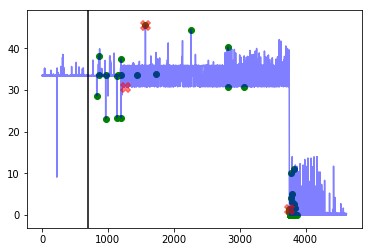




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.125
Corresponding window recall:  0.5
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [620, 683, 690, 718, 920, 978, 992, 1006, 1266, 1554, 2426, 2650, 2801, 2971, 2996, 3032, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3132, 3134, 3138, 3140, 3142, 3144, 3146, 3148, 3150, 3152, 3154, 3156, 3158, 3160, 3168, 3174, 3190, 3196, 3200, 3204, 3210]


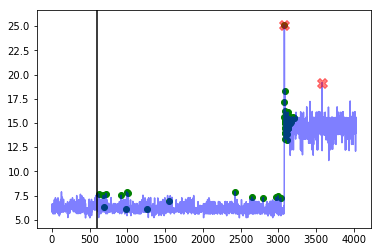




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [815, 864, 946, 947, 948, 949, 1152, 1440, 1728, 2585, 2586, 2845, 2917, 2975, 3593, 3594]


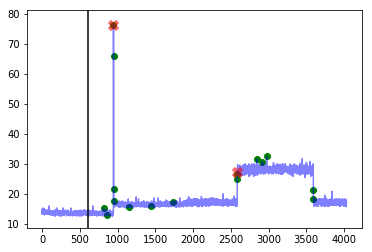




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1633, 1728, 2459, 2880, 2881, 2988, 2989, 2990, 3000, 3096, 3097, 3098, 3156, 3157]


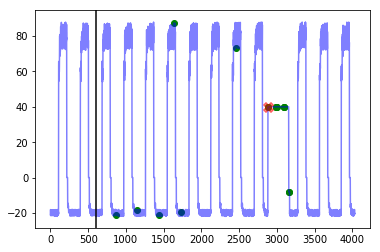




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2968, 2969, 2970, 2973, 2974, 2975]


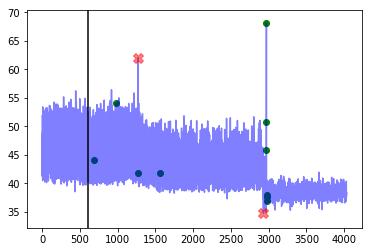




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1843, 3567, 3568, 3572, 3573, 3580, 3581, 3582]


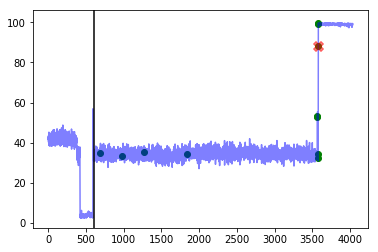




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [756, 864, 1152, 1440, 1728, 2988, 2989, 2990, 2991, 3000, 3096, 3097, 3098, 3099]


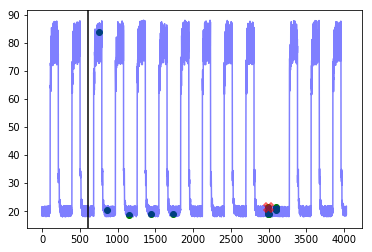




--- artificial_cd_1 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [201, 288, 400, 402, 406]


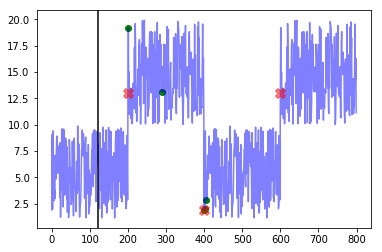




--- artificial_cd_2 ---
Corresponding window precision:  0.2727272727272727
Corresponding window recall:  0.375
Corresponding window false positives:  8
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [276, 288, 400, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 824, 825, 827, 830, 832, 835, 864, 1000, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1024, 1030, 1070, 1071, 1073, 1076]


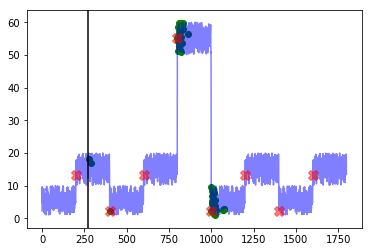




--- artificial_cd_3 ---
Corresponding window precision:  0.4
Corresponding window recall:  0.5
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201, 203, 288, 409, 576, 864]


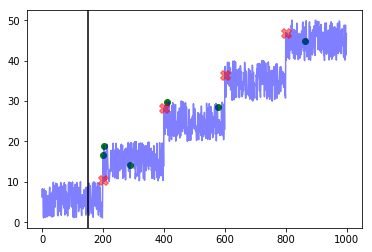

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.800000000000004
Best window threshold:  0.9999
Corresponding window overall precision:  0.2898550724637681
Corresponding window overall recall:  0.7407407407407407
Corresponding window overall F score:  0.4166666666666667



--- grok_asg_anomaly ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [830, 860, 864, 966, 967, 1134, 1135, 1152, 1200, 1201, 1202, 1440, 1569, 1728, 2258, 2824, 2825, 3071, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3799, 3800, 3801, 3802, 

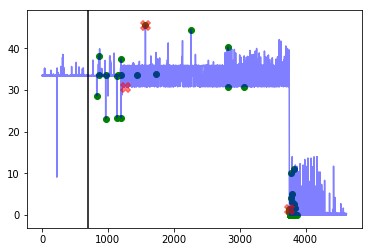




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.125
Corresponding window recall:  0.5
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [620, 683, 690, 718, 920, 978, 992, 1006, 1266, 1554, 2426, 2650, 2801, 2971, 2996, 3032, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3132, 3134, 3138, 3140, 3142, 3144, 3146, 3148, 3150, 3152, 3154, 3156, 3158, 3160, 3168, 3174, 3190, 3196, 3200, 3204, 3210]


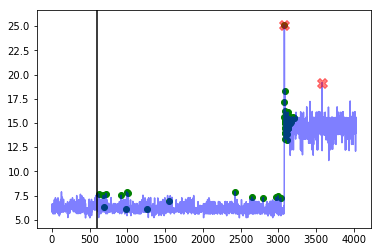




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [815, 864, 946, 947, 948, 949, 1152, 1440, 1728, 2585, 2586, 2845, 2917, 2975, 3593, 3594]


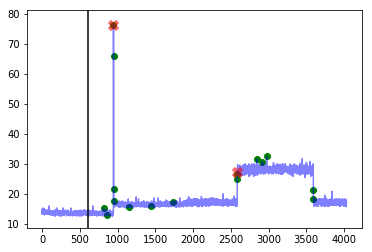




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1633, 1728, 2459, 2880, 2881, 2988, 2989, 2990, 3000, 3096, 3097, 3098, 3156, 3157]


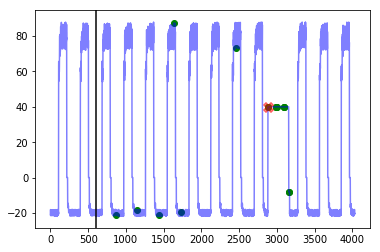




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2968, 2969, 2970, 2973, 2974, 2975]


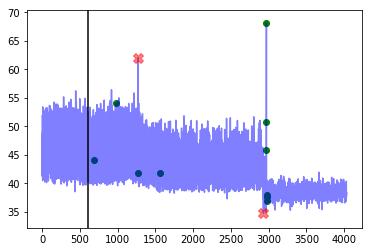




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1843, 3567, 3568, 3572, 3573, 3580, 3581, 3582]


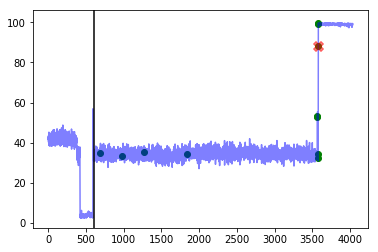




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [756, 864, 1152, 1440, 1728, 2988, 2989, 2990, 2991, 3000, 3096, 3097, 3098, 3099]


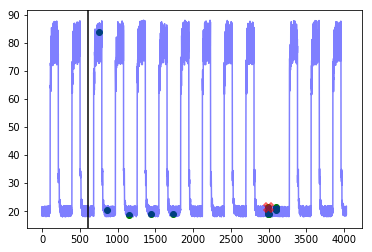




--- artificial_cd_1 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [201, 288, 400, 402, 406]


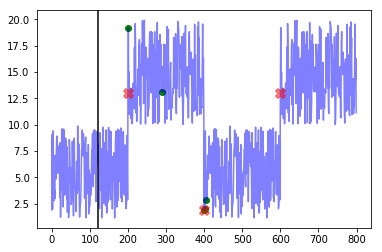




--- artificial_cd_2 ---
Corresponding window precision:  0.2727272727272727
Corresponding window recall:  0.375
Corresponding window false positives:  8
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [276, 288, 400, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 824, 825, 827, 830, 832, 835, 864, 1000, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1024, 1030, 1070, 1071, 1073, 1076]


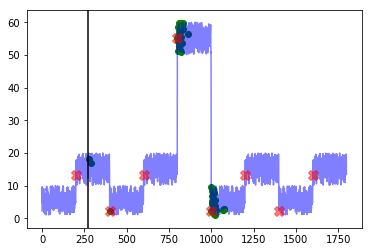




--- artificial_cd_3 ---
Corresponding window precision:  0.4
Corresponding window recall:  0.5
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201, 203, 288, 409, 576, 864]


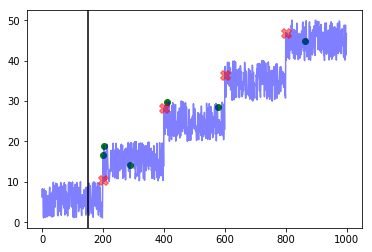

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.5
Best window threshold:  1.0
Corresponding window overall precision:  0.35714285714285715
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.36363636363636365



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3799, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821, 3823]


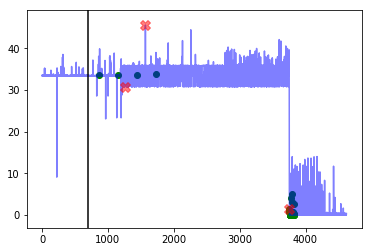




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


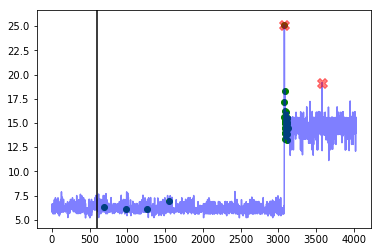




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 948, 2585]


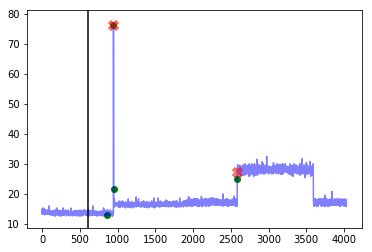




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 2989, 3096, 3156]


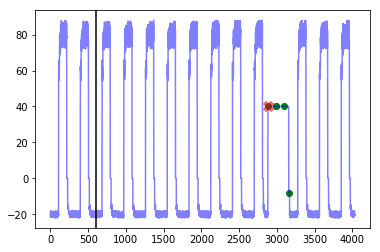




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


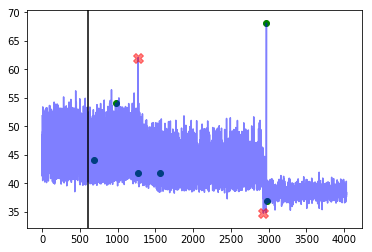




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


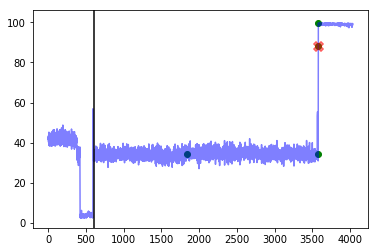




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 2988, 2989, 3096, 3097]


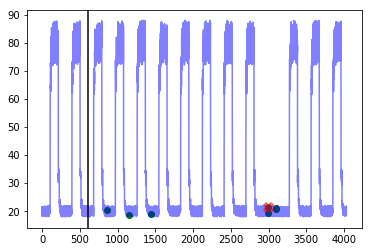




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


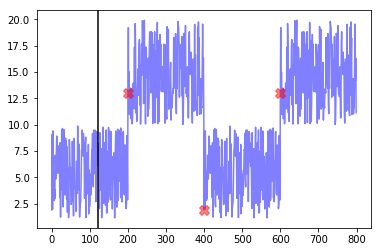




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


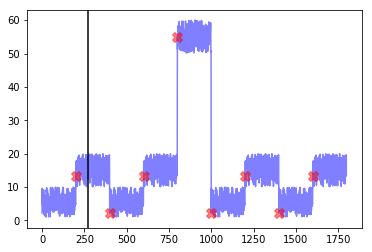




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


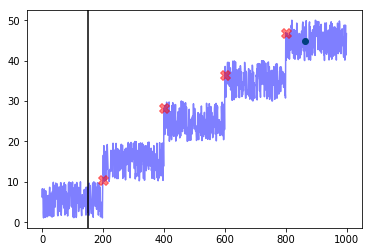

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.0
Best window threshold:  1.0
Corresponding window overall precision:  0.35714285714285715
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.36363636363636365



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3799, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821, 3823]


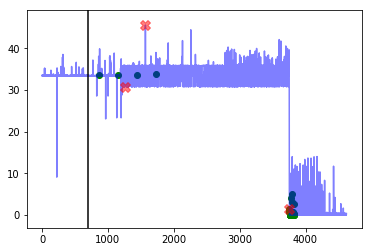




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


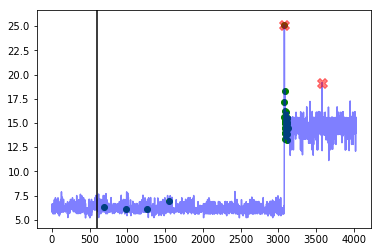




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 948, 2585]


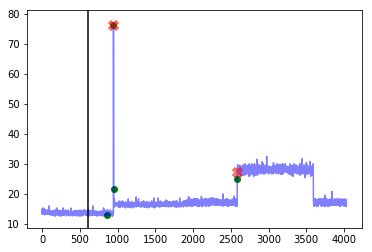




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 2989, 3096, 3156]


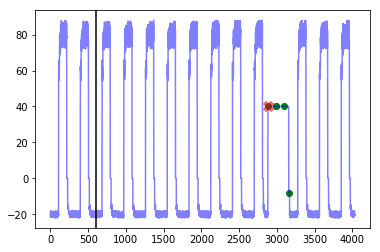




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


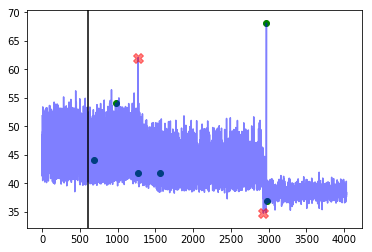




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


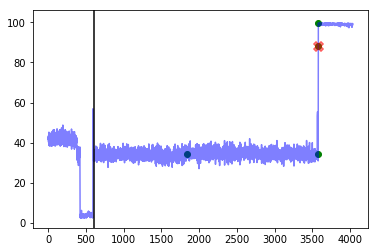




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 2988, 2989, 3096, 3097]


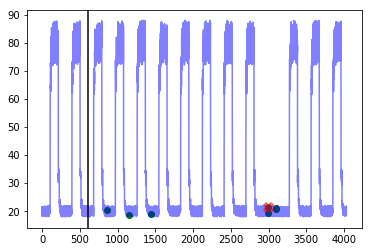




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


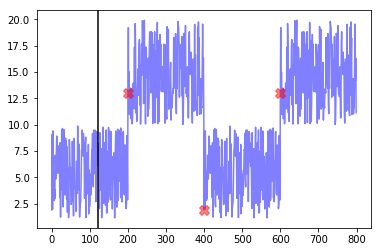




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


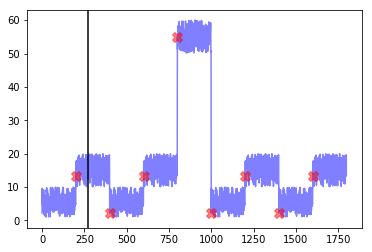




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


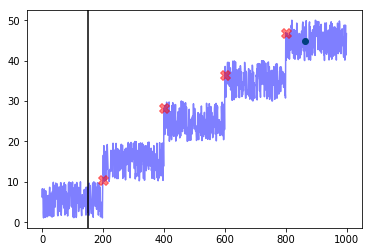

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.5
Best window threshold:  1.0
Corresponding window overall precision:  0.35714285714285715
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.36363636363636365



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3799, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821, 3823]


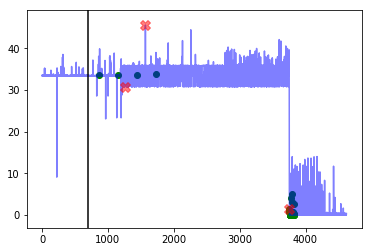




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


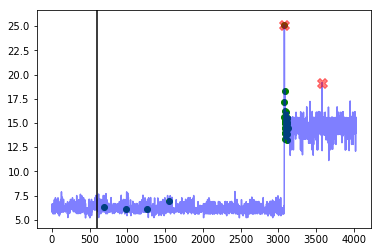




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 948, 2585]


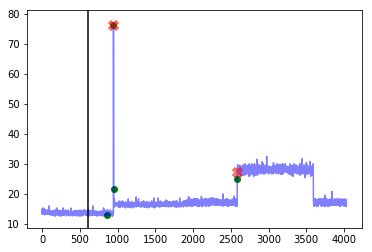




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 2989, 3096, 3156]


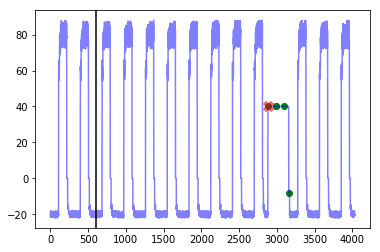




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


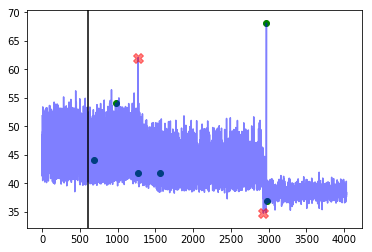




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


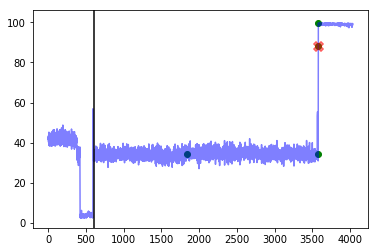




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 2988, 2989, 3096, 3097]


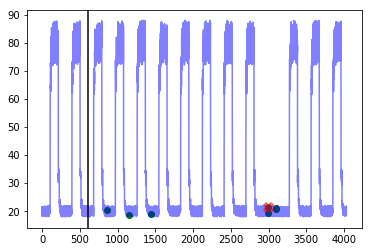




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


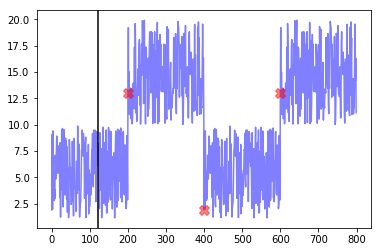




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


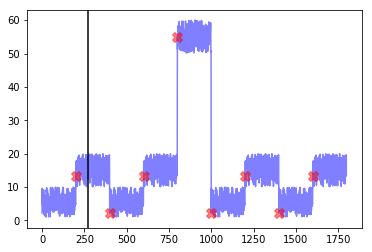




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


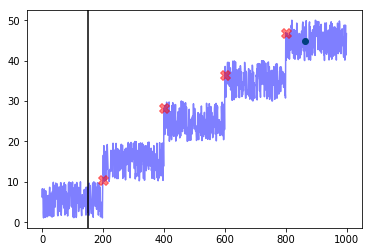

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  27.0
Best window threshold:  1.0
Corresponding window overall precision:  0.35714285714285715
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.36363636363636365



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3799, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821, 3823]


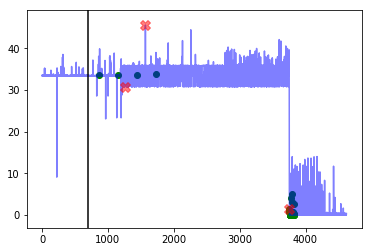




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


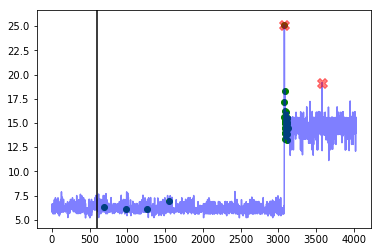




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 948, 2585]


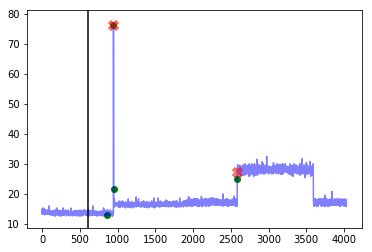




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 2989, 3096, 3156]


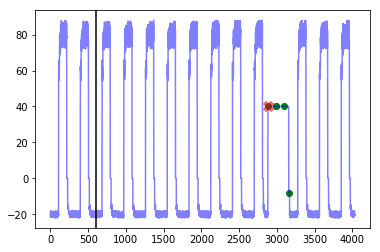




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


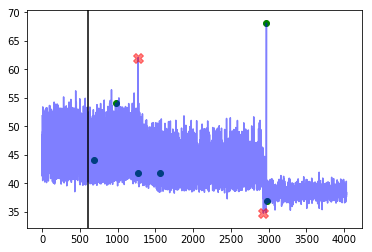




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


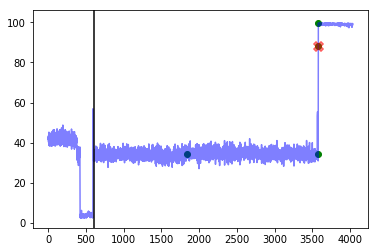




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 2988, 2989, 3096, 3097]


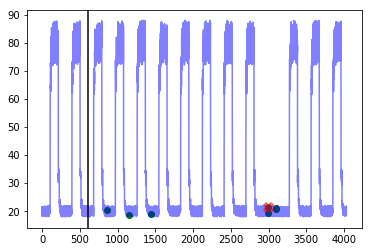




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


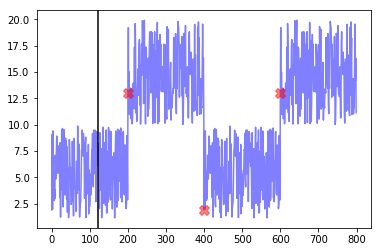




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


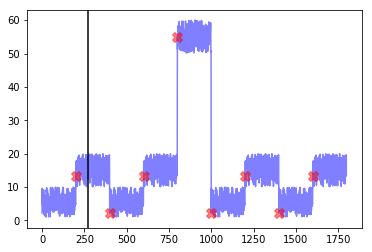




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


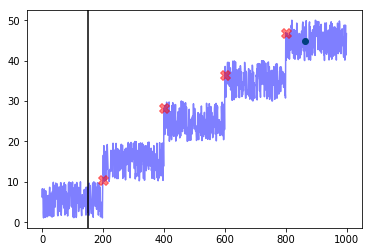

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  28.499999999999996
Best window threshold:  1.0
Corresponding window overall precision:  0.35714285714285715
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.36363636363636365



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3799, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 

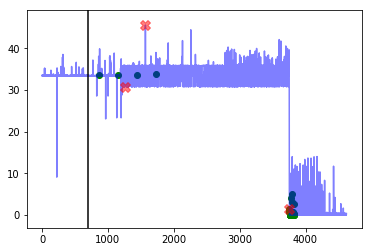




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


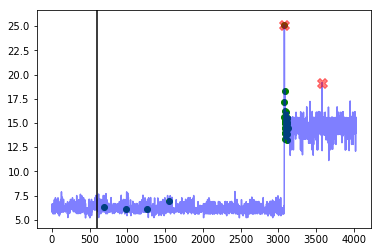




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 948, 2585]


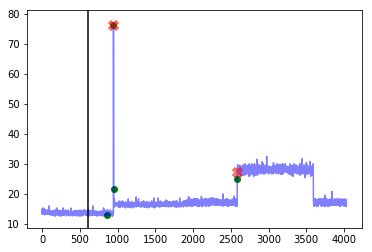




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 2989, 3096, 3156]


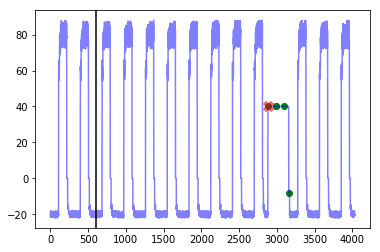




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


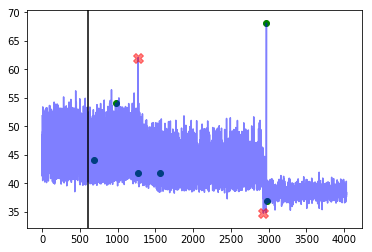




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


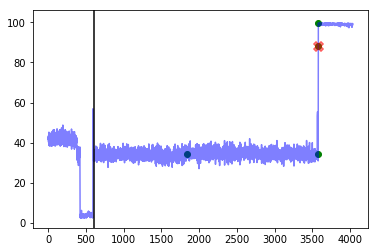




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 2988, 2989, 3096, 3097]


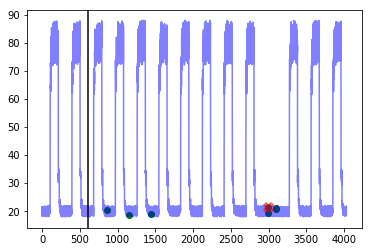




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


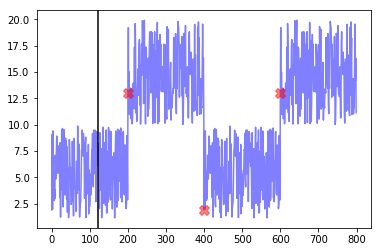




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


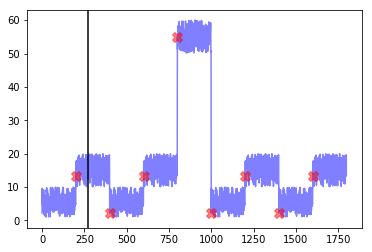




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


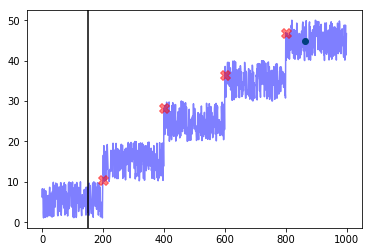

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  30.000000000000004
Best window threshold:  1.0
Corresponding window overall precision:  0.35714285714285715
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.36363636363636365



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3799, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 

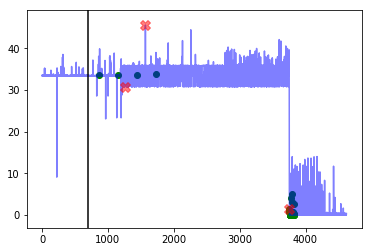




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


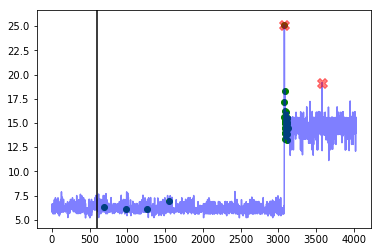




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 948, 2585]


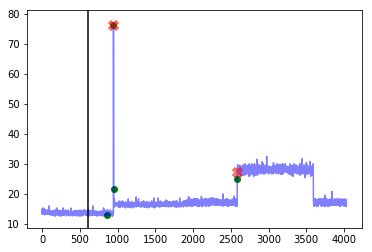




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 2989, 3096, 3156]


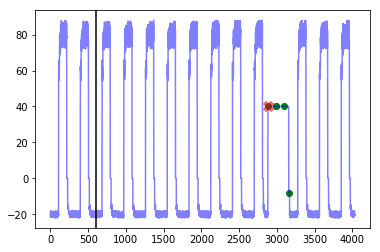




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


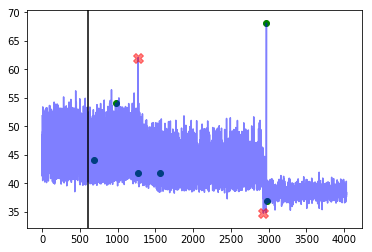




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


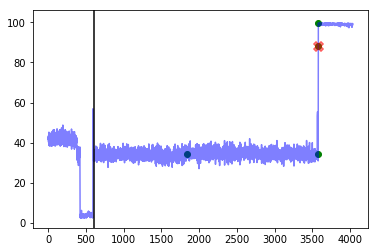




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 2988, 2989, 3096, 3097]


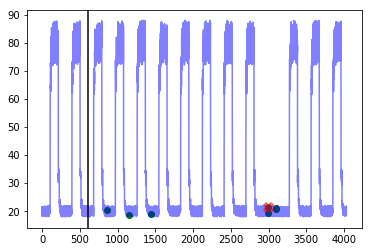




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


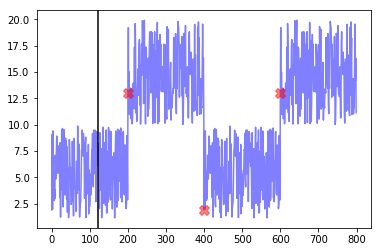




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


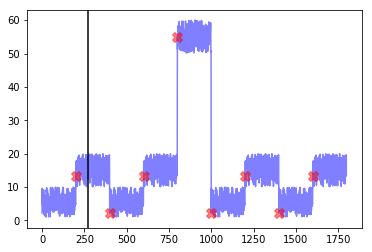




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


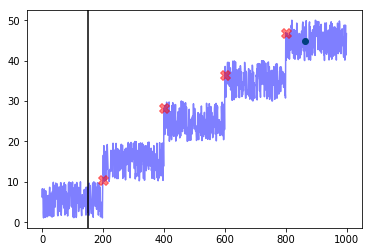

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  31.5
Best window threshold:  1.0
Corresponding window overall precision:  0.35714285714285715
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.36363636363636365



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3799, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821, 3823]


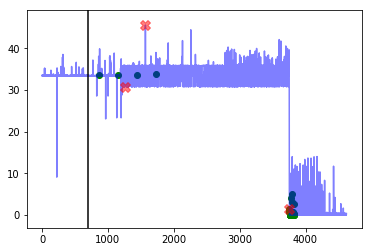




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


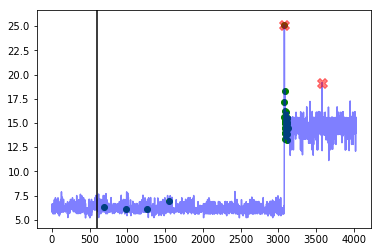




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 948, 2585]


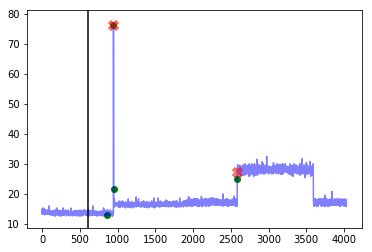




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 2989, 3096, 3156]


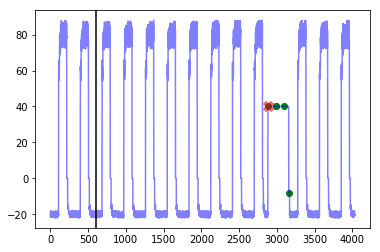




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


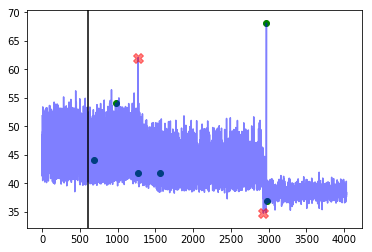




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


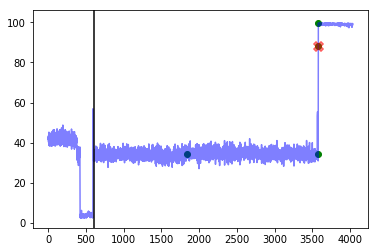




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 2988, 2989, 3096, 3097]


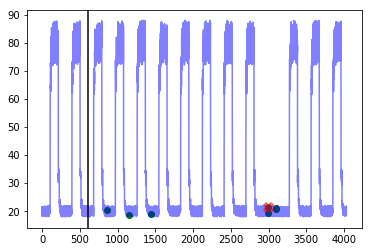




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


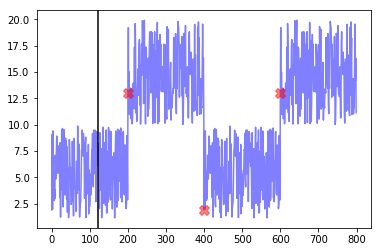




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


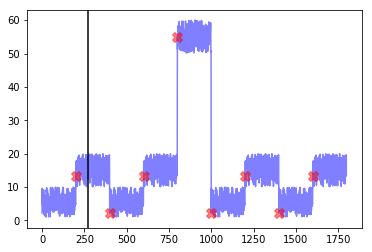




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


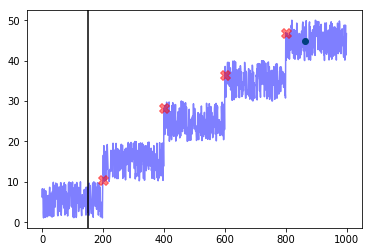

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  33.0
Best window threshold:  1.0
Corresponding window overall precision:  0.35714285714285715
Corresponding window overall recall:  0.37037037037037035
Corresponding window overall F score:  0.36363636363636365



--- grok_asg_anomaly ---
Corresponding window precision:  0.2
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 1728, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3799, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821, 3823]


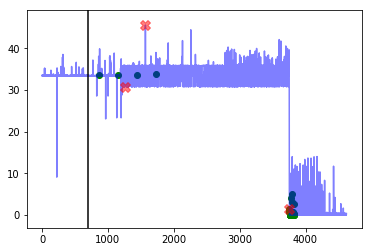




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [690, 978, 1266, 1554, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


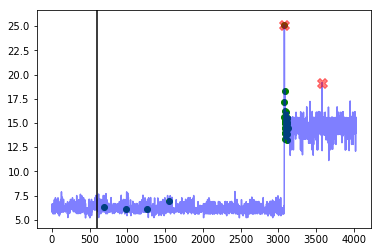




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 946, 948, 2585]


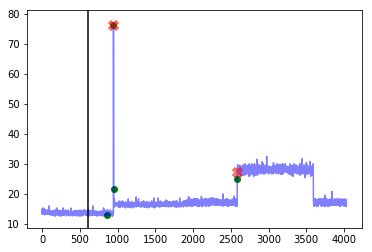




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2988, 2989, 3096, 3156]


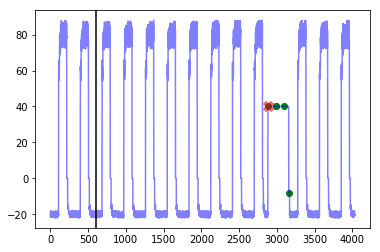




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


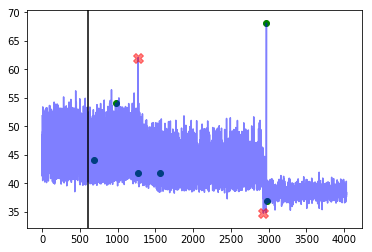




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


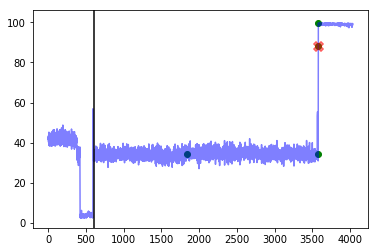




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [864, 1152, 1440, 2988, 2989, 3096, 3097]


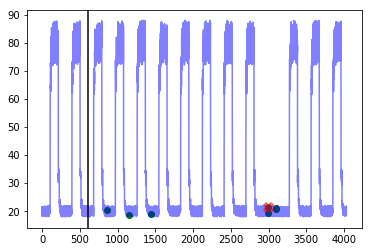




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


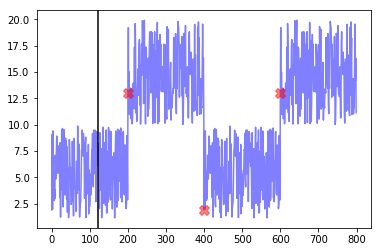




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


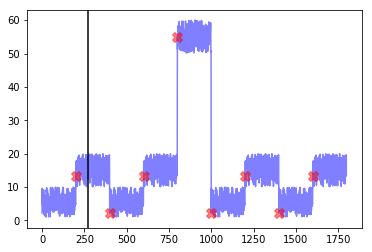




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


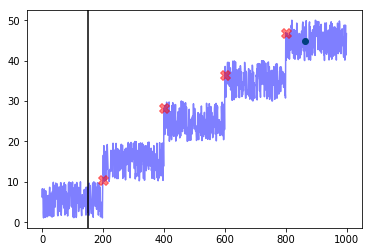

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 14.900000000000002
	 Best window threshold : 0.9999
	 Corresponding window overall precision : 0.2898550724637681
	 Corresponding window overall recall : 0.7407407407407407
	 Corresponding window overall F score : 0.4166666666666667
False Positive Weight:  0.2
	 Minimum number of mistakes : 19.800000000000004
	 Best window threshold : 0.9999
	 Corresponding window overall precision : 0.2898550724637681
	 Corresponding window overall recall : 0.7407407407407407
	 Corresponding window overall F score : 0.4166666666666667
False Positive Weight:  0.3
	 Minimum number of mistakes : 22.5
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.35714285714285715
	 Corresponding window overall recall : 0.37037037037037035
	 Corresponding window overall F score : 0.36363636363636365
False Positive Weight:  0.4
	 Minimum number of mistakes : 24.0
	 Best window threshold : 1.0
	 Corresponding window overall 

In [17]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# Facebook Prophet Results

In [18]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_prophet = joblib.load("anomaly_scores" + window_size + "/Prophet/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_prophet["Anomaly Scores"]

In [19]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.2: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.3: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.4: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.5: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.6: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.7: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.8: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.9: {'precision': 0.11764705882352941, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.9
Best window threshold:  0.9828
Corresponding window overall precision:  0.1564625850340136
Corresponding window overall recall:  0.8518518518518519
Corresponding window overall F score:  0.2643678160919541



--- grok_asg_anomaly ---
Corresponding window precision:  0.14285714285714285
Corresponding window recall:  1.0
Corresponding window false positives:  18
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [772, 830, 855, 856, 860, 873, 874, 875, 954, 955, 966, 1002, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1046, 1047, 1089, 1090, 1091, 1094, 1095, 1096, 1134, 1200, 1201, 1212, 1230, 1233, 1236, 1240, 1243, 1253, 1258, 1274, 1278, 1282, 1286, 1290, 1298, 1314, 1319, 1323, 1326, 1327, 1330, 1331, 1335, 1339, 1343, 1347, 1352, 1356, 1360, 1364, 1368, 1372, 1373, 1376, 1377, 1380

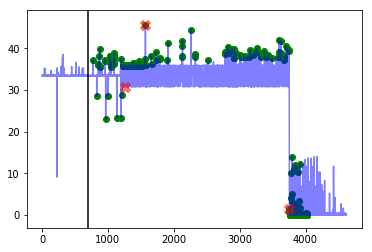




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.13333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  13
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [612, 620, 621, 632, 633, 648, 683, 691, 708, 717, 718, 721, 785, 805, 829, 831, 833, 835, 838, 839, 841, 843, 867, 873, 877, 899, 920, 925, 967, 969, 992, 996, 1006, 1048, 1087, 1093, 1101, 1103, 1105, 1106, 1107, 1111, 1112, 1113, 1115, 1123, 1129, 1131, 1132, 1137, 1139, 1141, 1145, 1149, 1158, 1159, 1161, 1165, 1168, 1171, 1173, 1175, 1180, 1188, 1205, 1209, 1211, 1213, 1215, 1279, 1285, 1328, 1353, 1363, 1381, 1383, 1386, 1389, 1401, 1405, 1408, 1413, 1415, 1417, 1419, 1422, 1423, 1425, 1427, 1437, 1441, 1443, 1447, 1450, 1467, 1479, 1482, 1488, 1509, 1573, 1693, 1699, 1701, 1710, 1713, 1715, 1717, 1719, 1723, 1739, 1747, 1749, 1801, 1804, 1851, 1858, 1887, 1893, 1895, 1897, 1903, 1951, 1953, 1981, 1983, 1987, 1989, 19

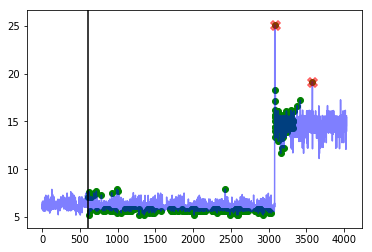




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [605, 617, 635, 650, 657, 671, 684, 688, 709, 723, 768, 797, 806, 815, 827, 833, 839, 841, 851, 860, 870, 878, 891, 902, 911, 943, 946, 947, 948, 2033, 2039, 2045, 2051, 2059, 2061, 2063, 2069, 2071, 2075, 2079, 2083, 2085, 2087, 2088, 2089, 2090, 2093, 2095, 2098, 2099, 2103, 2105, 2107, 2111, 2113, 2117, 2123, 2135, 2138, 2143, 2147, 2149, 2155, 2157, 2159, 2161, 2162, 2165, 2167, 2171, 2175, 2185, 2199, 2201, 2207, 2213, 2219, 2221, 2225, 2229, 2231, 2234, 2241, 2243, 2246, 2247, 2257, 2267, 2269, 2271, 2273, 2279, 2287, 2289, 2293, 2295, 2297, 2303, 2305, 2309, 2317, 2318, 2327, 2357, 2359, 2369, 2379, 2387, 2399, 2401, 2403, 2417, 2423, 2426, 2431, 2435, 2437, 2443, 2447, 2453, 2509, 2511, 2521, 2525, 2543, 2561, 2573, 2583, 2585, 2586

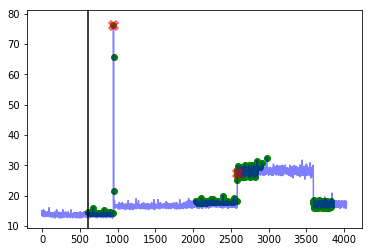




--- art_daily_flatmiddle ---
Corresponding window precision:  0.14285714285714285
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [678, 679, 680, 681, 682, 683, 684, 685, 686, 688, 786, 788, 789, 790, 791, 792, 793, 794, 795, 796, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 1075, 1076, 1077, 1078, 1079, 1080, 1081, 1082, 1083, 1084, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1372, 1542, 1543, 1544, 1545, 1546, 1547, 1548, 1549, 1550, 1651, 1652, 1653, 1654, 1655, 1656, 1657, 1658, 1659, 1660, 1830, 1831, 1832, 1833, 1834, 1835, 1836, 1837, 1838, 1839, 1937, 1940, 1941, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 2117, 2118, 2119, 2120, 2121, 2122, 2123, 2124, 2125, 2126, 2127, 2128, 2225, 2227, 2228, 2229, 2230, 2231, 2232, 2233, 2234, 2235, 2236, 2406, 2407, 2408, 2409, 2410, 24

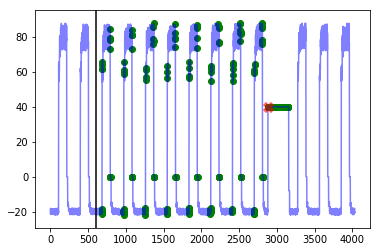




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [774, 822, 894, 902, 918, 1008, 1016, 1146, 1218, 1270, 1271, 2345, 2442, 2451, 2492, 2539, 2544, 2554, 2564, 2586, 2670, 2695, 2775, 2787, 2792, 2797, 2802, 2807, 2866, 2876, 2881, 2886, 2896, 2930, 2933, 2935, 2938, 2943, 2948, 2951, 2956, 2959, 2964, 2967, 2968, 2970, 2973, 2978, 2980, 2981, 2990, 2992, 2998, 3021, 3084, 4028]


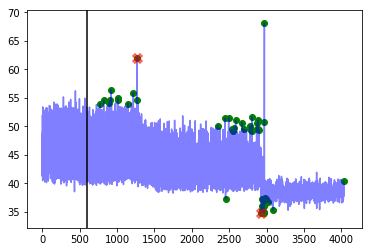




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [627, 628, 631, 633, 634, 635, 636, 637, 638, 639, 640, 641, 642, 643, 644, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 777, 778, 77

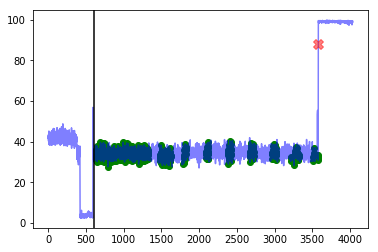




--- art_daily_nojump ---
Corresponding window precision:  0.14285714285714285
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [677, 678, 679, 680, 681, 682, 683, 684, 685, 786, 788, 789, 790, 791, 792, 793, 794, 795, 966, 967, 968, 969, 970, 971, 972, 973, 974, 977, 1071, 1073, 1076, 1078, 1079, 1080, 1081, 1082, 1083, 1084, 1085, 1086, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1261, 1262, 1263, 1265, 1363, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1373, 1540, 1541, 1542, 1543, 1544, 1545, 1546, 1547, 1548, 1651, 1652, 1653, 1655, 1656, 1657, 1658, 1659, 1661, 1829, 1830, 1831, 1832, 1833, 1834, 1835, 1837, 1938, 1940, 1941, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 2116, 2118, 2119, 2120, 2121, 2122, 2123, 2124, 2125, 2127, 2136, 2223, 2225, 2226, 2227, 2228, 2229, 2230, 2231, 2232, 2233, 2234, 2235, 2236, 2238, 2405, 2406, 2407, 2408, 2409, 2410, 241

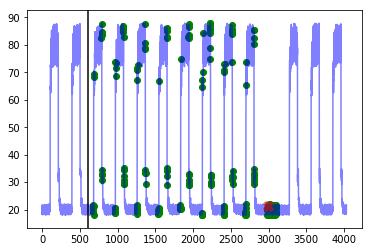




--- artificial_cd_1 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [200, 201, 203, 205, 207, 209, 213, 214, 217, 219, 220, 226, 229, 230, 232, 235, 236, 238, 239, 240, 242, 243, 247, 248, 256, 257, 261, 263, 270, 277, 400, 402, 423, 444]


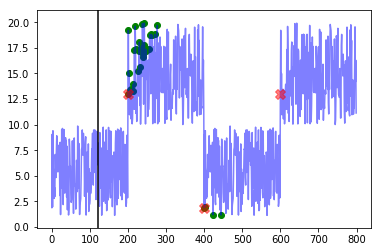




--- artificial_cd_2 ---
Corresponding window precision:  0.15151515151515152
Corresponding window recall:  0.625
Corresponding window false positives:  28
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [283, 298, 301, 302, 304, 306, 308, 310, 311, 313, 314, 315, 318, 319, 321, 326, 329, 330, 333, 335, 336, 341, 344, 347, 351, 352, 354, 358, 360, 361, 365, 367, 368, 373, 375, 376, 381, 382, 384, 385, 386, 387, 389, 390, 391, 392, 393, 394, 396, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 451, 452, 453, 454, 455, 456, 458, 459, 460, 462, 463, 465, 466, 467, 468, 469, 470, 471, 473, 474, 475, 476, 477, 478, 480, 482, 483, 487, 488, 489, 491, 496, 497, 498, 499, 500, 501, 503, 504, 505, 506, 510, 513, 515, 516, 519, 520, 525, 5

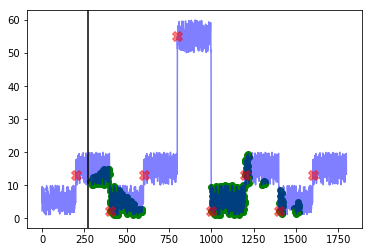




--- artificial_cd_3 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 203, 204, 207, 208, 210, 211, 213, 214, 215, 216, 226, 227, 231, 233, 234, 237, 243, 248, 251, 253, 260, 264, 276, 283, 286, 292, 400, 401, 402, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 415, 416, 417, 420, 421, 424, 426, 429, 430, 435, 438, 446, 451, 453, 457, 458, 459, 462, 465, 467, 471, 474, 600, 601, 602, 604, 605, 606, 607, 608, 609, 610, 611, 612, 613, 614, 616, 618, 621, 623, 626, 627, 628, 631, 632, 635, 640, 647, 651, 652, 665, 800, 802, 803, 805, 806, 807, 810, 811, 814, 817, 818, 819, 820, 821, 827, 829, 834, 836, 838, 839, 855, 856, 863, 867, 878]


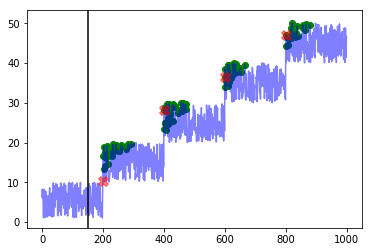

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.200000000000003
Best window threshold:  0.9999
Corresponding window overall precision:  0.2692307692307692
Corresponding window overall recall:  0.5185185185185185
Corresponding window overall F score:  0.35443037974683544



--- grok_asg_anomaly ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 954, 955, 966, 1002, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1089, 1090, 1091, 1095, 1096, 1134, 1200, 1569, 1729, 1915, 2131, 2132, 2258, 2824, 2878, 3600, 3625, 3700, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3

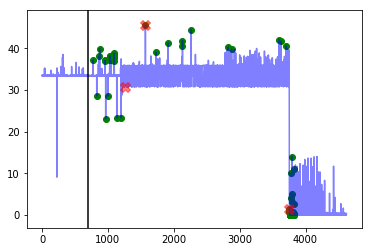




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [620, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3132, 3133, 3134, 3136, 3137, 3138, 3139, 3140, 3142, 3144, 3146, 3147, 3148, 3150, 3152, 3154, 3156, 3158, 3160, 3162, 3163, 3164, 3166, 3168, 3169, 3170, 3172, 3174, 3176, 3179, 3180, 3182, 3183, 3184, 3185, 3186, 3190, 3191, 3192, 3193, 3194, 3196, 3197, 3198, 3199, 3200, 3202, 3203, 3204, 3205, 3206, 3207, 3208, 3209, 3210, 3211, 3214, 3216, 3217, 3218, 3219, 3220, 3221, 3222]


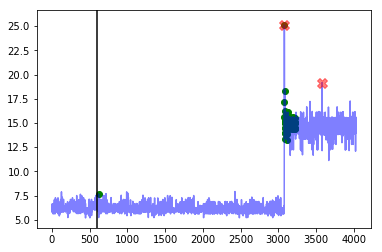




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 946, 947, 2111, 2399, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 2649, 2650, 2651, 2652, 2653, 2654, 2655, 2656, 2657, 2658, 2659, 2660, 2661, 2662, 2663, 2664, 2665, 2666, 2667, 2668, 2669, 2670, 2671, 2672, 2673, 2674, 2675, 2676, 2677, 2678, 2679, 2680, 2681, 2682, 2683, 2684, 2685, 2686, 2687, 2688, 2689, 2690, 2691, 2692, 2693, 2694, 2695, 2696, 2697, 2698, 2699, 2700, 2701, 2702, 2703, 27

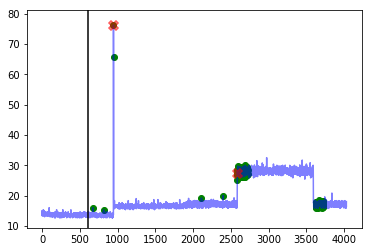




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1079, 1366, 1547, 1834, 1835, 1942, 2807, 2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887, 2888, 2889, 2890, 2891, 2892, 2893, 2894, 2895, 2896, 2897, 2898, 2899, 2900, 2901, 2902, 2903, 2904, 2905, 2906, 2907, 2908, 2909, 2910, 2911, 2912, 2913, 2914, 2915, 2916, 2917, 2918, 2919, 2920, 2921, 2922, 2923, 2950, 2951, 2952, 2953, 2954, 2955, 2956, 2957, 2958, 2959, 2960, 2961, 2962, 2963, 2964, 2965, 2966, 2967]


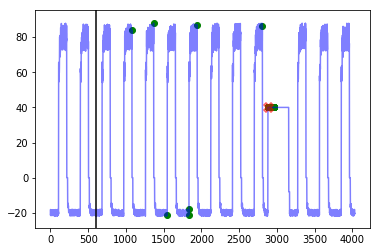




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


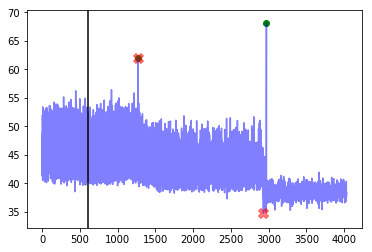




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [640, 645, 646, 647, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 691, 693, 694, 695, 697, 700]


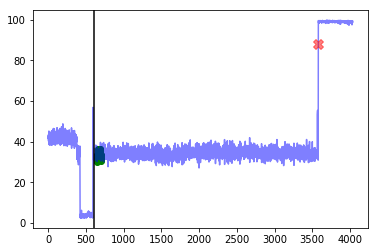




--- art_daily_nojump ---
Corresponding window precision:  0.14285714285714285
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [683, 791, 971, 972, 1078, 1259, 1367, 1655, 1835, 1942, 1943, 2123, 2230, 2699, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3056, 3057, 3058, 3059, 3060, 3061, 3062, 3063, 3064, 3065, 3066, 3067, 3068, 3069, 3070, 3071, 3072, 3073, 3074, 3075, 3076, 3077, 3078, 3079, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3091]


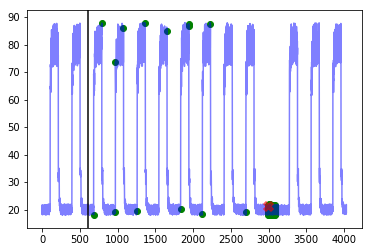




--- artificial_cd_1 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [201, 219]


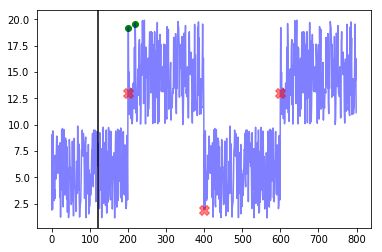




--- artificial_cd_2 ---
Corresponding window precision:  0.4
Corresponding window recall:  0.25
Corresponding window false positives:  3
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [400, 402, 404, 405, 408, 411, 413, 415, 417, 419, 1000, 1098, 1103, 1104, 1105, 1115, 1119, 1120]


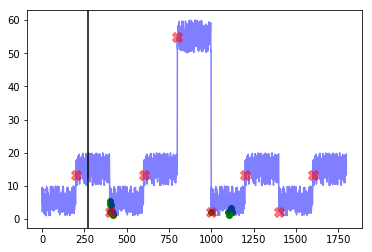




--- artificial_cd_3 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.25
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [201, 203, 208, 214]


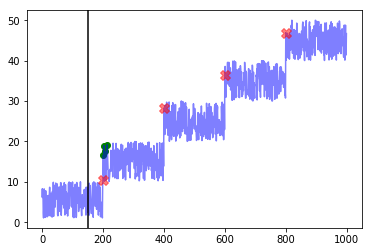

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.6
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821

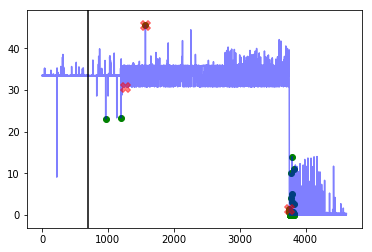




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


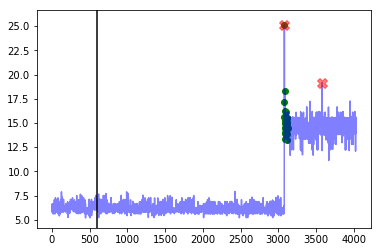




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


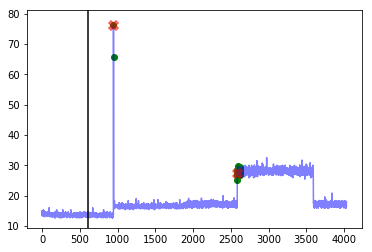




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


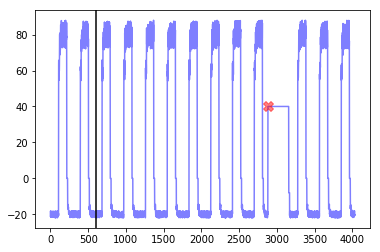




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


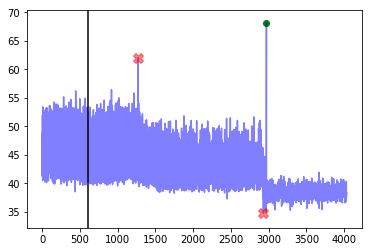




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


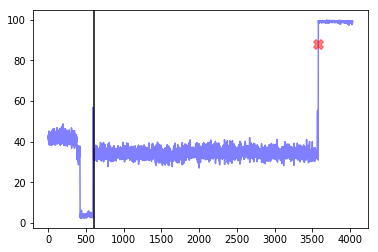




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3007, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023]


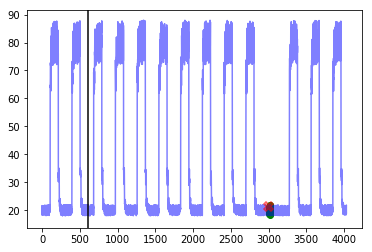




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


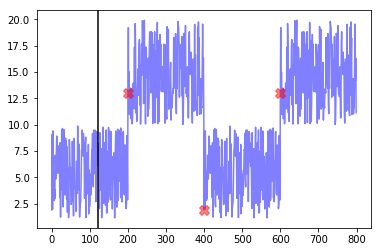




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


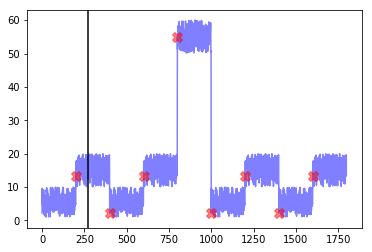




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


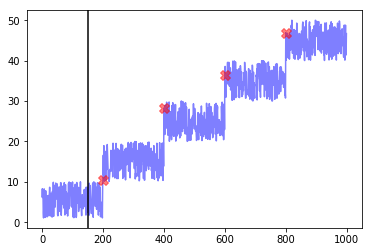

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.8
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821

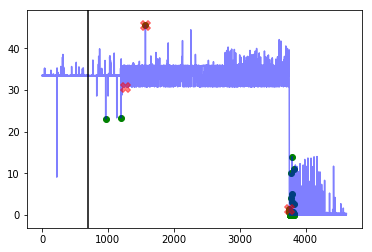




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


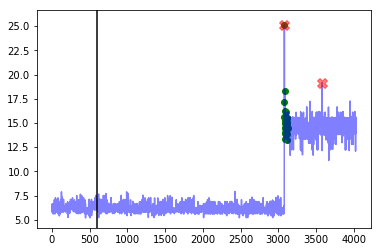




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


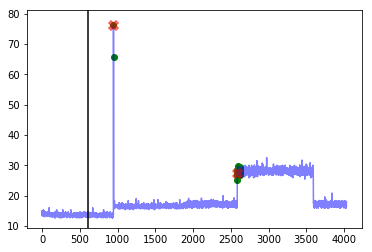




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


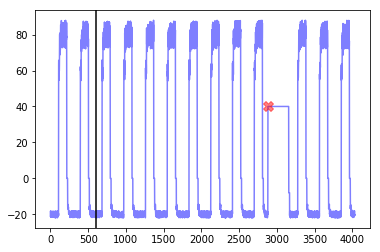




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


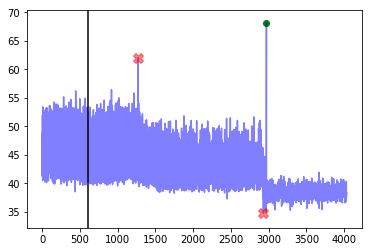




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


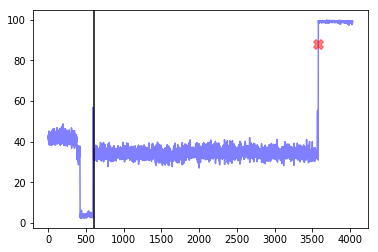




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3007, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023]


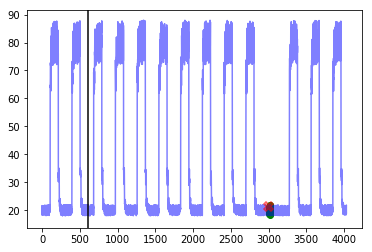




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


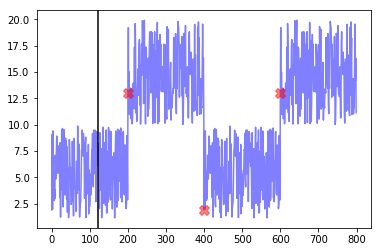




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


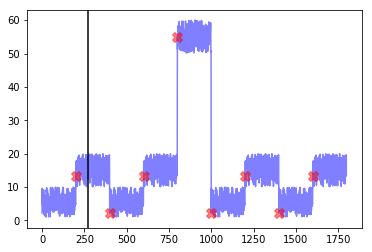




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


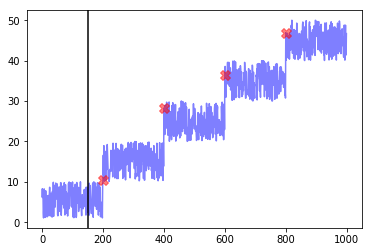

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.0
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821

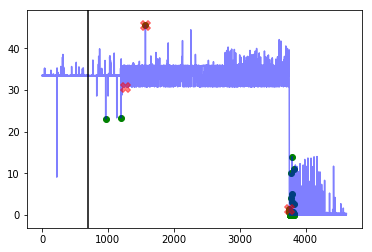




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


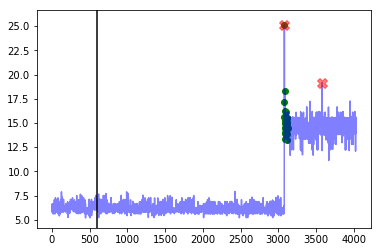




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


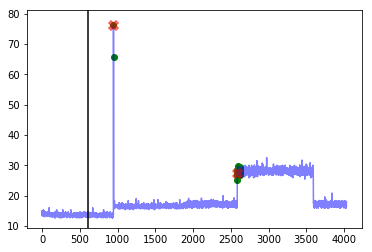




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


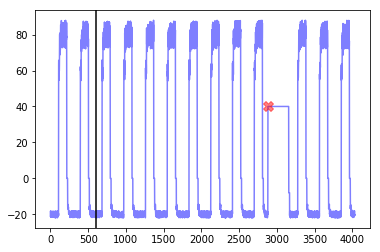




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


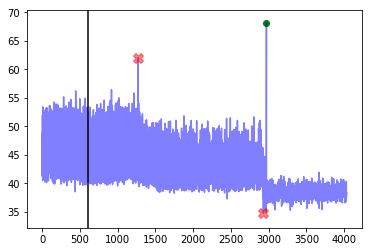




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


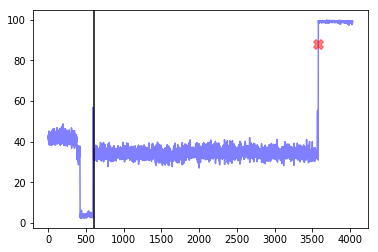




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3007, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023]


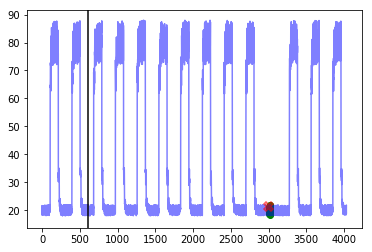




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


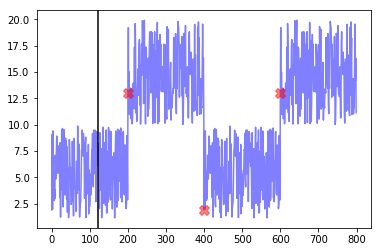




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


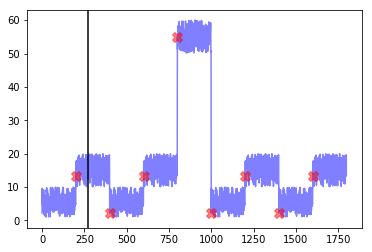




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


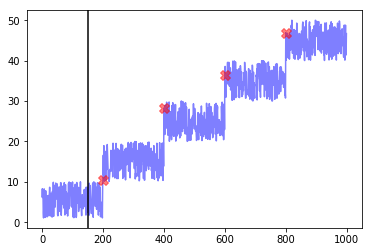

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.2
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821

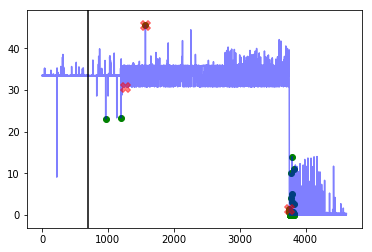




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


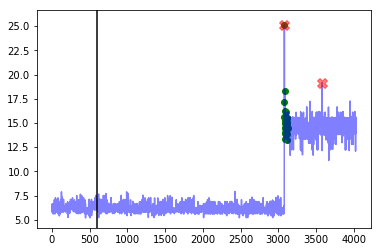




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


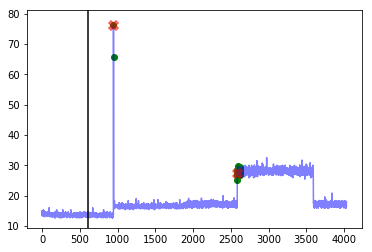




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


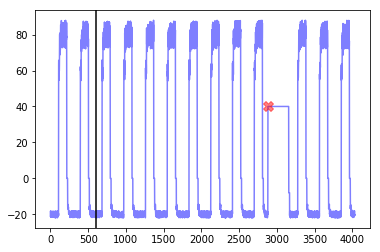




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


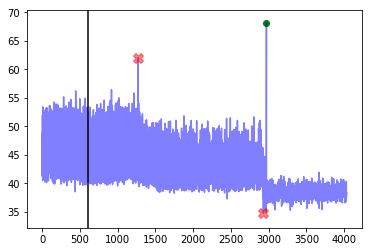




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


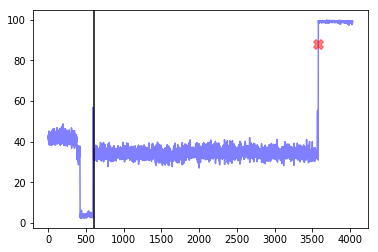




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3007, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023]


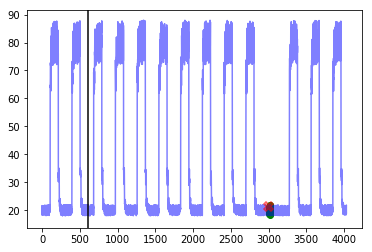




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


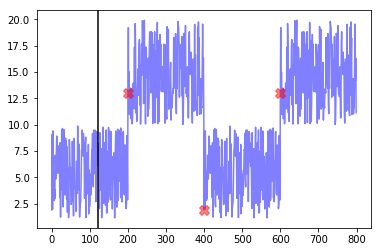




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


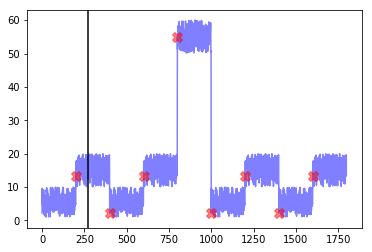




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


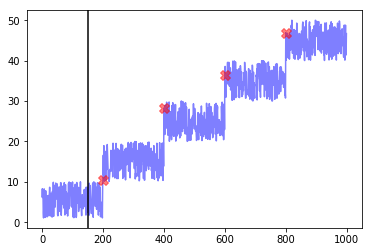

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.4
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821

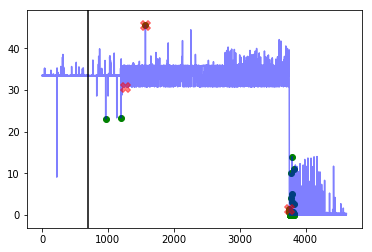




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


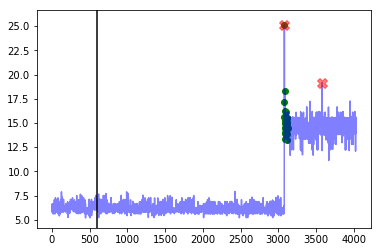




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


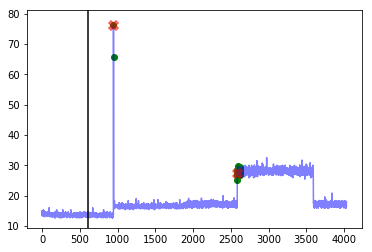




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


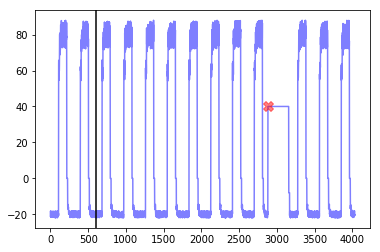




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


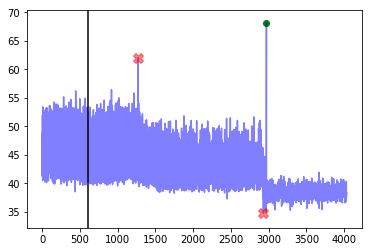




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


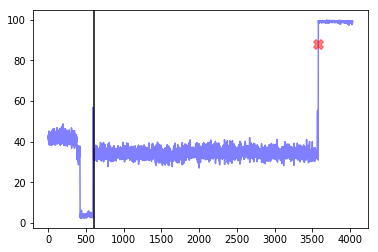




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3007, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023]


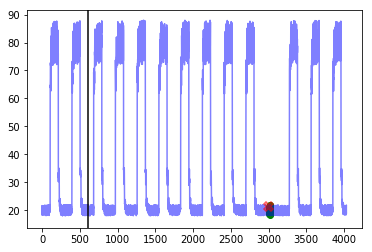




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


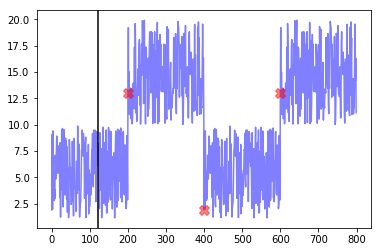




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


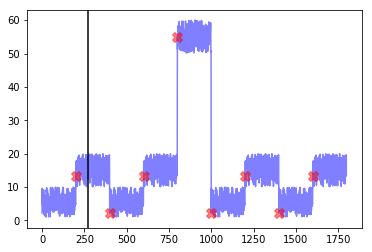




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


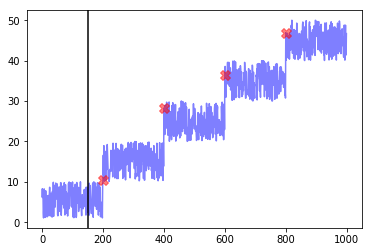

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.6
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821

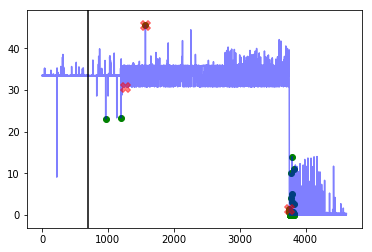




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


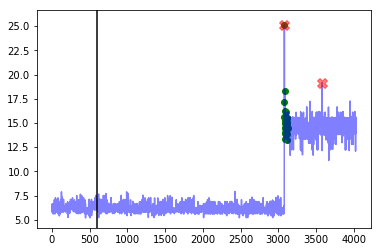




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


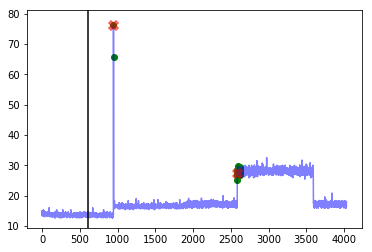




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


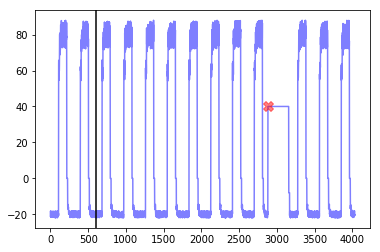




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


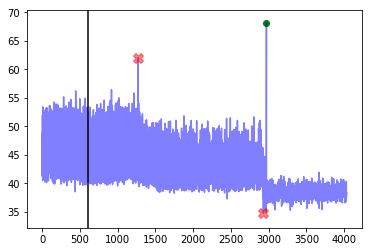




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


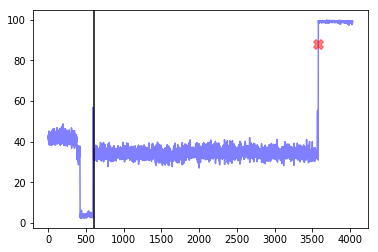




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3007, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023]


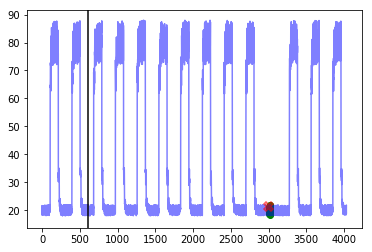




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


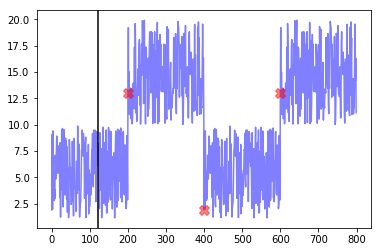




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


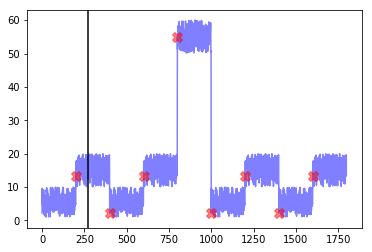




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


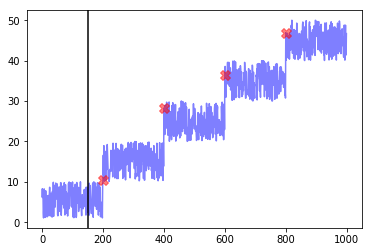

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.8
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821

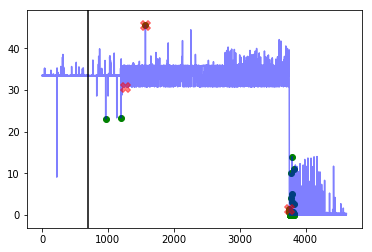




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


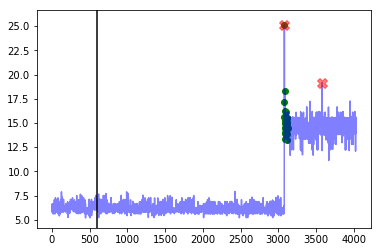




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


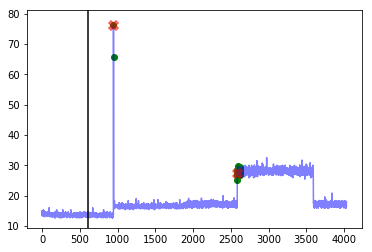




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


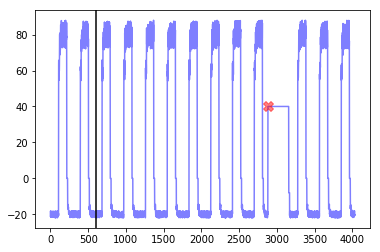




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


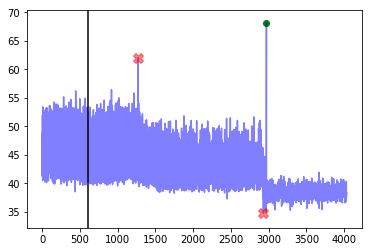




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


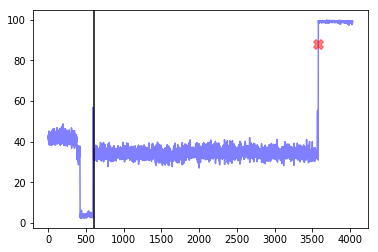




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3007, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023]


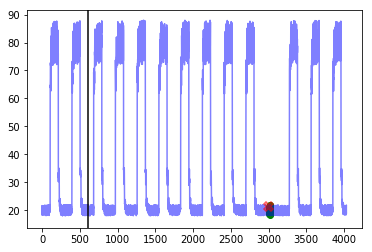




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


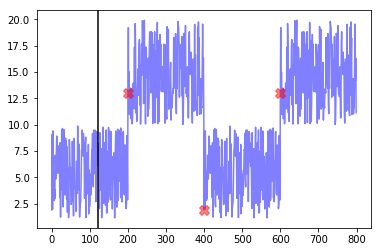




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


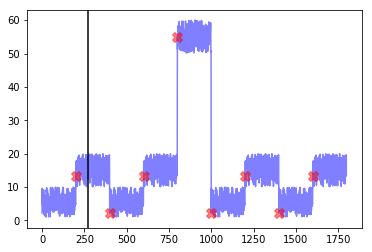




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


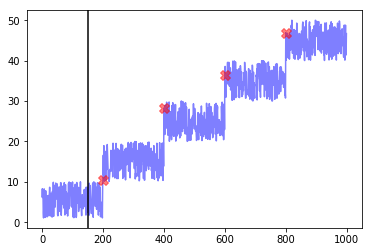

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.0
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820, 3821

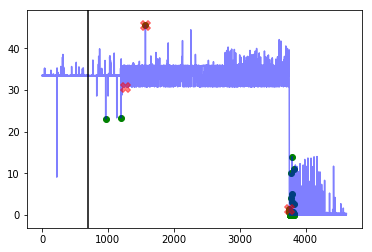




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


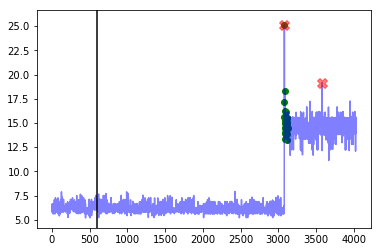




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


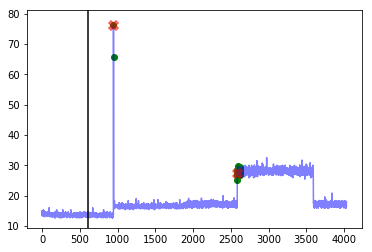




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


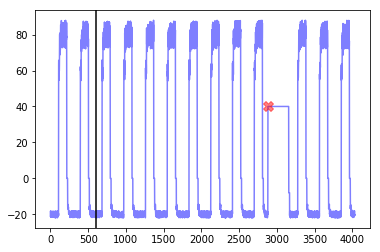




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


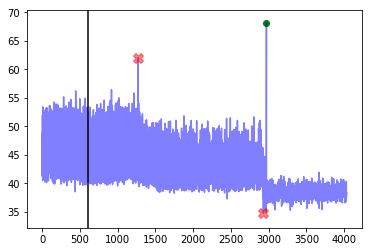




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


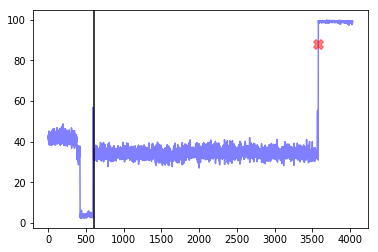




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3007, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023]


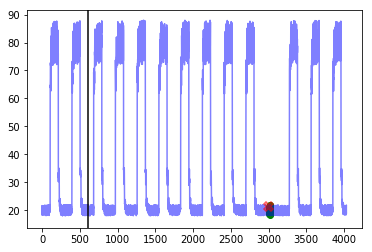




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


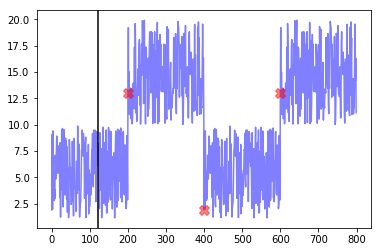




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


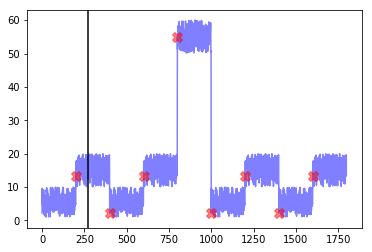




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


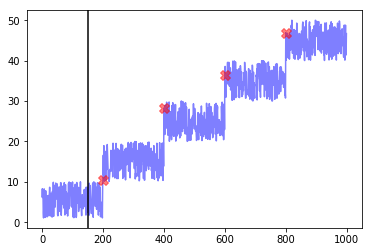

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 14.9
	 Best window threshold : 0.9828
	 Corresponding window overall precision : 0.1564625850340136
	 Corresponding window overall recall : 0.8518518518518519
	 Corresponding window overall F score : 0.2643678160919541
False Positive Weight:  0.2
	 Minimum number of mistakes : 20.200000000000003
	 Best window threshold : 0.9999
	 Corresponding window overall precision : 0.2692307692307692
	 Corresponding window overall recall : 0.5185185185185185
	 Corresponding window overall F score : 0.35443037974683544
False Positive Weight:  0.3
	 Minimum number of mistakes : 20.6
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.7777777777777778
	 Corresponding window overall recall : 0.25925925925925924
	 Corresponding window overall F score : 0.3888888888888889
False Positive Weight:  0.4
	 Minimum number of mistakes : 20.8
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.7

In [20]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# HTM Results

In [21]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/HTM/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [22]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.42857142857142855, 'recall': 0.75},
 0.2: {'precision': 0.5, 'recall': 0.75},
 0.3: {'precision': 0.6, 'recall': 0.75},
 0.4: {'precision': 0.6, 'recall': 0.75},
 0.5: {'precision': 0.75, 'recall': 0.75},
 0.6: {'precision': 0.5, 'recall': 0.25},
 0.7: {'precision': 0.5, 'recall': 0.25},
 0.8: {'precision': 0.5, 'recall': 0.25},
 0.9: {'precision': 0.5, 'recall': 0.25},
 1.0: {'precision': 1.0, 'recall': 0.25}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  12.6
Best window threshold:  0.0562
Corresponding window overall precision:  0.1864406779661017
Corresponding window overall recall:  0.8148148148148148
Corresponding window overall F score:  0.30344827586206896



--- grok_asg_anomaly ---
Corresponding window precision:  0.15789473684210525
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [773, 774, 775, 776, 777, 778, 779, 780, 781, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 860, 861, 862, 863, 864, 865, 866, 867, 868, 869, 874, 875, 876, 877, 878, 879, 880, 881, 882, 883, 884, 955, 956, 957, 958, 959, 960, 961, 962, 963, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035,

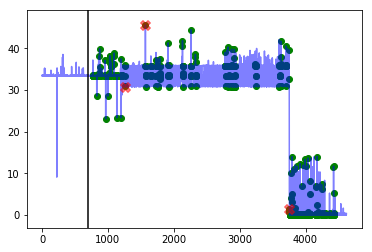




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [993, 994, 995, 996, 997, 998, 999, 1000, 1001, 2427, 2428, 2429, 2430, 2431, 2432, 2433, 2434, 2435, 2436, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3160, 3161, 3162, 3163, 3164, 3165, 3166, 3167, 3168, 3169, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3464, 3465, 3466, 3467, 3468, 3469, 3470, 3471, 3472, 3473, 3519, 3520, 3521, 3522, 3523, 3524, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3669, 3670, 3671, 3672, 3673, 367

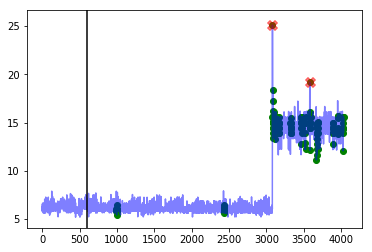




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 957, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3840, 3841, 3842, 3843, 3844, 3845, 3846, 3847, 3848, 3849]


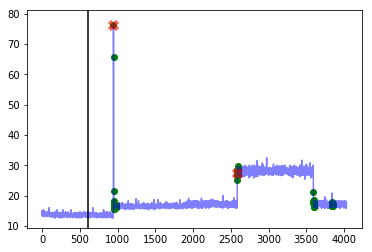




--- art_daily_flatmiddle ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 990, 991, 992, 996, 1080, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1368, 1369, 1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1382, 1383, 1384, 1385, 1386, 1387, 1388, 1389, 1390, 1391, 1392, 1393, 1548, 1549, 1550, 1551, 1552, 1553, 1554, 1555, 1556, 1557, 1656, 1657, 1658, 1659, 1660, 1661, 1662, 1663, 1664, 1665, 1669, 1670, 1671, 1672, 1673, 1674, 1675, 1676, 1677,

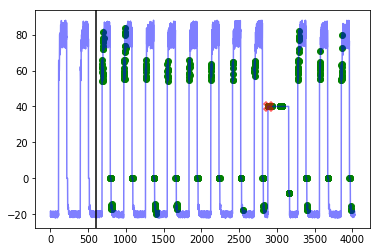




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  1.0
Corresponding window false positives:  11
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [669, 670, 671, 672, 673, 674, 675, 676, 677, 725, 726, 727, 730, 731, 732, 733, 734, 778, 787, 885, 886, 887, 888, 889, 890, 909, 919, 920, 921, 922, 923, 924, 925, 926, 927, 928, 999, 1000, 1001, 1016, 1017, 1018, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1330, 1331, 1332, 1333, 1334, 1335, 1336, 1337, 1338, 1339, 1342, 1354, 1361, 1362, 1363, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1376, 1377, 1378, 1379, 1384, 1385, 1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1449, 1450, 1451, 1452, 1453, 1454, 1455, 1456, 1457, 1458, 1459, 1460, 1461, 1462, 1463, 1464, 1465, 1466, 1467, 1468, 1469, 1470, 1471, 1472, 1473, 1474, 1

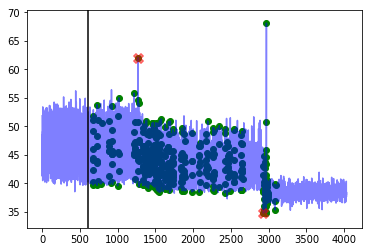




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [605, 606, 607, 608, 609, 3567, 3568, 3569, 3570, 3571, 3572, 3573, 3574, 3575, 3576, 3577, 3578, 3579, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592]


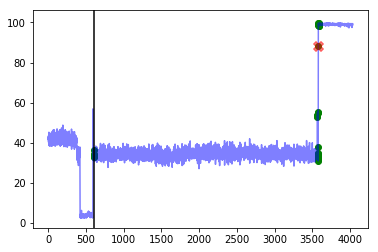




--- art_daily_nojump ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 1080, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1092, 1100, 1101, 1103, 1104, 1105, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1368, 1369, 1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1548, 1549, 1550, 1551, 1552, 1553, 1554, 1555, 1556, 1557, 1656, 1657, 1658, 1659, 1660, 1661, 1662, 1663, 1664, 1665, 1673, 1674, 1675, 1676, 1677, 1678, 1679, 1680, 1836, 1837, 1838, 1839, 1840, 1841, 1842, 1843, 1844, 1845, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1960, 1966, 1967, 1968, 1969, 2232, 2233, 2234, 2235, 2

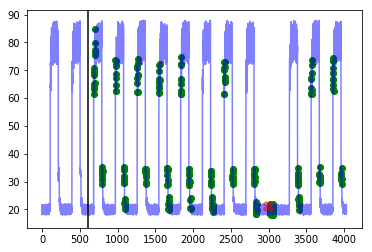




--- artificial_cd_1 ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [388, 389, 390, 391, 392, 531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 554, 555, 556, 557, 558, 559, 560, 561, 562, 563, 595, 596, 597, 598, 599, 600, 601, 602, 603, 604, 608, 609, 623, 624, 625, 626, 627, 628, 648, 649, 650, 651, 657, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 680, 681, 682, 683, 685, 686, 687, 688, 689, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 721, 722, 723, 724, 725, 761, 762, 763, 764, 765, 766, 767, 769, 770, 773, 774, 775, 776, 777, 778]


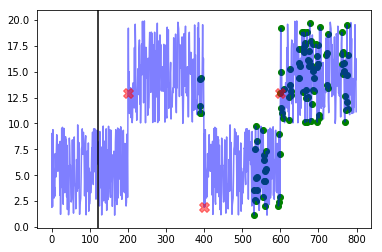




--- artificial_cd_2 ---
Corresponding window precision:  0.29411764705882354
Corresponding window recall:  0.625
Corresponding window false positives:  12
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 450, 453, 454, 455, 456, 457, 458, 459, 461, 462, 464, 465, 466, 467, 468, 469, 470, 479, 480, 481, 484, 485, 486, 487, 488, 524, 603, 604, 645, 646, 650, 652, 654, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 833, 834, 835, 836, 867, 869, 870, 871, 872, 873, 874, 875, 876, 881, 882, 883, 884, 885, 886, 887, 888, 889, 1000, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1409]


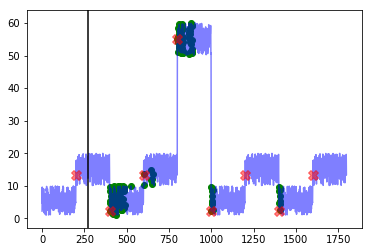




--- artificial_cd_3 ---
Corresponding window precision:  0.42857142857142855
Corresponding window recall:  0.75
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 486, 487, 488, 489, 490, 491, 492, 498, 601, 602, 603, 604, 605, 606, 607, 608, 609, 610, 611, 612, 613, 614, 615, 616, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836]


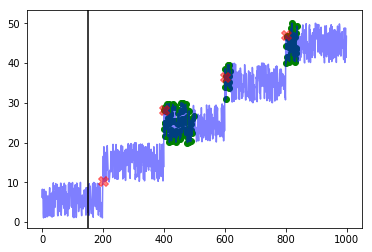

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.8
Best window threshold:  0.3634
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.5245901639344261



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [831, 875, 967, 1028, 1029, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1577, 2132, 2133, 2136, 3754, 3775, 3776, 3796, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3941, 4426]


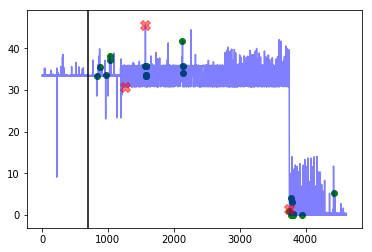




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2427, 2436, 3080, 3081, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3673, 3674]


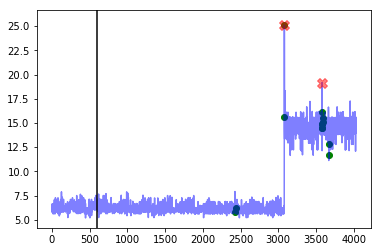




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586]


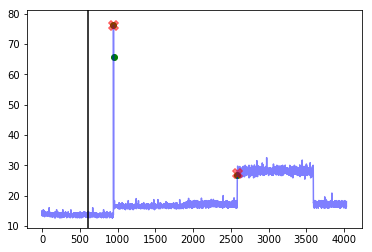




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [693, 2813, 2814, 2815, 2881, 2891, 3279, 3289, 3386, 3387, 3398, 3567, 3568, 3569, 3570, 3571, 3572, 3573, 3860, 3861]


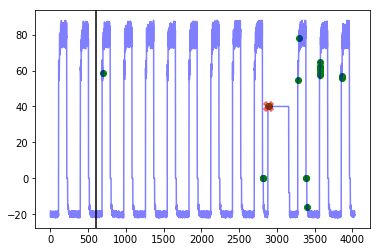




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1516, 1517, 1518, 1519, 1521, 1536, 1537, 1538, 1539, 1540, 1541, 1542, 1675, 2929, 2930, 2946, 2947, 2970]


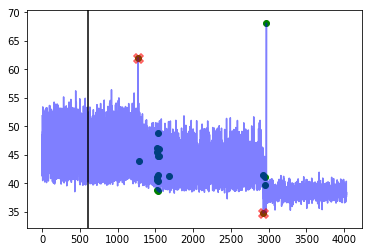




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3568, 3569, 3579, 3580, 3581]


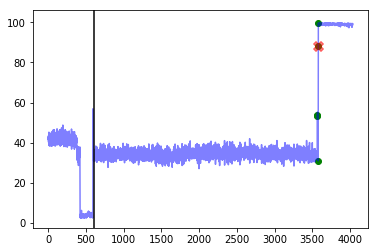




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 692, 693, 2254, 2255, 2256, 2258, 2259, 3025, 3026, 3045]


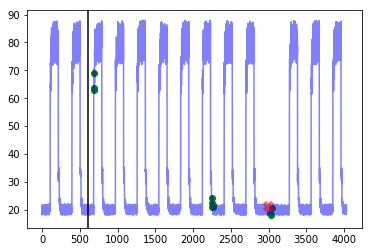




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


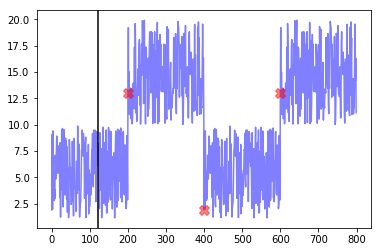




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [406, 431, 432, 434, 801, 826, 827, 828]


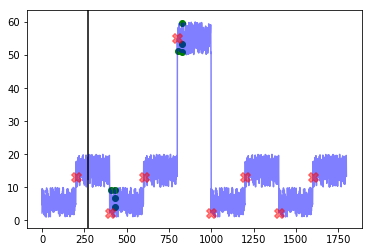




--- artificial_cd_3 ---
Corresponding window precision:  0.6
Corresponding window recall:  0.75
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [401, 434, 438, 458, 459, 460, 604, 605, 606, 611, 806, 807, 808, 809, 810]


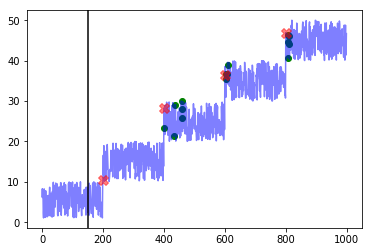

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.7
Best window threshold:  0.3634
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.5245901639344261



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [831, 875, 967, 1028, 1029, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1577, 2132, 2133, 2136, 3754, 3775, 3776, 3796, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3941, 4426]


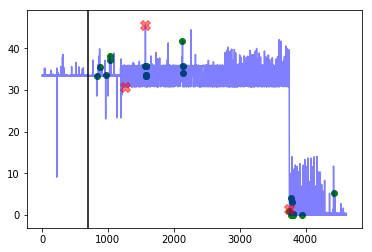




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2427, 2436, 3080, 3081, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3673, 3674]


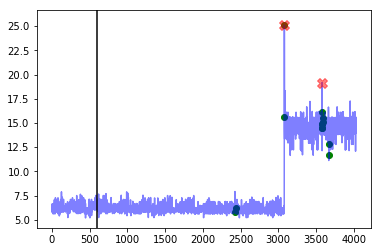




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586]


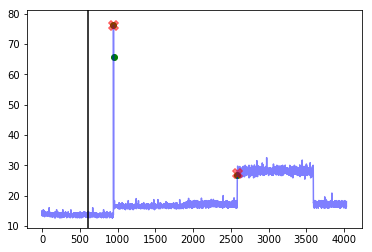




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [693, 2813, 2814, 2815, 2881, 2891, 3279, 3289, 3386, 3387, 3398, 3567, 3568, 3569, 3570, 3571, 3572, 3573, 3860, 3861]


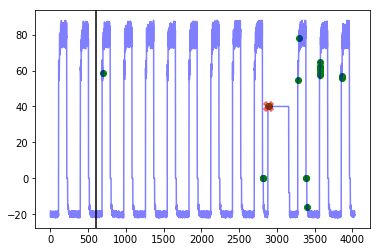




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1516, 1517, 1518, 1519, 1521, 1536, 1537, 1538, 1539, 1540, 1541, 1542, 1675, 2929, 2930, 2946, 2947, 2970]


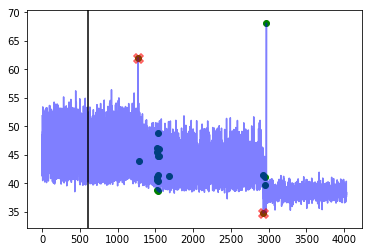




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3568, 3569, 3579, 3580, 3581]


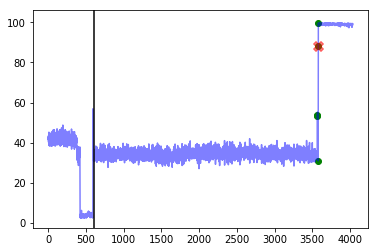




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 692, 693, 2254, 2255, 2256, 2258, 2259, 3025, 3026, 3045]


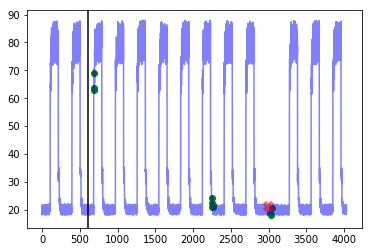




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


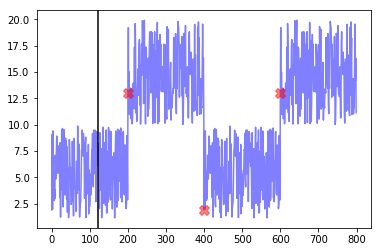




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [406, 431, 432, 434, 801, 826, 827, 828]


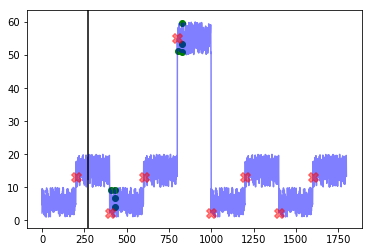




--- artificial_cd_3 ---
Corresponding window precision:  0.6
Corresponding window recall:  0.75
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [401, 434, 438, 458, 459, 460, 604, 605, 606, 611, 806, 807, 808, 809, 810]


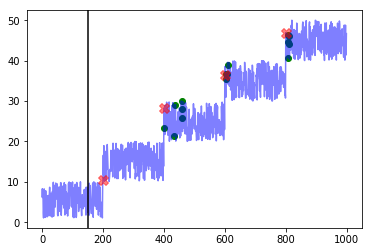

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.6
Best window threshold:  0.3634
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.5925925925925926
Corresponding window overall F score:  0.5245901639344261



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [831, 875, 967, 1028, 1029, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1577, 2132, 2133, 2136, 3754, 3775, 3776, 3796, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3941, 4426]


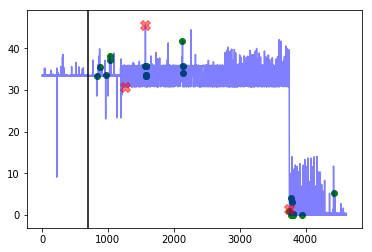




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2427, 2436, 3080, 3081, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3673, 3674]


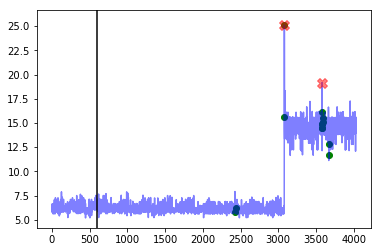




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586]


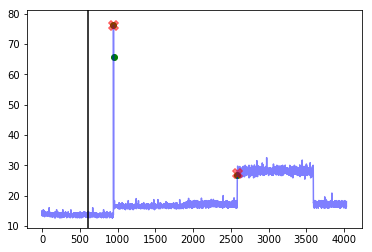




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [693, 2813, 2814, 2815, 2881, 2891, 3279, 3289, 3386, 3387, 3398, 3567, 3568, 3569, 3570, 3571, 3572, 3573, 3860, 3861]


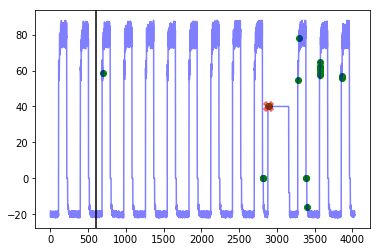




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1516, 1517, 1518, 1519, 1521, 1536, 1537, 1538, 1539, 1540, 1541, 1542, 1675, 2929, 2930, 2946, 2947, 2970]


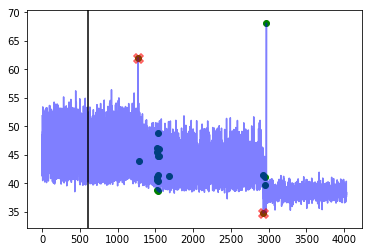




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3568, 3569, 3579, 3580, 3581]


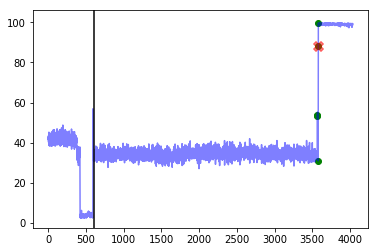




--- art_daily_nojump ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 692, 693, 2254, 2255, 2256, 2258, 2259, 3025, 3026, 3045]


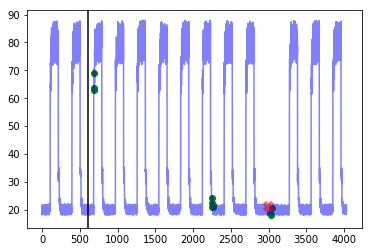




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


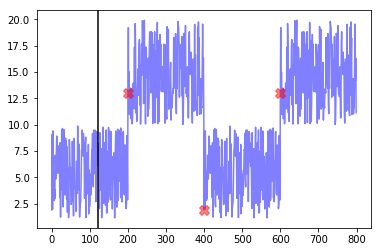




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [406, 431, 432, 434, 801, 826, 827, 828]


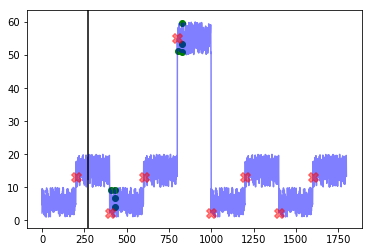




--- artificial_cd_3 ---
Corresponding window precision:  0.6
Corresponding window recall:  0.75
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [401, 434, 438, 458, 459, 460, 604, 605, 606, 611, 806, 807, 808, 809, 810]


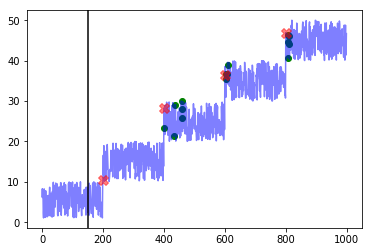

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.5
Best window threshold:  0.6084
Corresponding window overall precision:  0.7333333333333333
Corresponding window overall recall:  0.4074074074074074
Corresponding window overall F score:  0.5238095238095238



--- grok_asg_anomaly ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [831, 875, 1029, 3754, 3799]


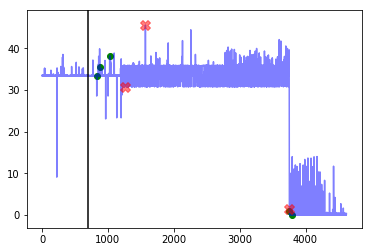




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081, 3674]


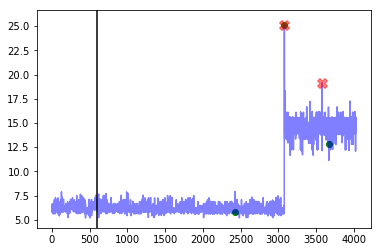




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


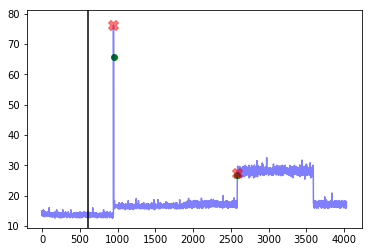




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


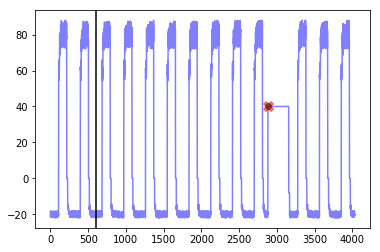




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2930]


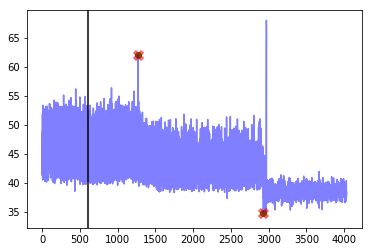




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


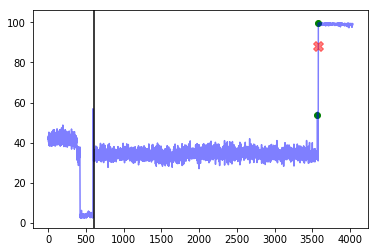




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


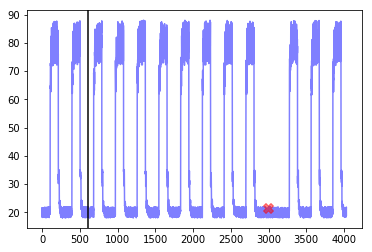




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


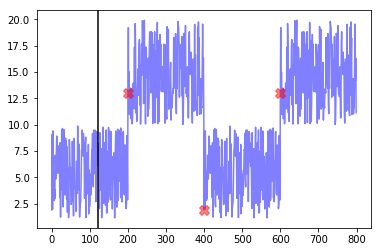




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


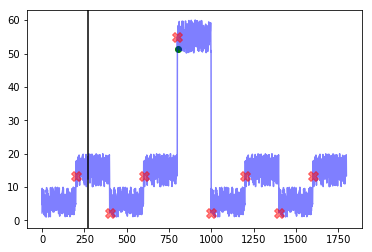




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


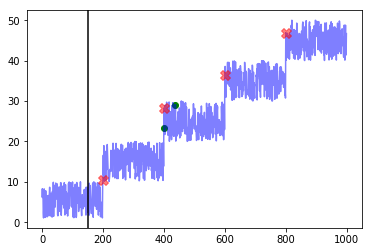

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.8
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


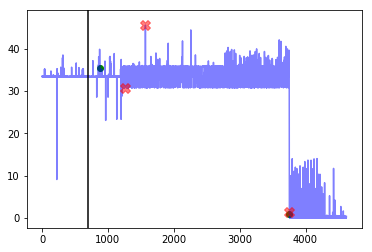




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


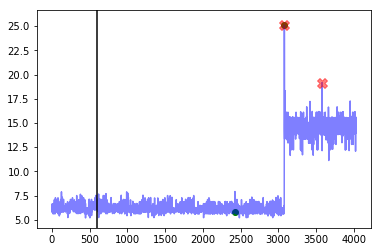




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


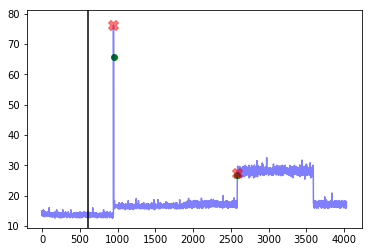




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


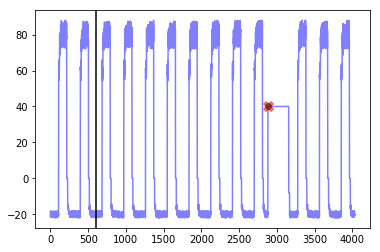




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


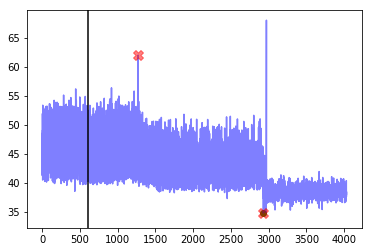




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


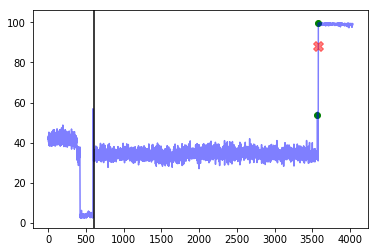




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


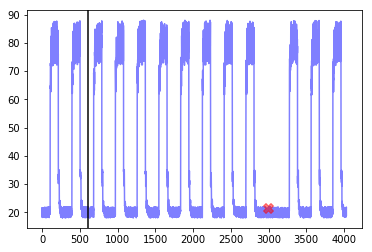




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


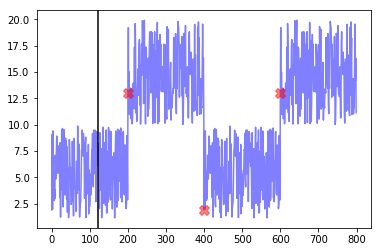




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


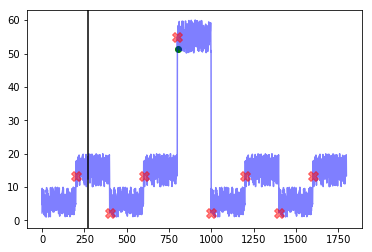




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


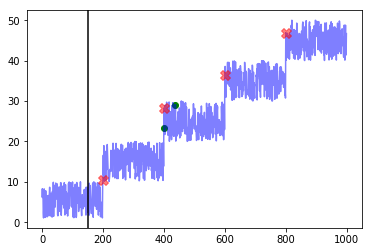

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.099999999999998
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


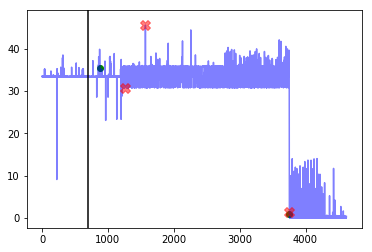




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


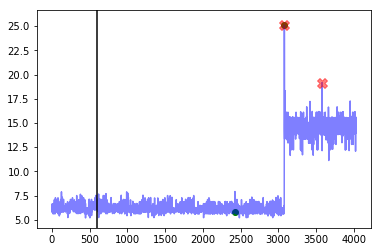




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


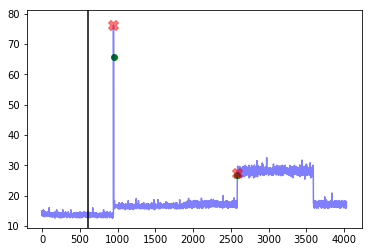




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


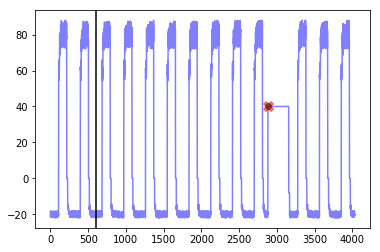




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


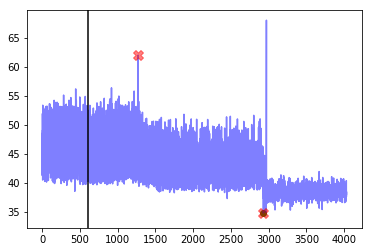




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


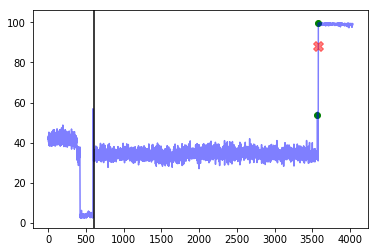




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


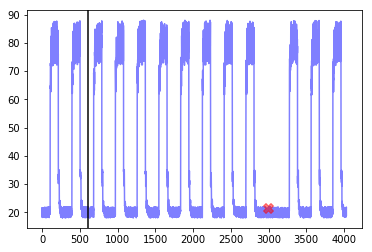




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


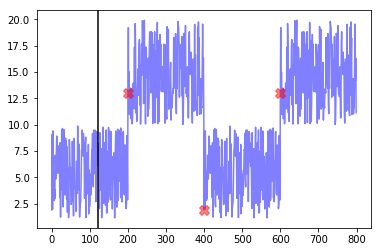




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


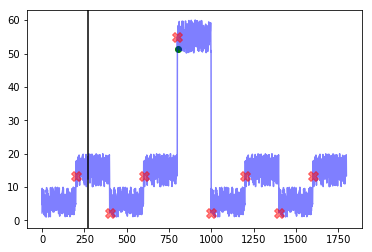




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


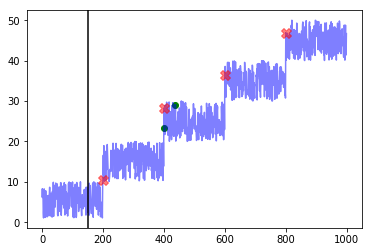

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.400000000000002
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


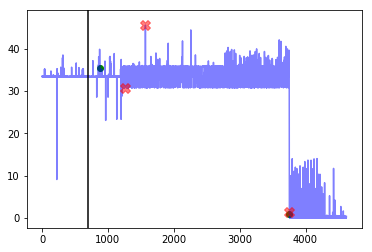




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


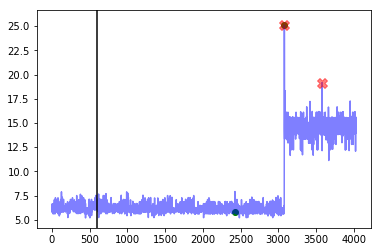




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


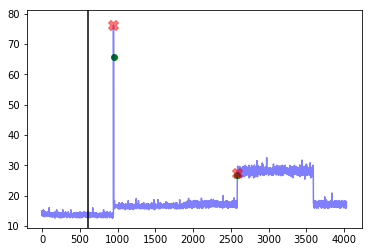




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


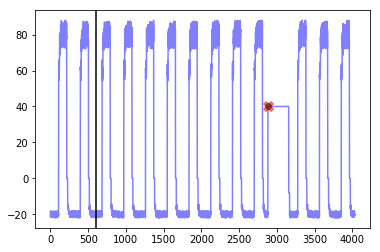




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


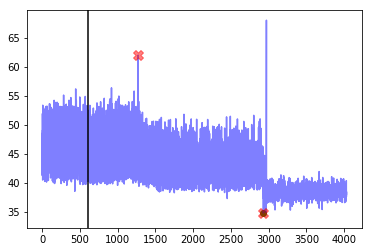




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


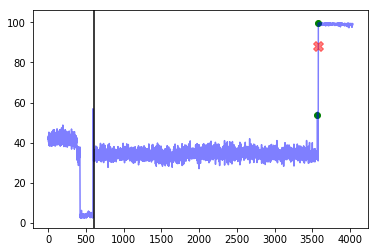




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


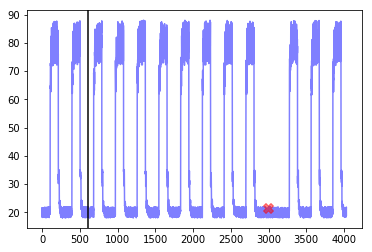




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


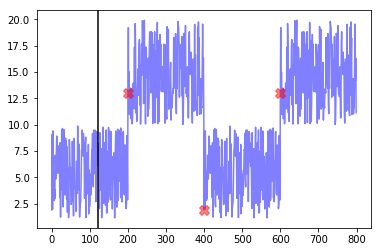




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


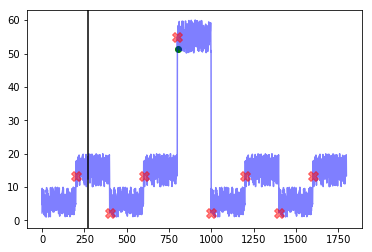




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


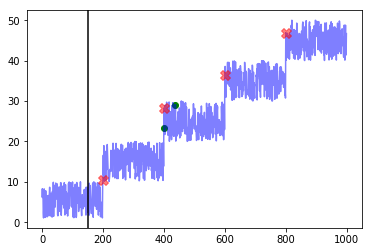

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.7
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


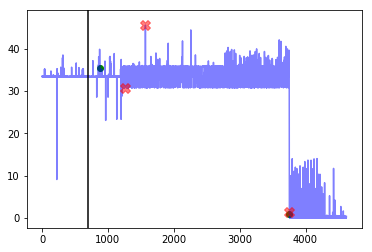




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


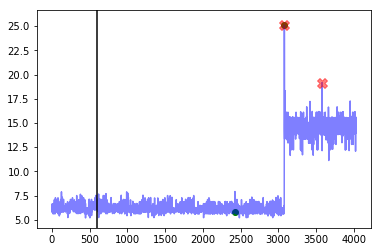




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


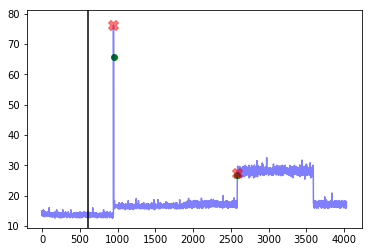




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


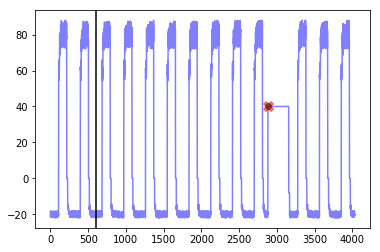




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


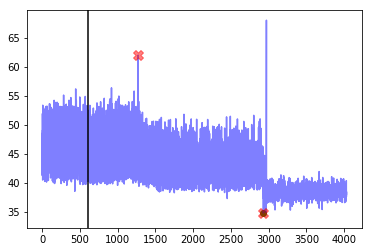




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


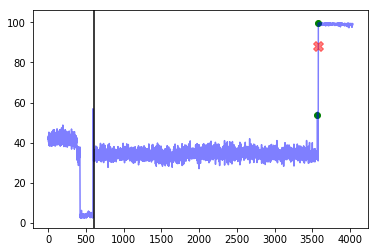




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


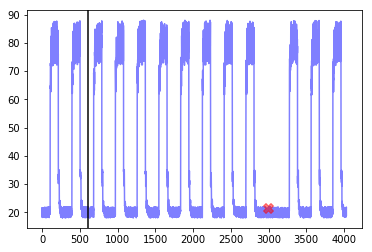




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


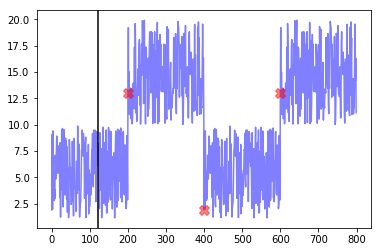




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


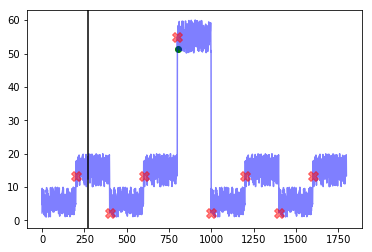




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


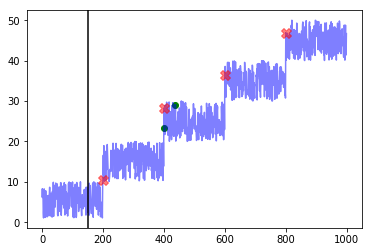

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.0
Best window threshold:  0.6987
Corresponding window overall precision:  0.8181818181818182
Corresponding window overall recall:  0.3333333333333333
Corresponding window overall F score:  0.4736842105263157



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [875, 3754]


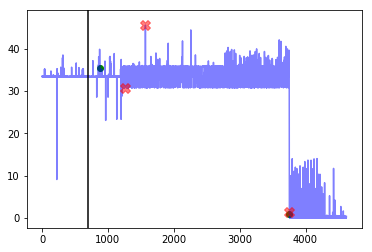




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2427, 3081]


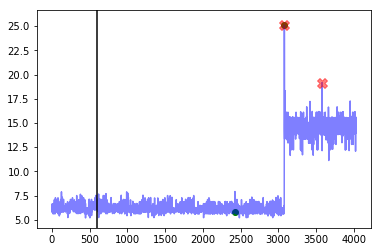




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [947, 2586]


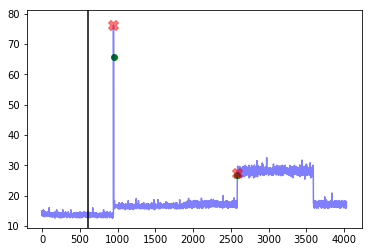




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2881]


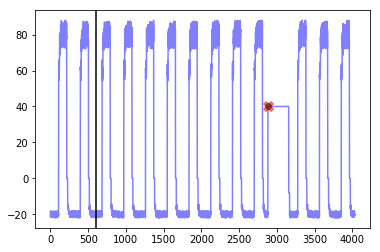




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


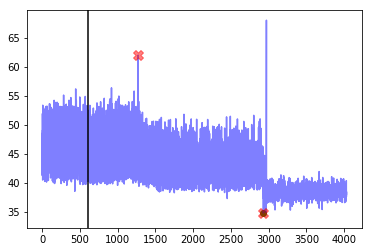




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


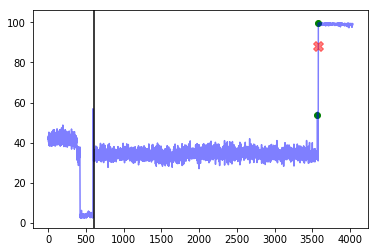




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


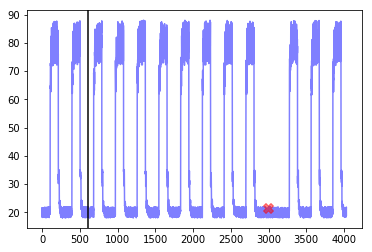




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


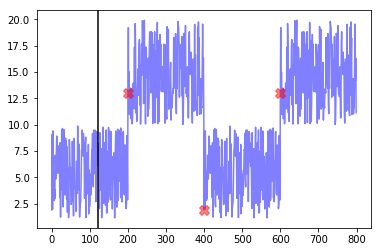




--- artificial_cd_2 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.125
Corresponding window false positives:  0
Corresponding window false negatives:  7


Outlier indices as determined by best window threshold:  [801]


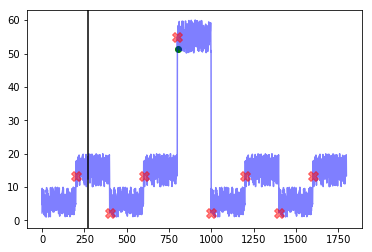




--- artificial_cd_3 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [401, 438]


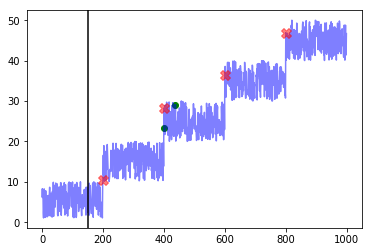

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 12.6
	 Best window threshold : 0.0562
	 Corresponding window overall precision : 0.1864406779661017
	 Corresponding window overall recall : 0.8148148148148148
	 Corresponding window overall F score : 0.30344827586206896
False Positive Weight:  0.2
	 Minimum number of mistakes : 14.8
	 Best window threshold : 0.3634
	 Corresponding window overall precision : 0.47058823529411764
	 Corresponding window overall recall : 0.5925925925925926
	 Corresponding window overall F score : 0.5245901639344261
False Positive Weight:  0.3
	 Minimum number of mistakes : 16.7
	 Best window threshold : 0.3634
	 Corresponding window overall precision : 0.47058823529411764
	 Corresponding window overall recall : 0.5925925925925926
	 Corresponding window overall F score : 0.5245901639344261
False Positive Weight:  0.4
	 Minimum number of mistakes : 18.6
	 Best window threshold : 0.3634
	 Corresponding window overall precision : 0.47058823

In [23]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# windowed gaussian results

In [24]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/windowed_gaussian/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [25]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.2: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.3: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.4: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.5: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.6: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.7: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.8: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.9: {'precision': 0.11764705882352941, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.5
Best window threshold:  0.983
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.6666666666666666
Corresponding window overall F score:  0.26666666666666666



--- grok_asg_anomaly ---
Corresponding window precision:  0.15
Corresponding window recall:  1.0
Corresponding window false positives:  17
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [772, 830, 855, 856, 860, 873, 874, 954, 955, 966, 1002, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1038, 1039, 1040, 1041, 1042, 1043, 1045, 1046, 1089, 1090, 1091, 1094, 1095, 1096, 1134, 1200, 1201, 1212, 1237, 1244, 1250, 1254, 1283, 1287, 1299, 1307, 1311, 1315, 1348, 1357, 1361, 1365, 1369, 1381, 1382, 1391, 1394, 1398, 1402, 1406, 1410, 1418, 1422, 1426, 1430, 1434, 1442, 1458, 1466, 1475, 1477, 1483, 1491, 1498, 1505, 1512, 1513,

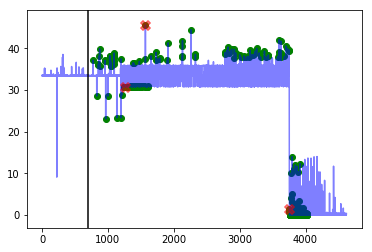




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.13333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  13
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [612, 620, 621, 633, 648, 660, 683, 691, 708, 718, 729, 785, 920, 948, 962, 972, 980, 992, 1006, 1014, 1043, 1196, 1208, 1235, 1269, 1279, 1283, 1309, 1353, 1361, 1362, 1404, 1460, 1472, 1498, 1534, 1543, 1554, 1561, 1569, 1580, 1591, 1649, 1722, 1746, 1759, 1773, 1798, 1808, 1818, 1832, 1845, 1854, 1862, 1863, 1873, 1880, 1937, 2011, 2050, 2064, 2072, 2082, 2088, 2096, 2108, 2121, 2131, 2142, 2158, 2208, 2225, 2296, 2302, 2324, 2358, 2378, 2383, 2423, 2426, 2438, 2445, 2456, 2485, 2513, 2576, 2577, 2595, 2626, 2635, 2644, 2650, 2663, 2678, 2695, 2710, 2723, 2742, 2743, 2801, 2851, 2894, 2900, 2911, 2924, 2926, 2927, 2940, 2947, 2971, 2983, 2990, 2996, 3008, 3009, 3021, 3032, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 

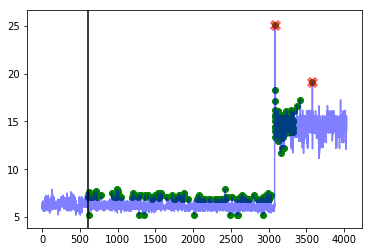




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 860, 946, 947, 948, 2033, 2039, 2045, 2051, 2061, 2069, 2085, 2088, 2105, 2107, 2111, 2117, 2135, 2143, 2147, 2149, 2157, 2159, 2162, 2171, 2175, 2185, 2199, 2201, 2207, 2213, 2219, 2221, 2225, 2231, 2241, 2257, 2267, 2269, 2271, 2273, 2279, 2293, 2295, 2303, 2305, 2317, 2318, 2327, 2399, 2437, 2447, 2453, 2521, 2543, 2561, 2573, 2583, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623, 2624, 2625, 2626, 2627, 2628, 2629, 2630, 2631, 2632, 2633, 2634, 2635, 2636, 2637, 2638, 2639, 2640, 2641, 2642, 2643, 2644, 2645, 2646, 2647, 2648, 26

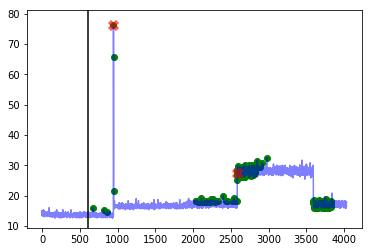




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


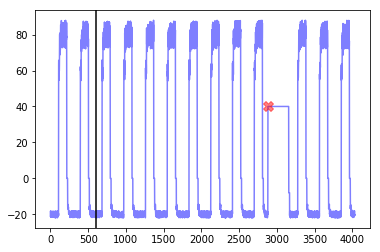




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [822, 902, 918, 1008, 1016, 1218, 1270, 1271, 2345, 2442, 2451, 2492, 2564, 2586, 2670, 2775, 2802, 2866, 2876, 2886, 2930, 2933, 2935, 2938, 2943, 2948, 2951, 2956, 2959, 2964, 2967, 2968, 2970, 2973, 2975, 2978, 2980, 2981, 2990, 2992, 2998, 3021, 3076, 3084]


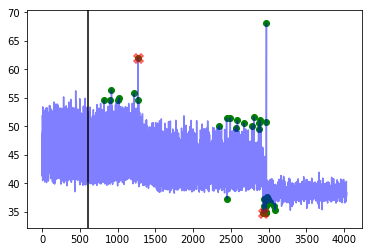




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1643, 1676, 1681, 1707, 1716, 1717, 1737, 1774, 1775, 1785, 1791, 1799, 1812, 1829, 1862, 1870, 1882, 1954, 1964, 1973, 1976, 1979, 1980, 1988, 1990, 1998, 1999, 2018, 2052, 2057, 2060, 2093, 2120, 2140, 2146, 2158, 2185, 2197, 2216, 2217, 2230, 2252, 2264, 2272, 2337, 2338, 2345, 2357, 2361, 2374, 2388, 2406, 2420, 2434, 2435, 2442, 2540, 2541, 2552, 2612, 2670, 2671, 2689, 2725, 2726, 2767, 2829, 2854, 2877, 2885, 2913, 2944, 2960, 3032, 3039, 3094, 3096, 3121, 3139, 3257, 3258, 3302, 3339, 3396, 3425, 3450, 3464, 3465, 3501, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3

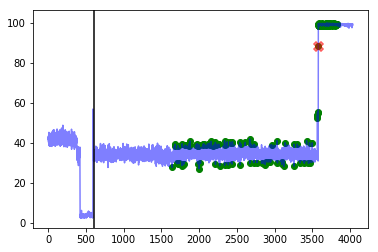




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3592, 3597, 3598, 3607, 3617, 3869, 3872, 3880, 3889, 3892, 3893, 3898, 3906, 3909, 3915]


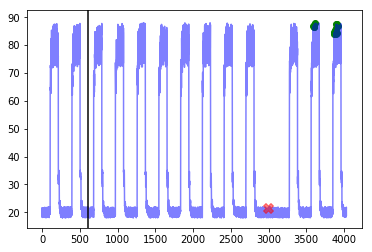




--- artificial_cd_1 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [200, 201, 203, 205, 207, 209, 213, 214, 217, 219, 220, 226, 229, 230, 232, 235, 236, 238, 239, 240, 242, 243, 245, 247, 248, 256, 257, 258, 259, 261, 263, 264, 270, 277, 303, 601, 619, 638, 643]


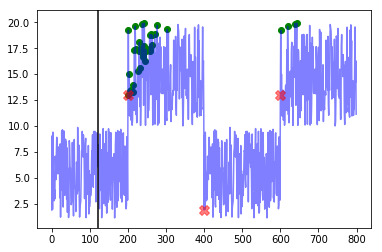




--- artificial_cd_2 ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.25
Corresponding window false positives:  10
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [274, 277, 287, 295, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854, 855, 856, 857, 858, 859, 860, 861, 862, 863, 864, 865, 866, 867, 868, 869, 870, 871, 872, 873, 874, 875, 876, 877, 878, 879, 880, 881, 882, 883, 884, 885, 886, 887, 888, 889, 890, 891, 892, 893, 894, 895, 896, 897, 898, 899, 900, 901, 902, 903, 904, 905, 906, 907, 908, 909, 910, 911, 912, 913, 914, 915, 916, 917, 918, 919, 920, 921, 922, 923, 924, 925, 927, 928, 929, 930, 931, 932, 933, 934, 935, 936, 937, 938, 939, 940, 941, 943, 944, 945, 94

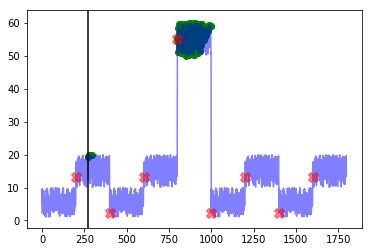




--- artificial_cd_3 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 203, 204, 207, 208, 210, 211, 213, 214, 215, 216, 226, 227, 231, 233, 234, 237, 243, 248, 251, 253, 260, 264, 272, 276, 283, 286, 292, 400, 401, 402, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 415, 416, 417, 420, 421, 424, 426, 429, 430, 435, 438, 446, 451, 453, 457, 458, 459, 462, 465, 467, 471, 474, 600, 601, 602, 604, 605, 606, 607, 608, 609, 610, 611, 612, 613, 614, 616, 618, 621, 623, 626, 627, 628, 631, 632, 635, 640, 647, 651, 652, 665, 800, 802, 803, 805, 806, 807, 810, 811, 814, 817, 818, 819, 820, 821, 827, 829, 834, 836, 855, 856, 867, 878]


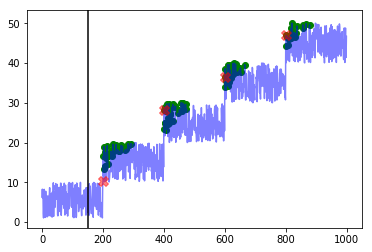

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.4
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820

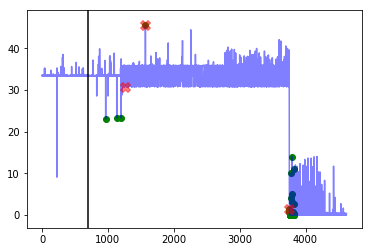




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


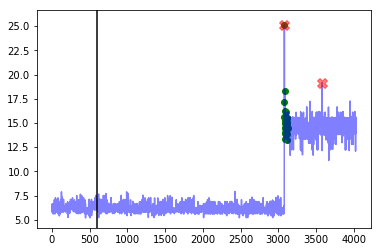




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


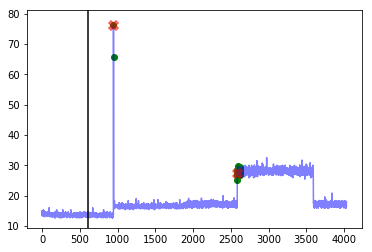




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


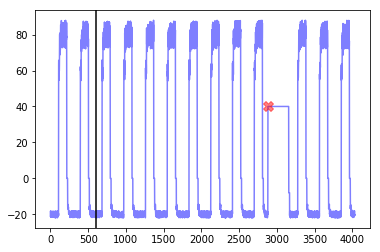




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


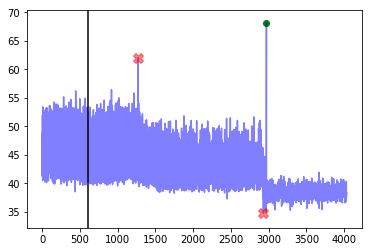




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623]


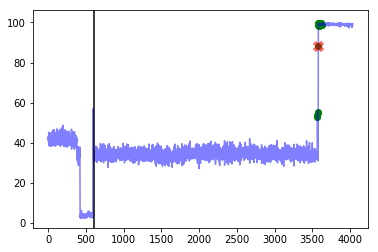




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


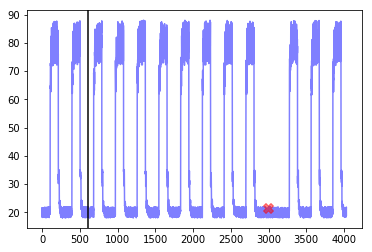




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


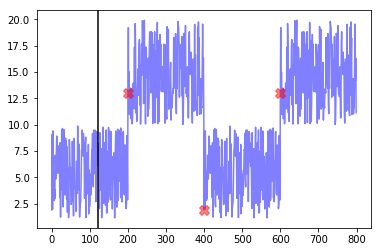




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


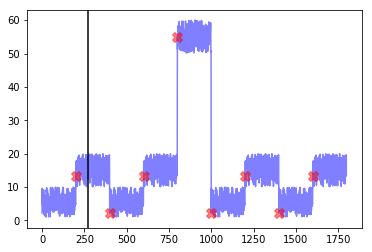




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


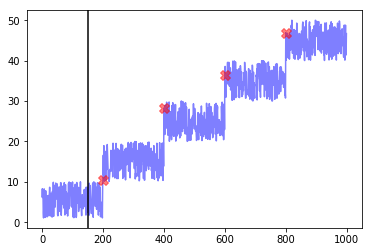

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.6
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820

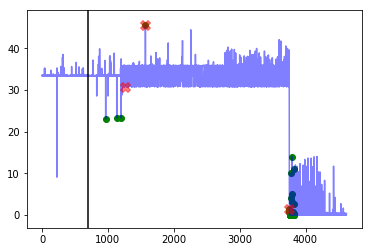




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


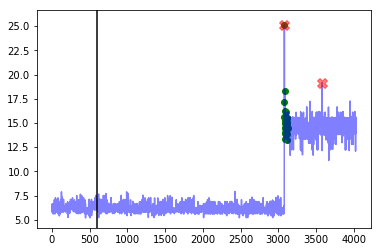




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


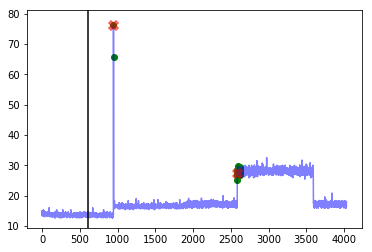




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


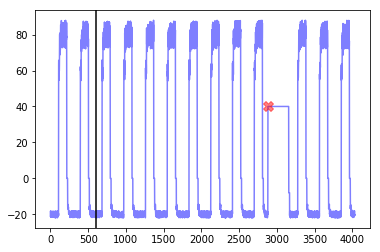




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


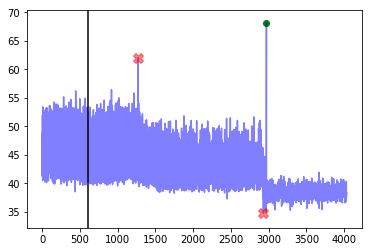




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623]


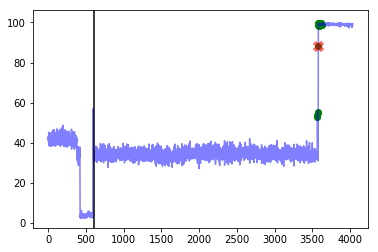




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


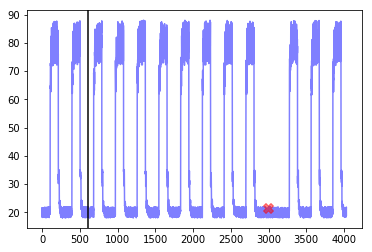




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


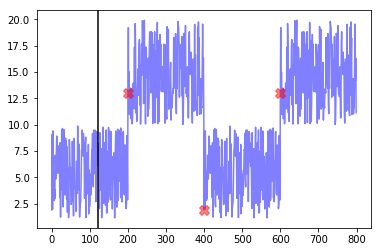




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


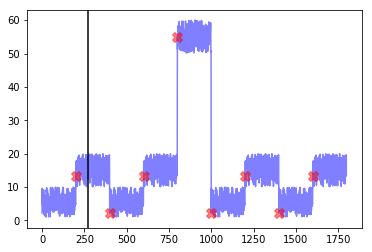




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


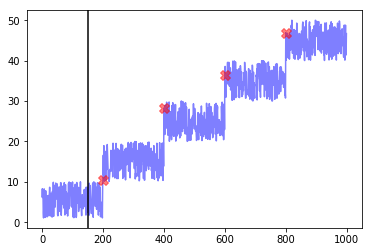

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.8
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820

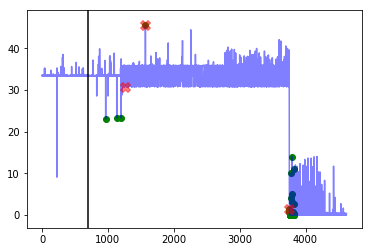




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


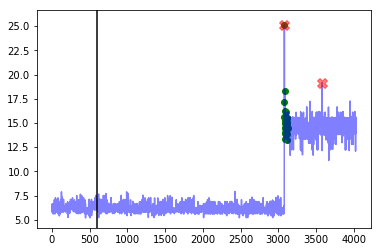




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


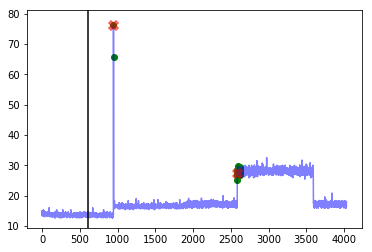




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


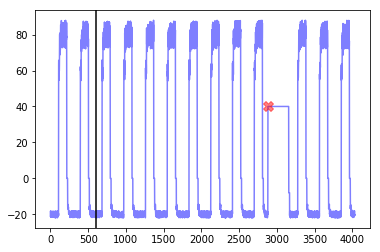




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


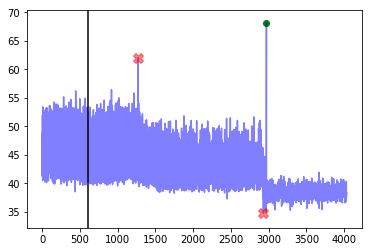




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623]


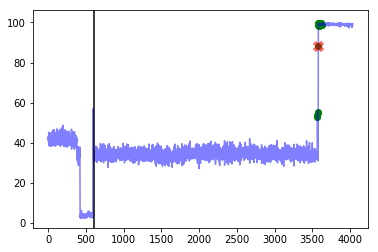




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


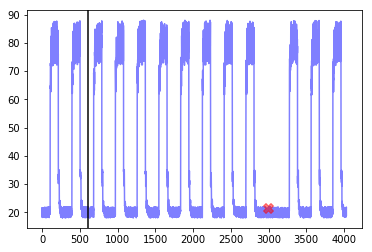




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


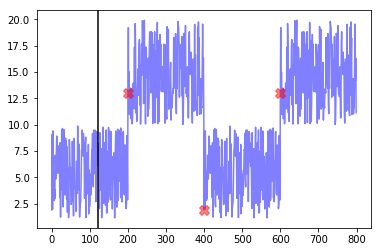




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


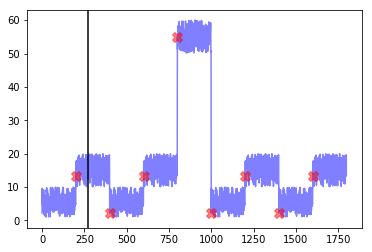




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


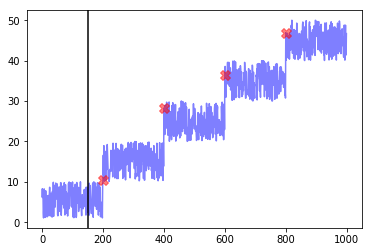

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.0
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820

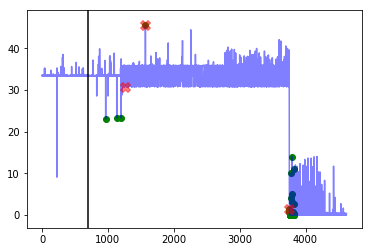




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


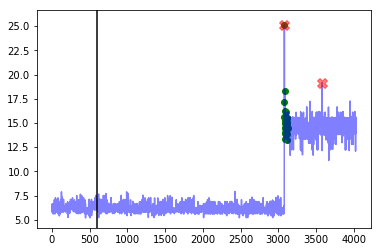




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


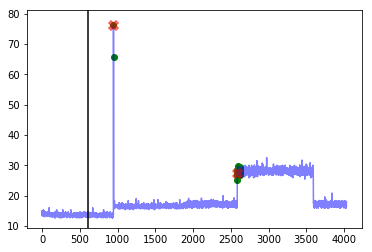




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


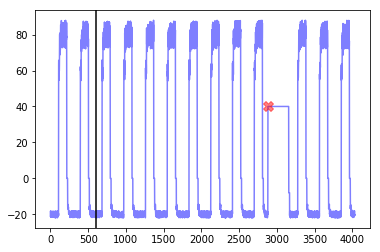




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


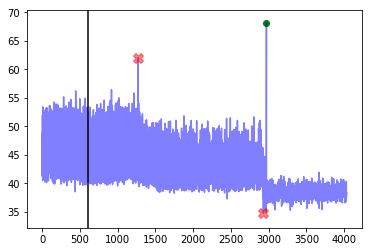




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623]


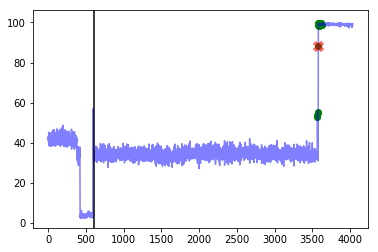




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


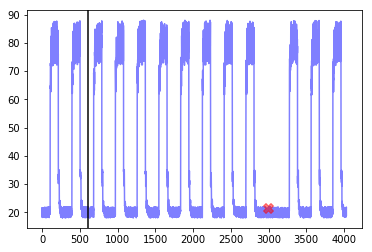




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


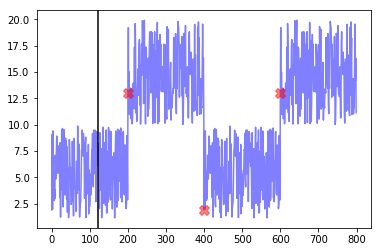




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


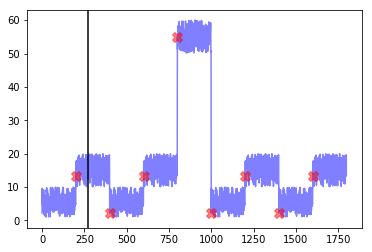




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


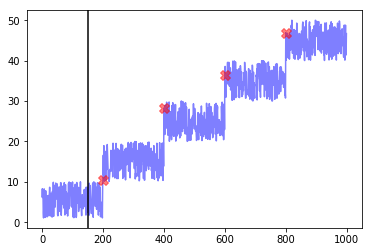

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.2
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820

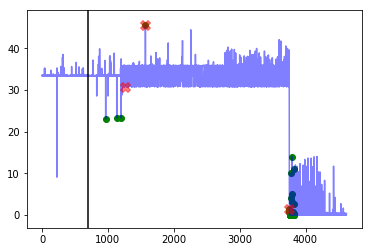




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


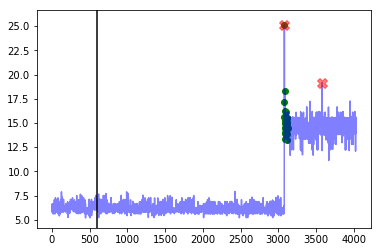




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


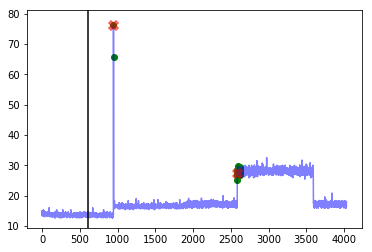




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


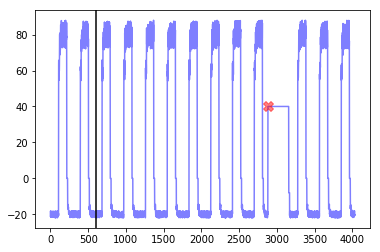




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


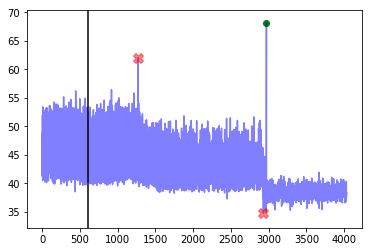




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623]


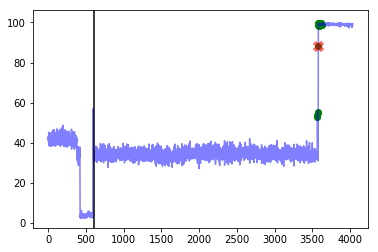




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


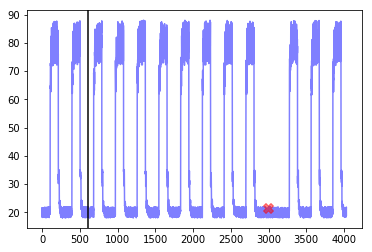




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


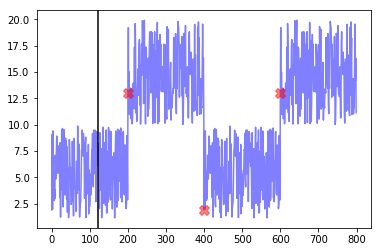




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


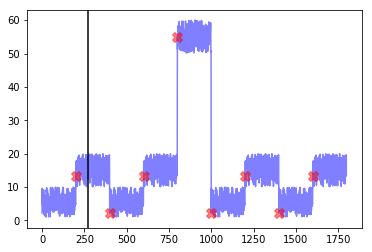




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


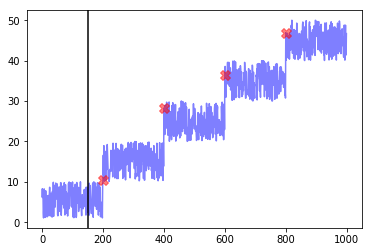

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.4
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820

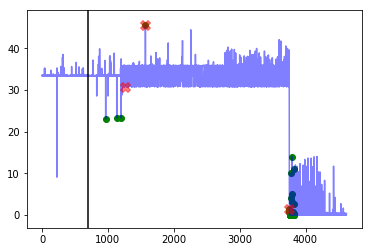




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


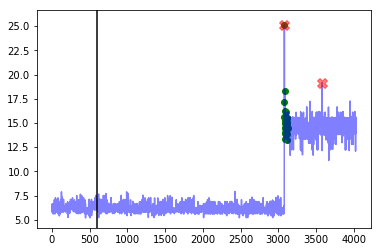




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


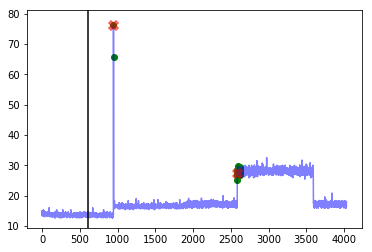




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


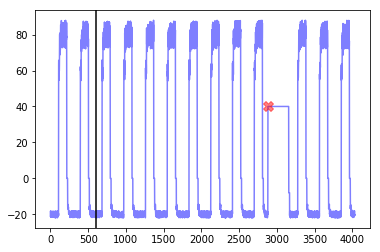




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


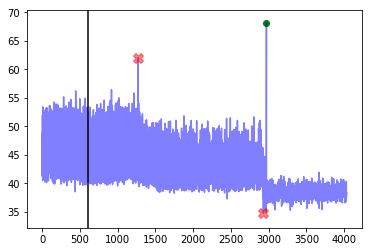




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623]


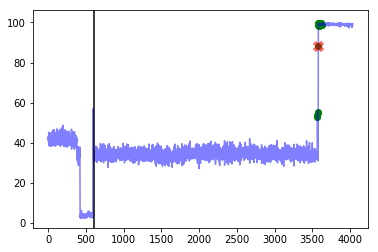




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


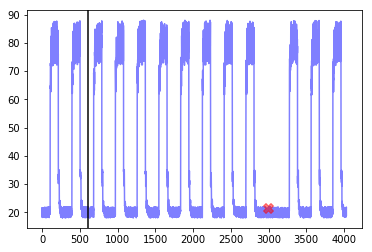




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


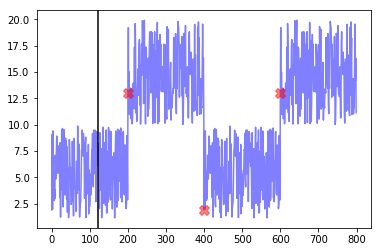




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


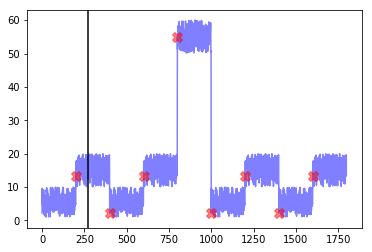




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


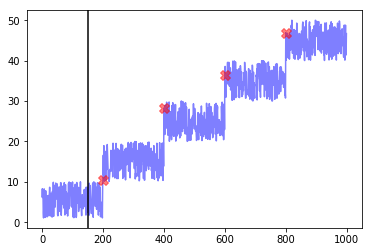

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.6
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820

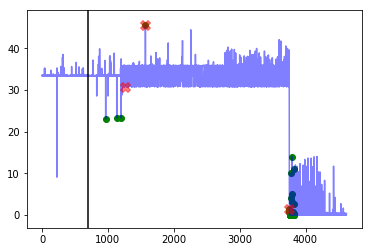




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


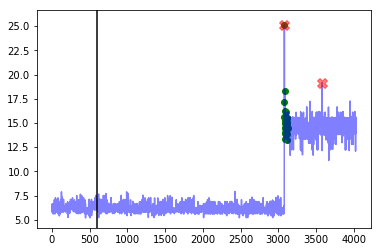




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


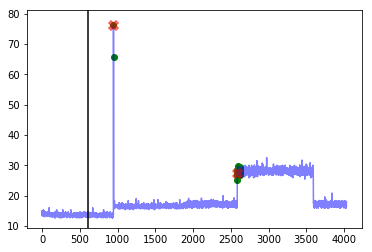




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


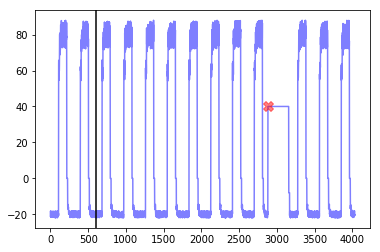




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


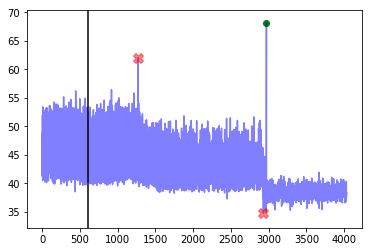




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623]


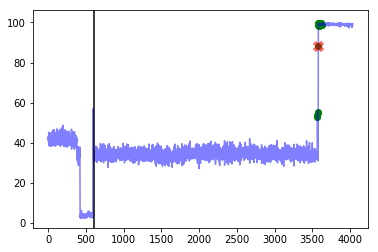




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


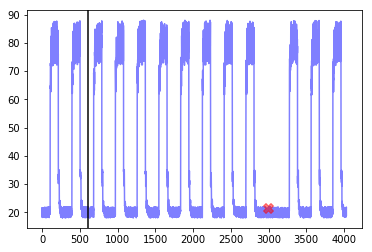




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


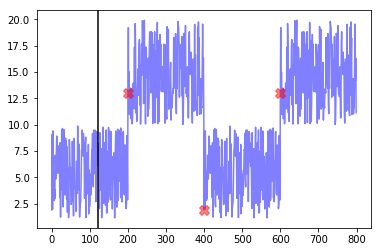




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


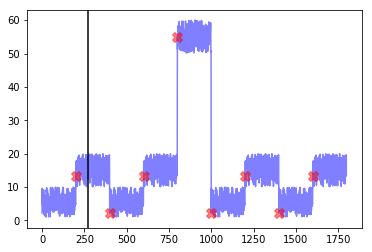




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


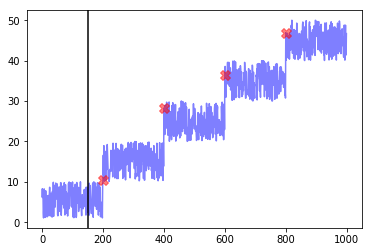

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.8
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820

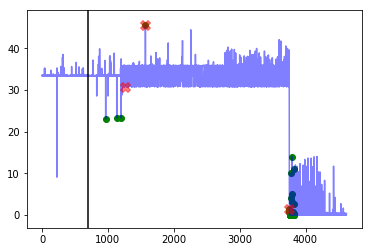




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


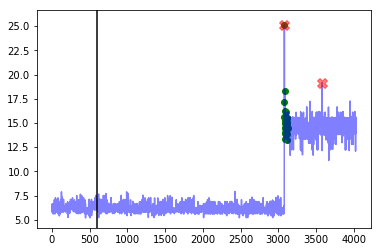




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


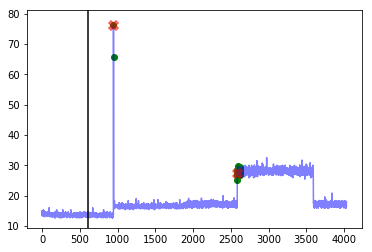




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


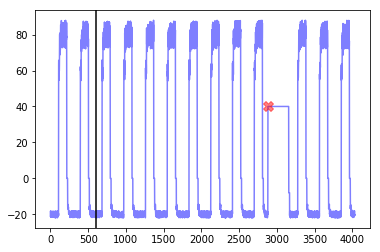




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


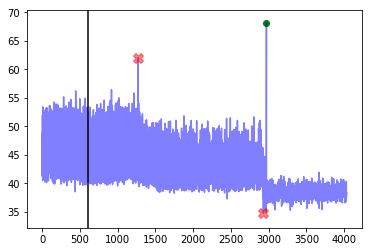




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623]


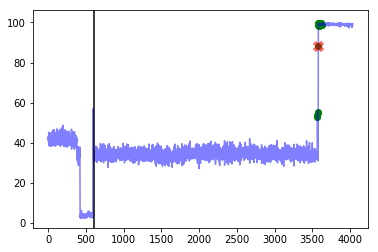




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


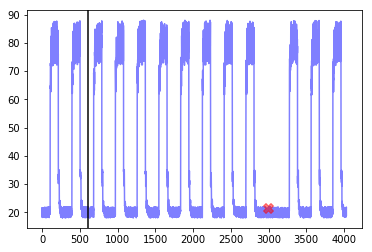




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


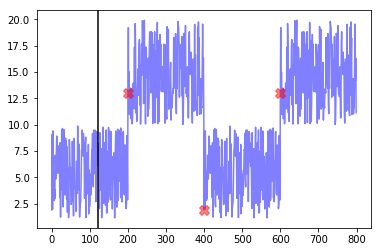




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


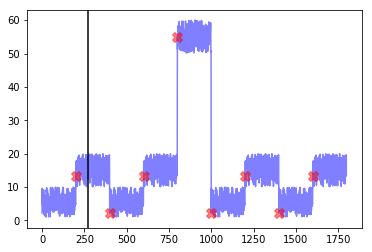




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


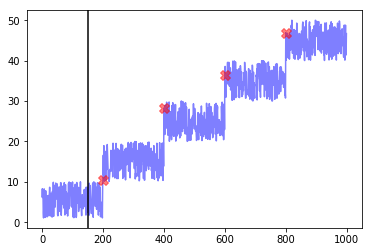

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.0
Best window threshold:  1.0
Corresponding window overall precision:  0.7777777777777778
Corresponding window overall recall:  0.25925925925925924
Corresponding window overall F score:  0.3888888888888889



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1200, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3796, 3797, 3798, 3799, 3800, 3801, 3802, 3803, 3804, 3805, 3806, 3807, 3808, 3809, 3810, 3811, 3812, 3813, 3814, 3815, 3816, 3817, 3818, 3819, 3820

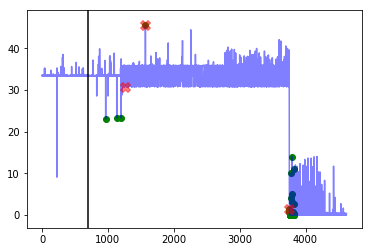




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123]


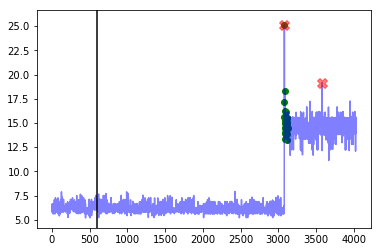




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2623]


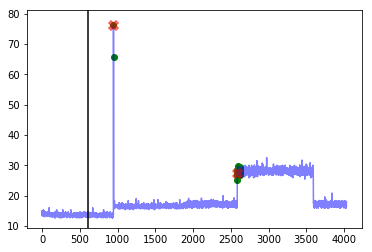




--- art_daily_flatmiddle ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


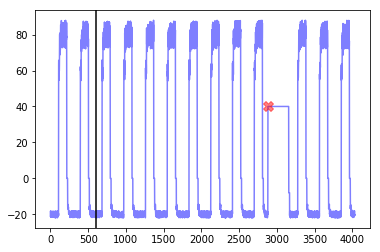




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


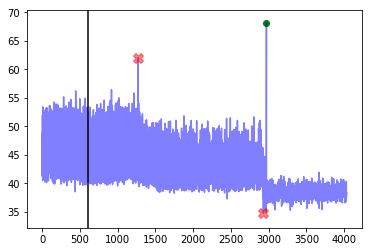




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623]


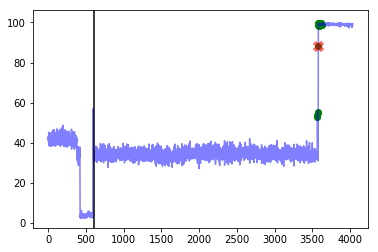




--- art_daily_nojump ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


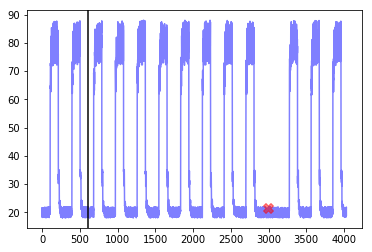




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


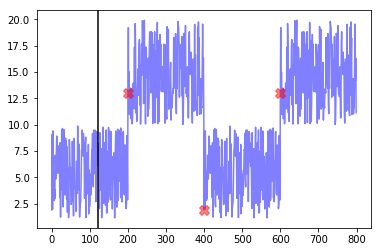




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  []


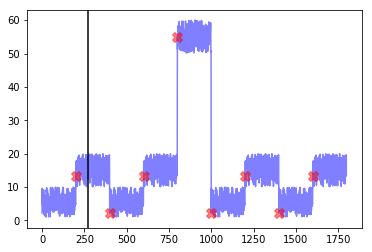




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  []


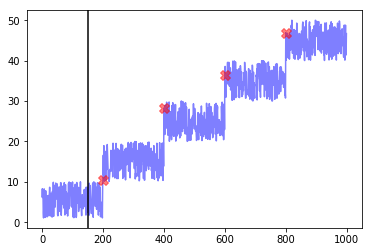

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 16.5
	 Best window threshold : 0.983
	 Corresponding window overall precision : 0.16666666666666666
	 Corresponding window overall recall : 0.6666666666666666
	 Corresponding window overall F score : 0.26666666666666666
False Positive Weight:  0.2
	 Minimum number of mistakes : 20.4
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.7777777777777778
	 Corresponding window overall recall : 0.25925925925925924
	 Corresponding window overall F score : 0.3888888888888889
False Positive Weight:  0.3
	 Minimum number of mistakes : 20.6
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.7777777777777778
	 Corresponding window overall recall : 0.25925925925925924
	 Corresponding window overall F score : 0.3888888888888889
False Positive Weight:  0.4
	 Minimum number of mistakes : 20.8
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.7777777777777778


In [26]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# HOTSAX results

In [27]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/hotsax/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [28]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.0, 'recall': 0.0},
 0.2: {'precision': 0.0, 'recall': 0.0},
 0.3: {'precision': 0.0, 'recall': 0.0},
 0.4: {'precision': 0.0, 'recall': 0.0},
 0.5: {'precision': 0.0, 'recall': 0.0},
 0.6: {'precision': 0.0, 'recall': 0.0},
 0.7: {'precision': 0.0, 'recall': 0.0},
 0.8: {'precision': 0.0, 'recall': 0.0},
 0.9: {'precision': 0.0, 'recall': 0.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.200000000000003
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


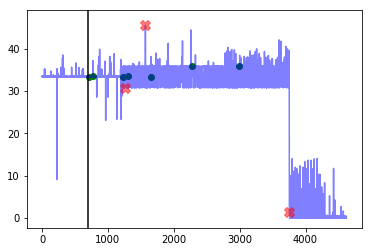




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


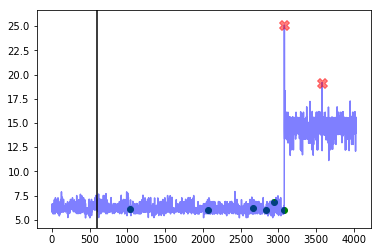




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


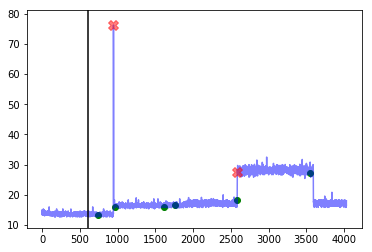




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


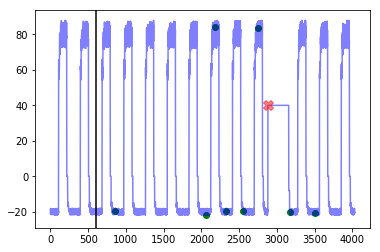




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


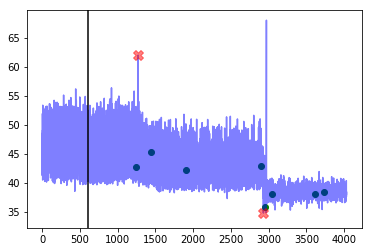




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


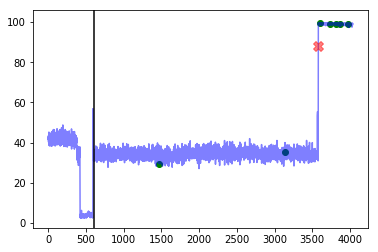




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


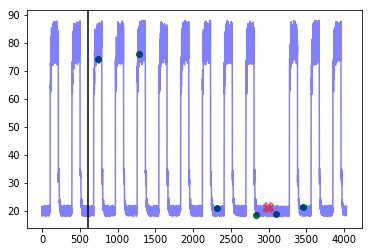




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


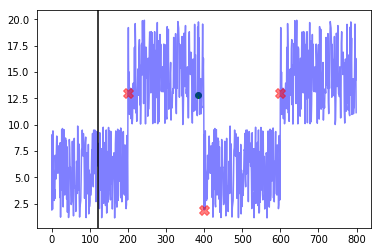




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


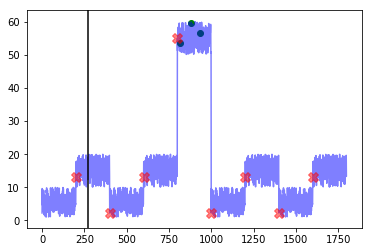




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


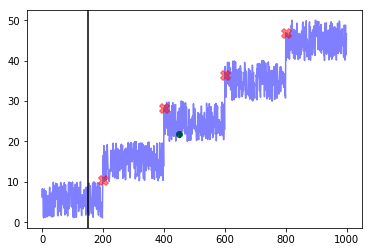

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.400000000000002
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


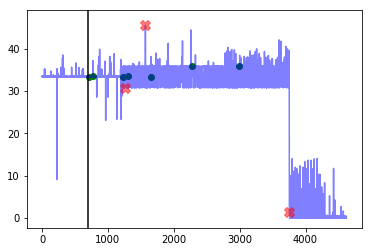




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


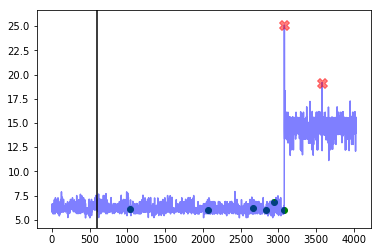




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


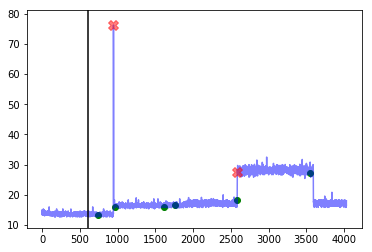




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


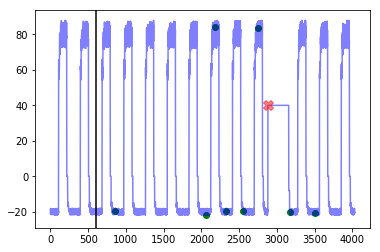




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


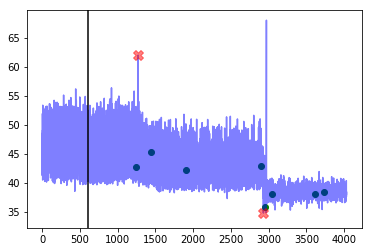




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


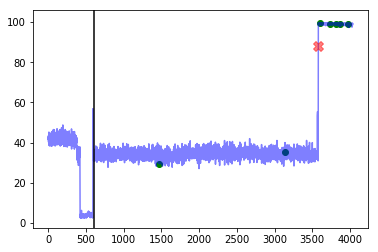




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


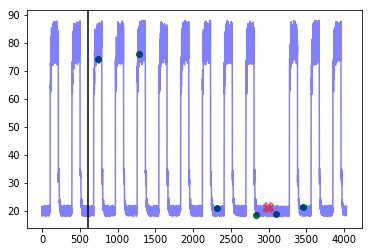




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


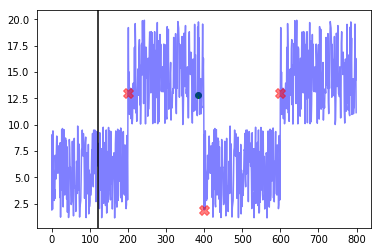




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


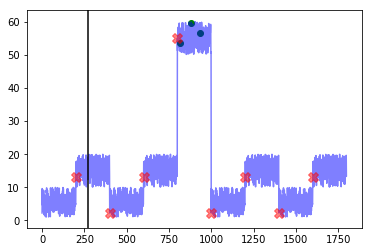




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


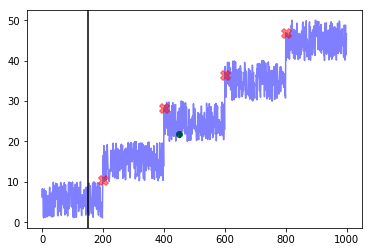

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.6
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


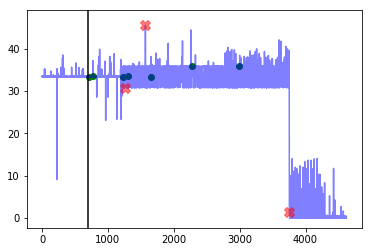




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


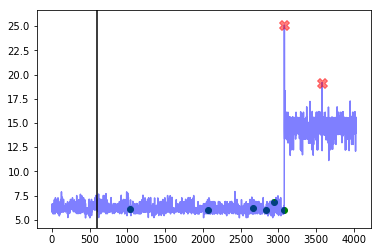




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


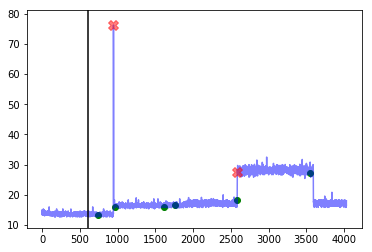




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


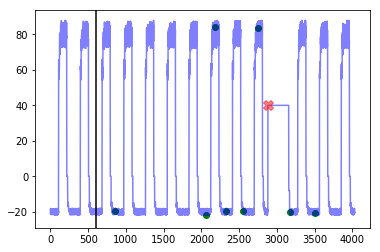




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


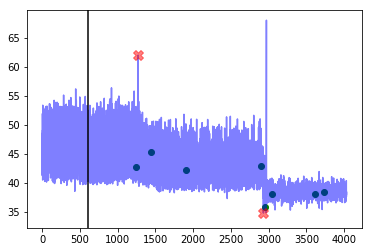




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


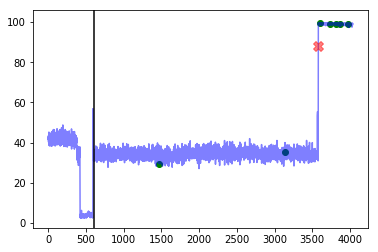




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


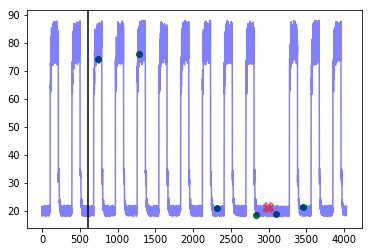




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


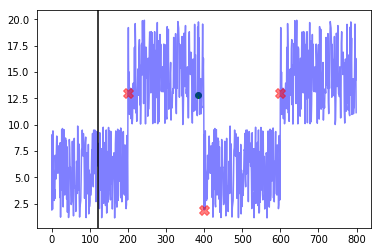




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


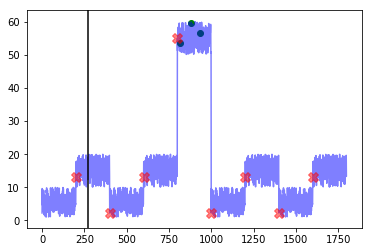




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


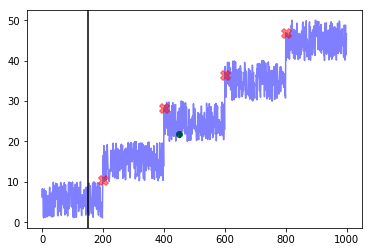

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  28.799999999999997
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


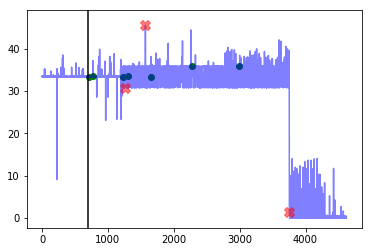




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


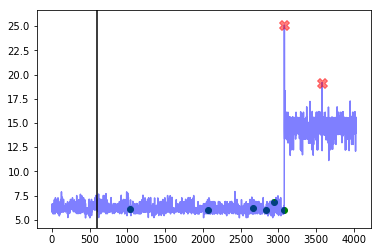




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


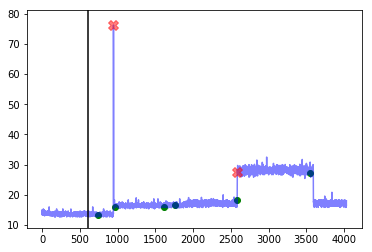




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


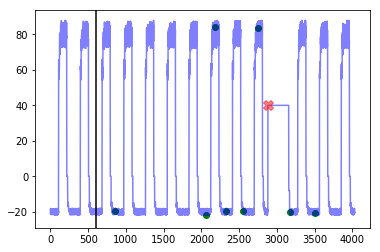




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


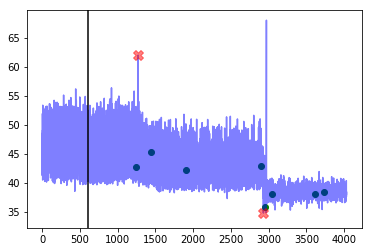




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


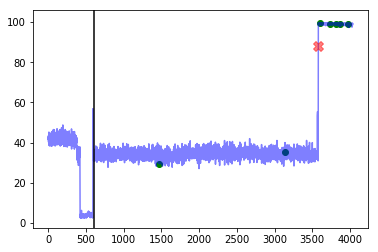




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


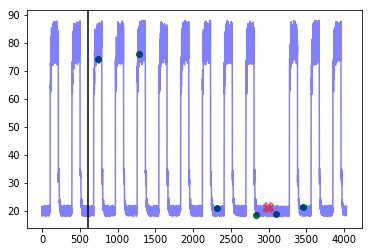




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


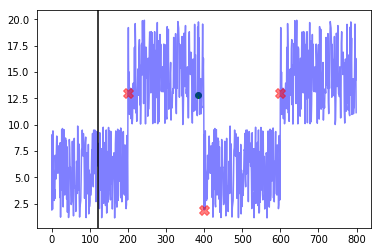




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


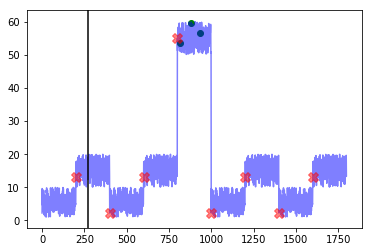




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


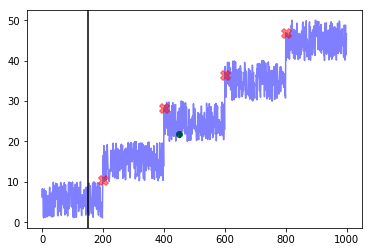

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  32.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


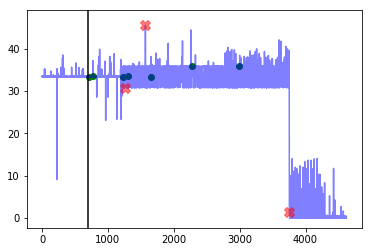




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


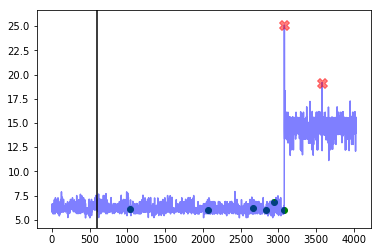




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


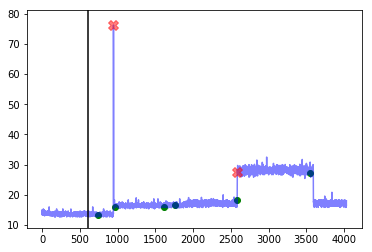




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


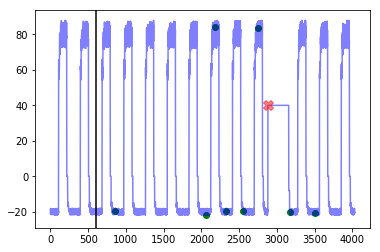




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


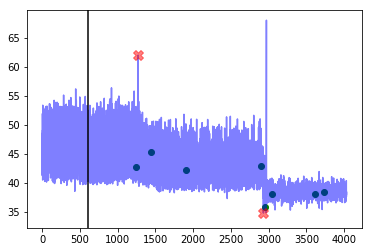




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


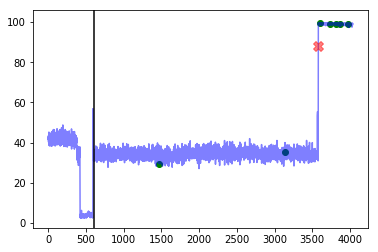




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


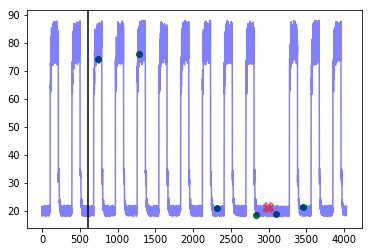




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


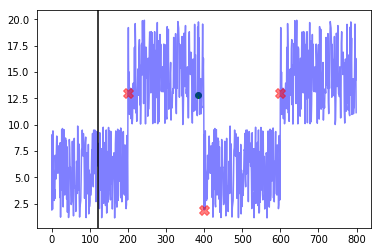




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


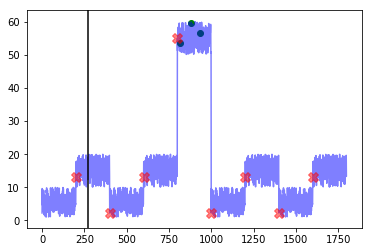




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


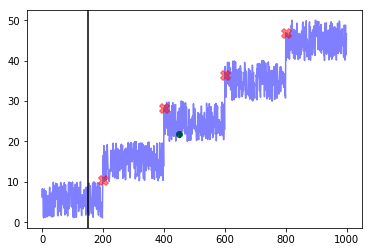

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  35.199999999999996
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


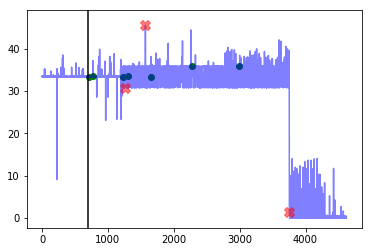




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


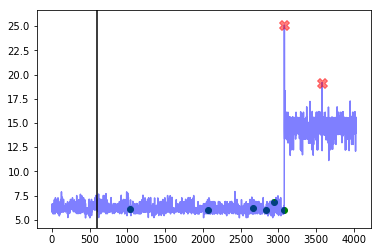




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


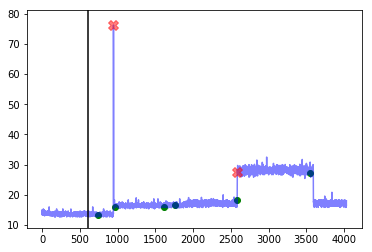




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


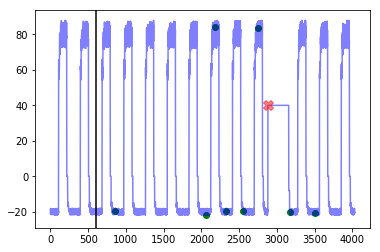




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


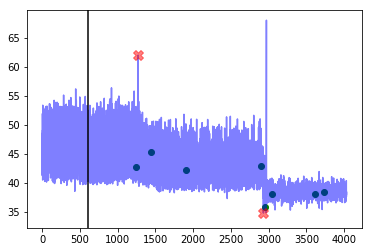




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


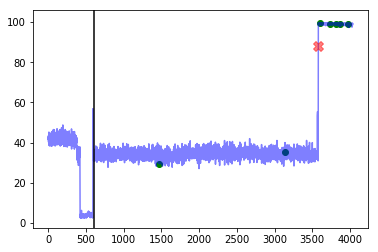




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


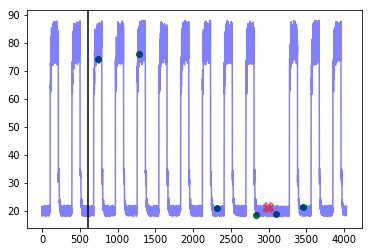




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


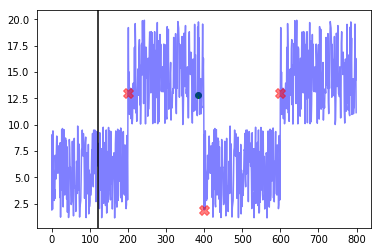




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


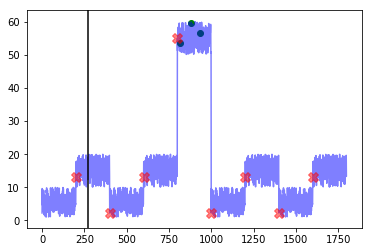




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


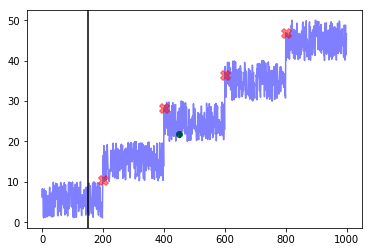

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  38.4
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


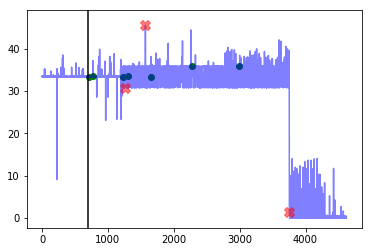




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


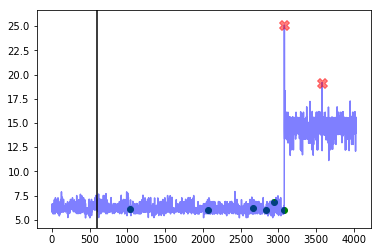




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


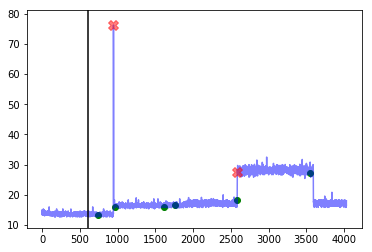




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


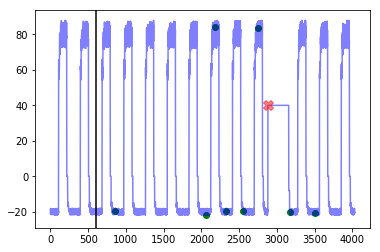




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


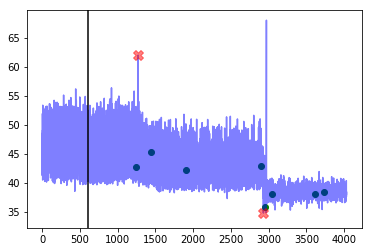




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


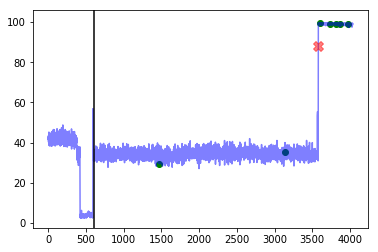




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


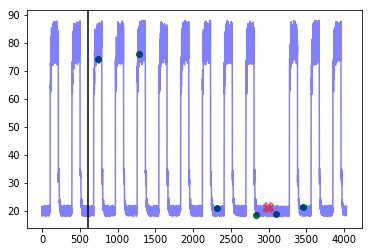




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


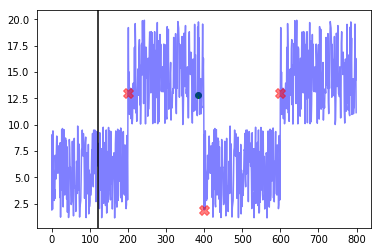




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


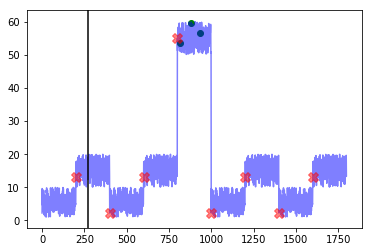




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


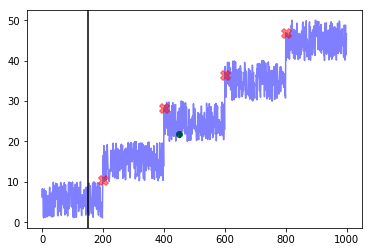

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  41.6
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


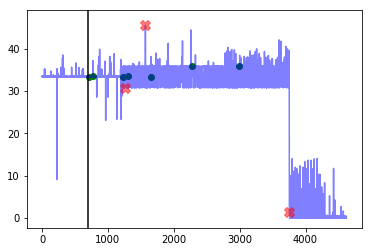




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


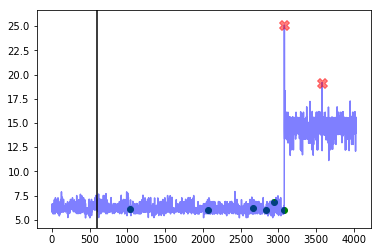




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


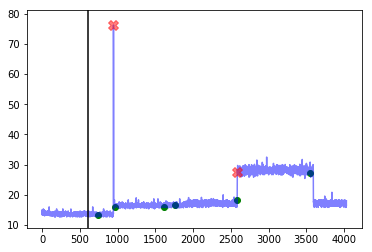




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


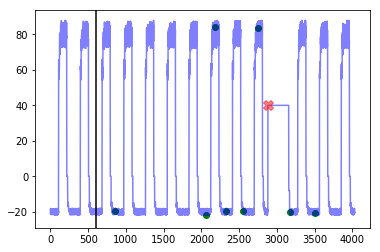




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


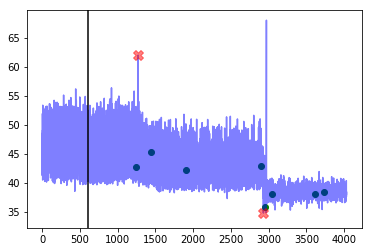




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


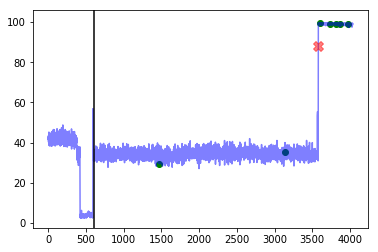




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


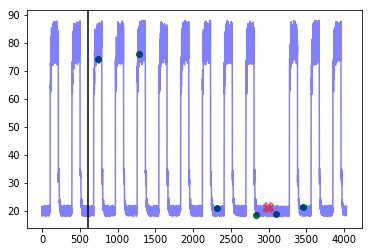




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


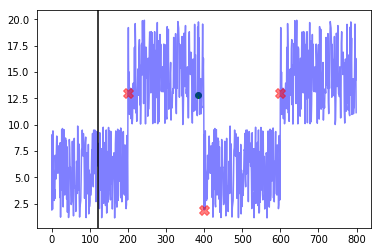




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


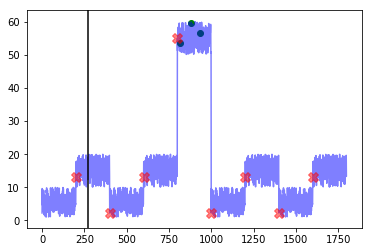




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


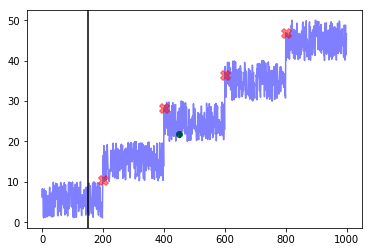

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  44.800000000000004
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


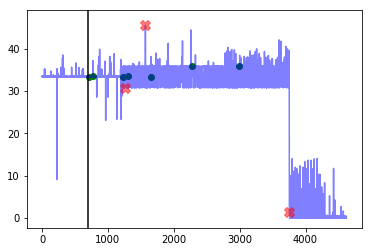




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


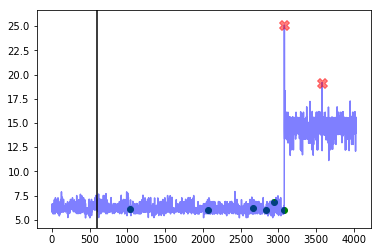




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


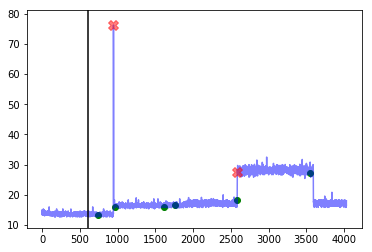




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


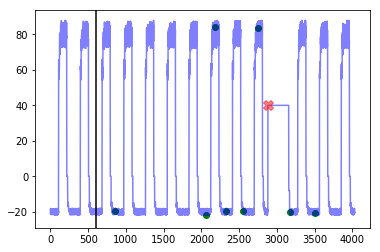




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


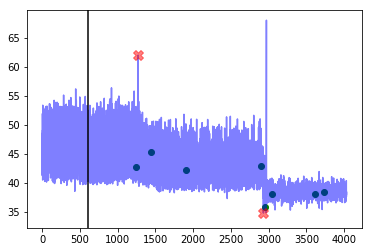




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


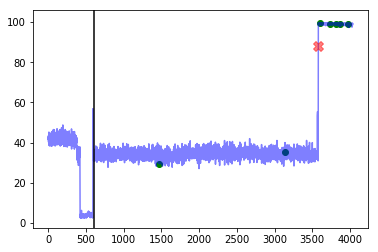




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


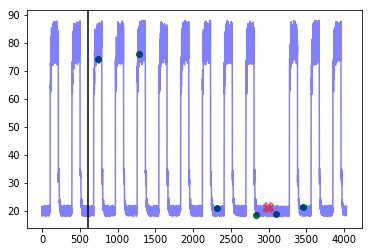




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


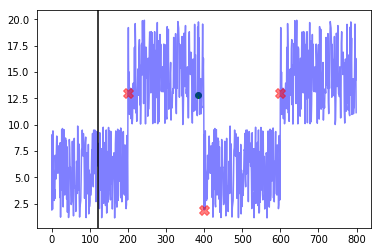




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


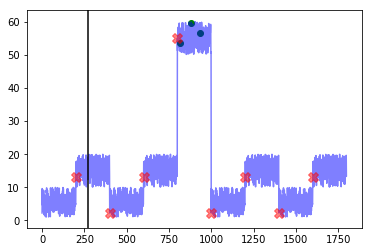




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


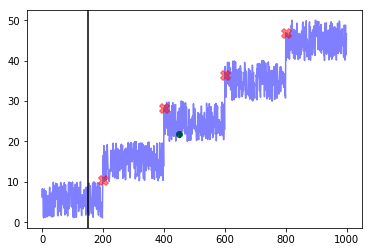

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  48.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.2962962962962963
Corresponding window overall F score:  0.21333333333333335



--- grok_asg_anomaly ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  5
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [715, 777, 1225, 1312, 1658, 2276, 2990]


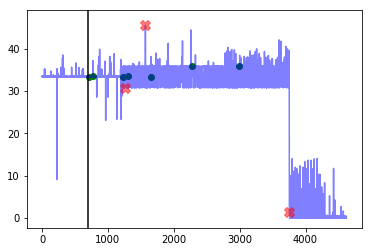




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1036, 2073, 2660, 2840, 2947, 3072]


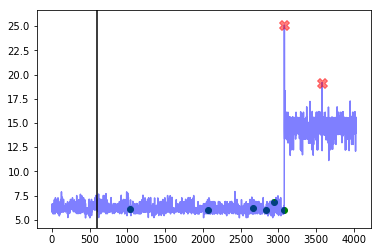




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 966, 1620, 1766, 2583, 3547]


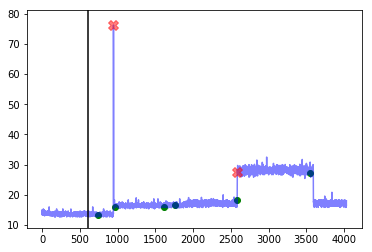




--- art_daily_flatmiddle ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [858, 2055, 2174, 2327, 2552, 2751, 3177, 3505]


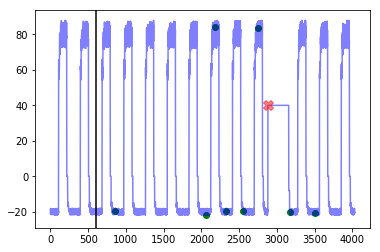




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


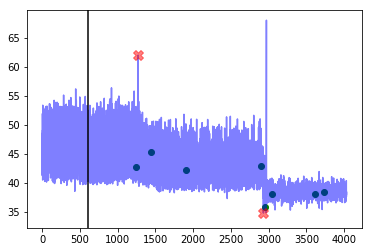




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


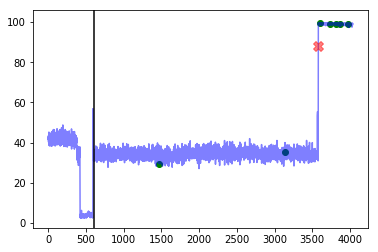




--- art_daily_nojump ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [736, 1279, 2322, 2840, 3094, 3450]


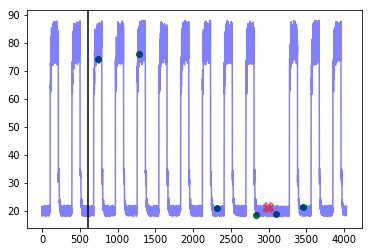




--- artificial_cd_1 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [384]


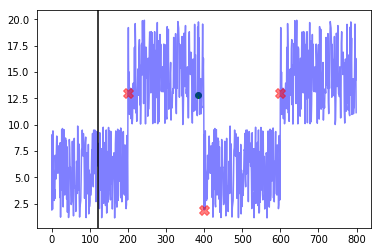




--- artificial_cd_2 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  8


Outlier indices as determined by best window threshold:  [818, 881, 935]


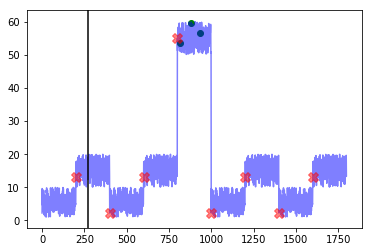




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [449]


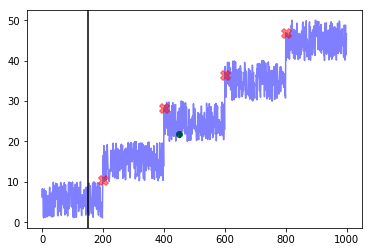

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 19.200000000000003
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.16666666666666666
	 Corresponding window overall recall : 0.2962962962962963
	 Corresponding window overall F score : 0.21333333333333335
False Positive Weight:  0.2
	 Minimum number of mistakes : 22.400000000000002
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.16666666666666666
	 Corresponding window overall recall : 0.2962962962962963
	 Corresponding window overall F score : 0.21333333333333335
False Positive Weight:  0.3
	 Minimum number of mistakes : 25.6
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.16666666666666666
	 Corresponding window overall recall : 0.2962962962962963
	 Corresponding window overall F score : 0.21333333333333335
False Positive Weight:  0.4
	 Minimum number of mistakes : 28.799999999999997
	 Best window threshold : 0.0001
	 Corres

In [29]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# GLM

In [30]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_glm = joblib.load("anomaly_scores" + window_size + "/GLM/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_glm["Anomaly Scores"]

In [31]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.2: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.3: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.4: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.5: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.6: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.7: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.8: {'precision': 0.11764705882352941, 'recall': 1.0},
 0.9: {'precision': 0.11764705882352941, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  12.3
Best window threshold:  0.999
Corresponding window overall precision:  0.27380952380952384
Corresponding window overall recall:  0.8518518518518519
Corresponding window overall F score:  0.4144144144144144



--- grok_asg_anomaly ---
Corresponding window precision:  0.1875
Corresponding window recall:  1.0
Corresponding window false positives:  13
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [772, 830, 860, 874, 954, 955, 966, 1002, 1026, 1027, 1028, 1029, 1030, 1031, 1033, 1089, 1090, 1095, 1096, 1134, 1200, 1201, 1212, 1311, 1569, 1729, 1732, 1915, 2131, 2132, 2258, 2803, 2824, 2878, 2919, 3257, 3600, 3625, 3700, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3788, 3789, 3

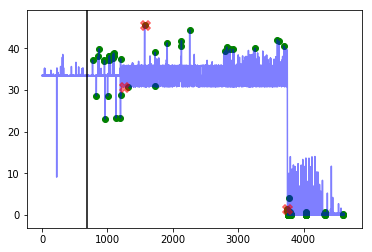




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  0.13333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  13
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [620, 683, 708, 718, 785, 920, 992, 1006, 1014, 1208, 1235, 1309, 1362, 1404, 1498, 1534, 1569, 1580, 1591, 1722, 1808, 1832, 1873, 1880, 2064, 2082, 2088, 2426, 2513, 2626, 2650, 2663, 2678, 2801, 2924, 2971, 2996, 3021, 3032, 3080, 3081, 3082, 3083, 3084, 3085, 3086, 3087, 3088, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3124, 3126, 3127, 3128, 3129, 3132, 3134, 3138, 3139, 3140, 3142, 3150, 3154, 3282, 3283, 3284, 3285, 3286, 3288, 3290, 3294, 3296, 3297, 3570, 3571, 3572, 3580, 3858]


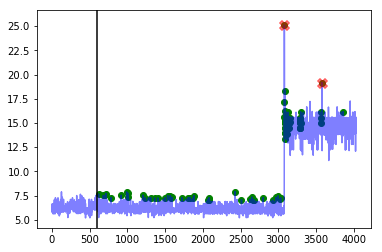




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  1.0
Corresponding window false positives:  9
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [671, 815, 946, 947, 2016, 2017, 2018, 2019, 2021, 2023, 2027, 2029, 2030, 2031, 2033, 2035, 2036, 2039, 2043, 2045, 2051, 2061, 2111, 2305, 2306, 2307, 2309, 2311, 2317, 2318, 2399, 2585, 2586, 2587, 2588, 2589, 2590, 2591, 2592, 2593, 2594, 2595, 2596, 2597, 2598, 2599, 2600, 2601, 2602, 2603, 2604, 2605, 2606, 2607, 2608, 2609, 2610, 2611, 2612, 2613, 2614, 2615, 2616, 2617, 2618, 2619, 2620, 2621, 2622, 2624, 2625, 2628, 2629, 2631, 2632, 2633, 2634, 2635, 2880, 2881, 2882, 2883, 2885, 2893, 2894, 3169, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3612, 3613, 3614, 3616, 3618, 3619, 3620, 3624, 3626, 3627, 3628, 3630, 3634, 3636]


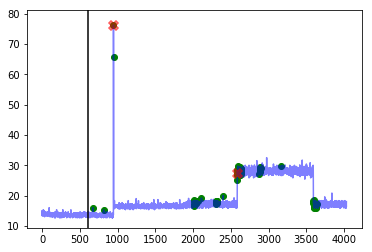




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887, 2888, 2889, 2890, 2891, 2892, 2893, 2894, 2895, 2896, 2897, 2898, 2899, 2900, 2901, 2902, 2903, 2904, 2905, 2906, 2907, 2908, 2909, 2910, 2911, 2912, 2913, 2914, 2915, 2916, 2917, 2918, 2919, 2920, 2921, 2922, 2923, 2928, 2929, 2930, 2931, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3036, 3037, 3038, 3039, 3040, 3041, 3048, 3049, 3050]


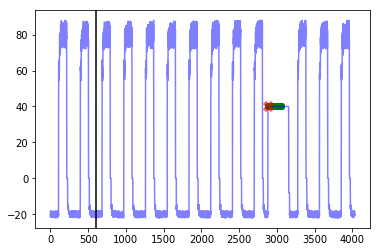




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


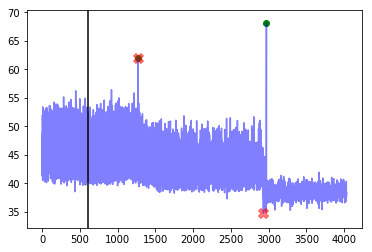




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [607, 608, 609, 610, 611, 619, 620, 632, 2131, 2419, 2420, 2421, 2422, 2423, 2424, 2425, 2426, 2428, 2429, 2430, 2431, 2432, 2433, 2434, 2436, 2437, 2438, 2439, 2440, 2441, 2442, 2443, 2444, 2445, 2447, 2448, 2449, 2453, 2454, 2456, 2457, 2465, 2468, 2469, 2470, 2480, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3631, 3632, 3633, 3634, 3859, 3860, 3861, 3862, 3863, 3864, 3865, 3866, 3867, 3868, 3869, 3870, 3871, 3872]


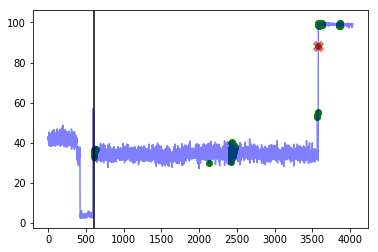




--- art_daily_nojump ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1575, 1583, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997, 2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008, 3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030, 3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041, 3042, 3043, 3044, 3045, 3047, 3048, 3049, 3050, 3051, 3052, 3053, 3054, 3055, 3060, 3061, 3062, 3072]


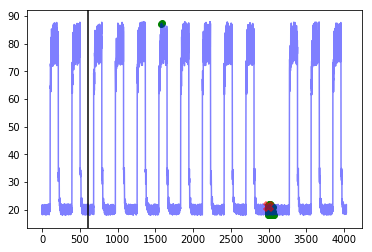




--- artificial_cd_1 ---
Corresponding window precision:  0.4
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [201, 400, 402, 516, 528, 684, 732]


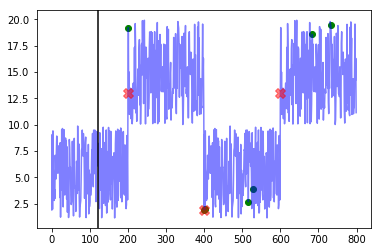




--- artificial_cd_2 ---
Corresponding window precision:  0.15
Corresponding window recall:  0.375
Corresponding window false positives:  17
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [288, 400, 408, 504, 516, 696, 720, 800, 801, 802, 803, 804, 805, 816, 828, 840, 852, 864, 1000, 1001, 1002, 1003, 1004, 1005, 1007, 1008, 1020, 1032, 1044, 1056, 1080, 1092, 1104, 1116, 1128, 1140, 1152, 1284, 1296, 1308, 1320, 1332]


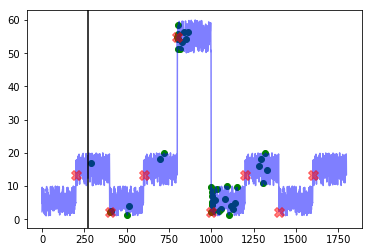




--- artificial_cd_3 ---
Corresponding window precision:  0.5714285714285714
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [201, 203, 264, 400, 408, 576, 600, 800, 864]


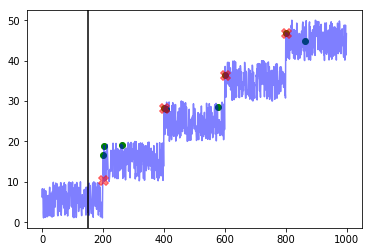

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.2
Best window threshold:  1.0
Corresponding window overall precision:  0.8
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.5714285714285714



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760]


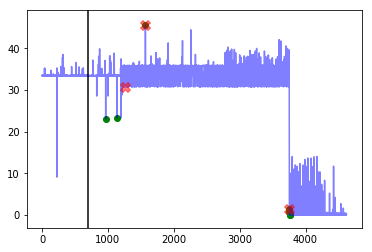




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3086, 3089, 3090]


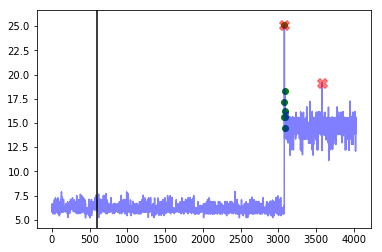




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586, 2587, 2588, 2589, 2591, 2592, 2593, 2594, 2595]


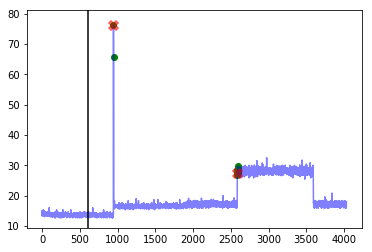




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887]


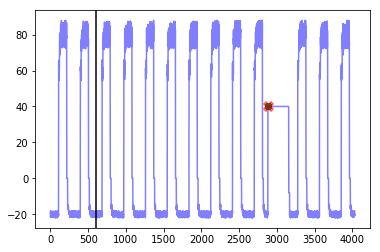




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


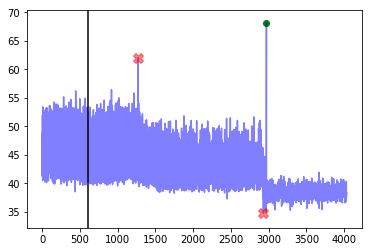




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588]


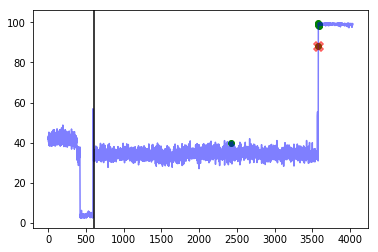




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 3000, 3001, 3002, 3003]


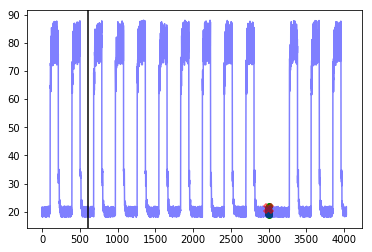




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


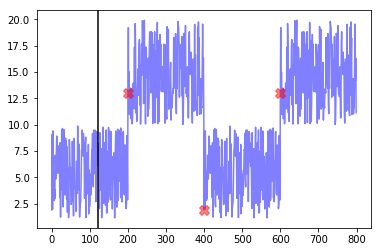




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 804, 864, 1000, 1008]


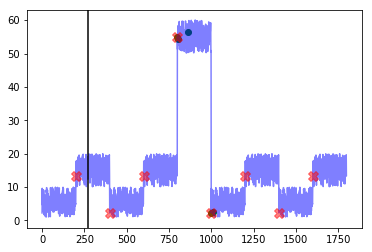




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


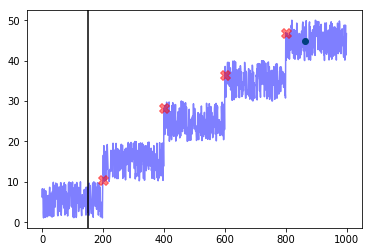

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.8
Best window threshold:  1.0
Corresponding window overall precision:  0.8
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.5714285714285714



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760]


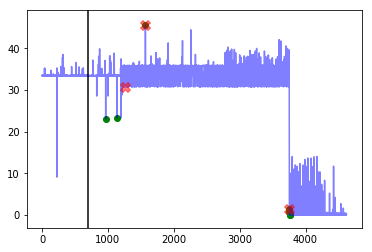




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3086, 3089, 3090]


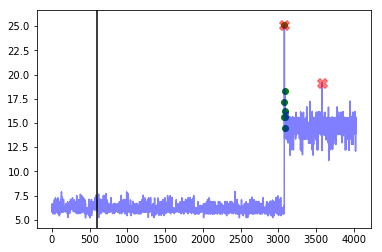




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586, 2587, 2588, 2589, 2591, 2592, 2593, 2594, 2595]


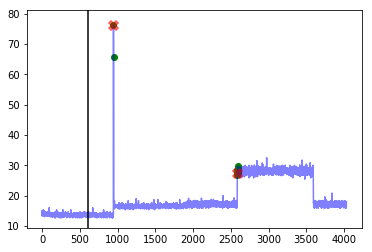




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887]


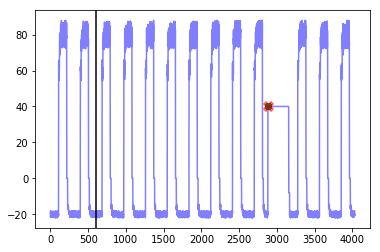




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


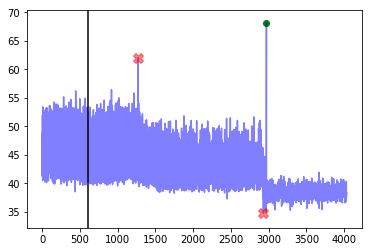




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588]


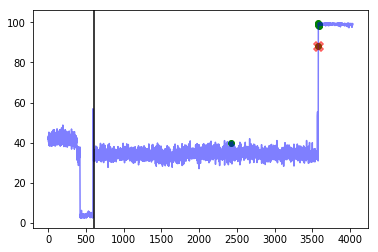




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 3000, 3001, 3002, 3003]


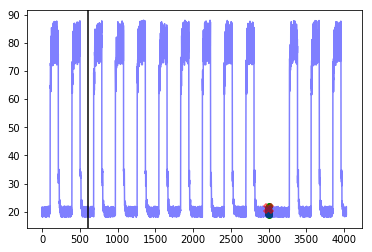




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


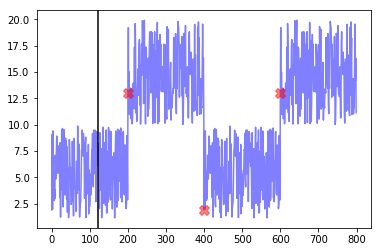




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 804, 864, 1000, 1008]


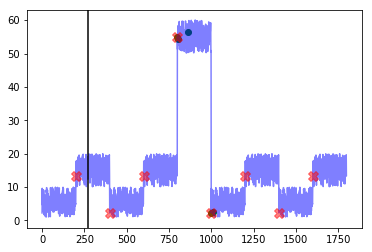




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


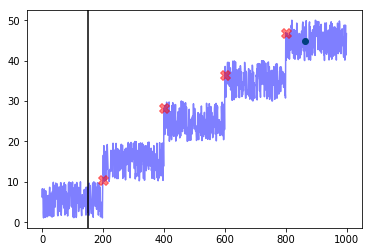

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.4
Best window threshold:  1.0
Corresponding window overall precision:  0.8
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.5714285714285714



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760]


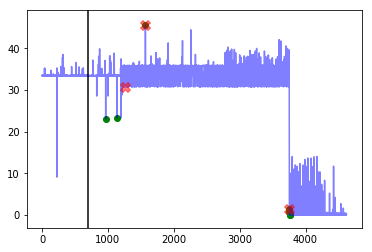




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3086, 3089, 3090]


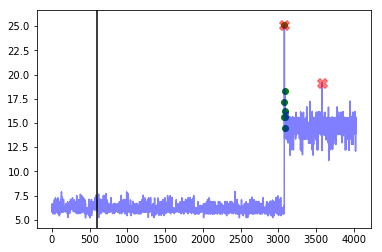




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586, 2587, 2588, 2589, 2591, 2592, 2593, 2594, 2595]


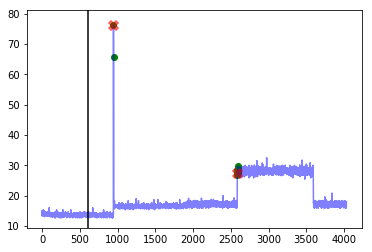




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887]


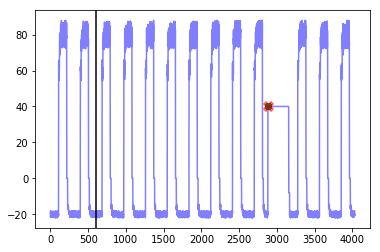




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


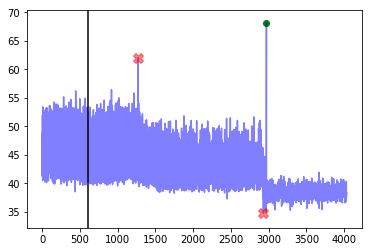




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588]


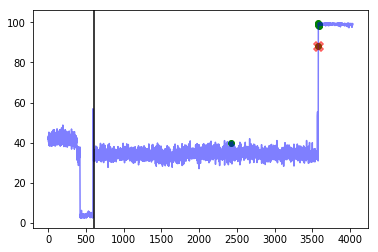




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 3000, 3001, 3002, 3003]


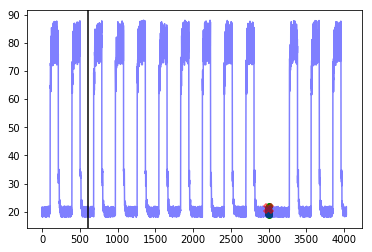




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


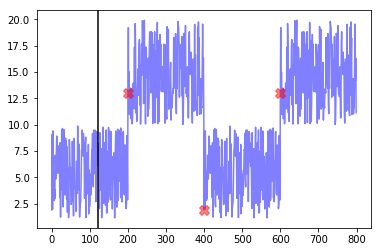




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 804, 864, 1000, 1008]


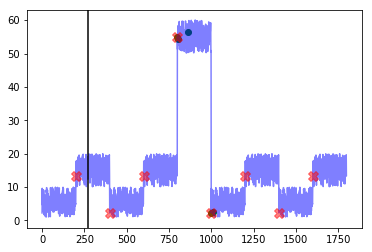




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


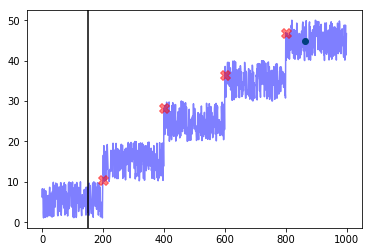

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.0
Best window threshold:  1.0
Corresponding window overall precision:  0.8
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.5714285714285714



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760]


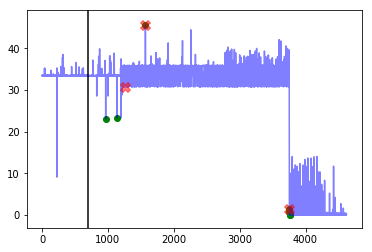




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3086, 3089, 3090]


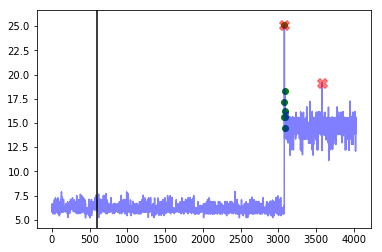




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586, 2587, 2588, 2589, 2591, 2592, 2593, 2594, 2595]


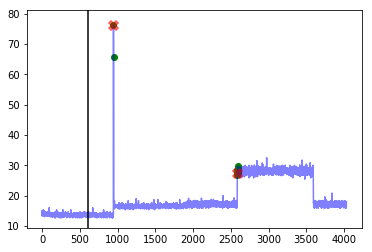




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887]


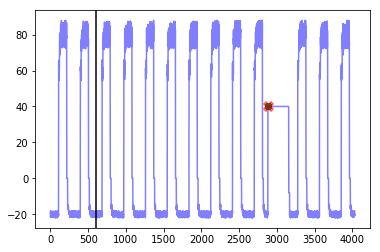




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


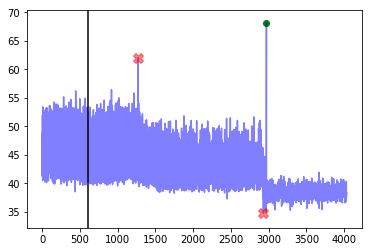




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588]


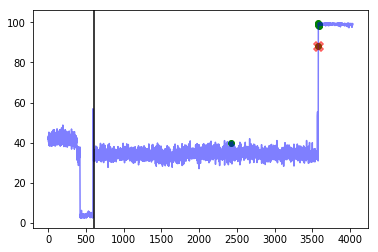




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 3000, 3001, 3002, 3003]


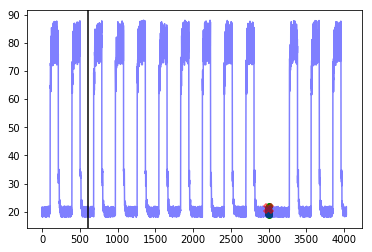




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


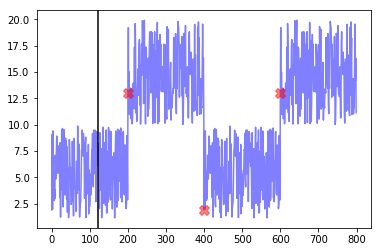




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 804, 864, 1000, 1008]


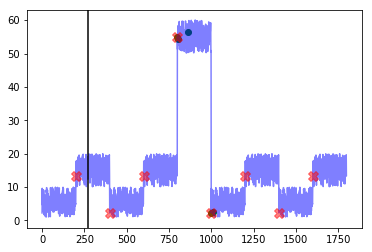




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


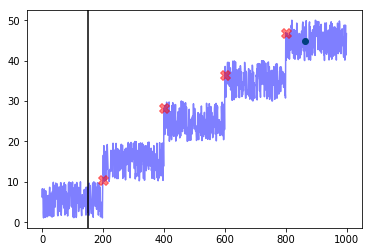

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.6
Best window threshold:  1.0
Corresponding window overall precision:  0.8
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.5714285714285714



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760]


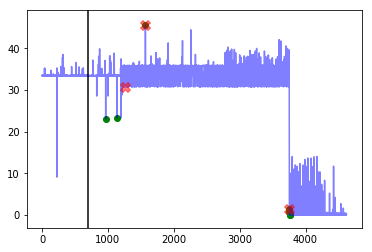




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3086, 3089, 3090]


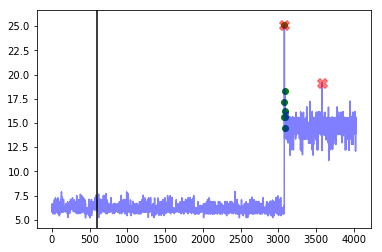




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586, 2587, 2588, 2589, 2591, 2592, 2593, 2594, 2595]


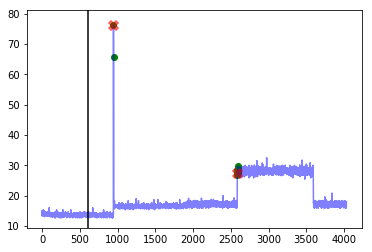




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887]


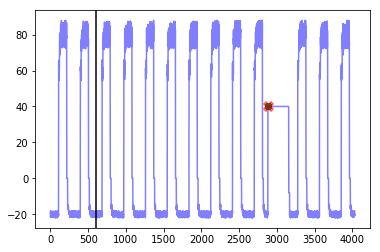




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


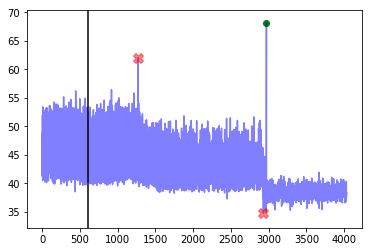




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588]


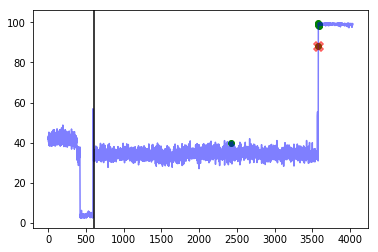




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 3000, 3001, 3002, 3003]


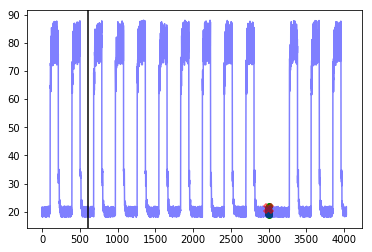




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


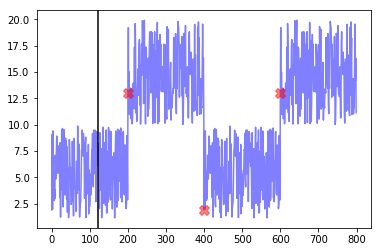




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 804, 864, 1000, 1008]


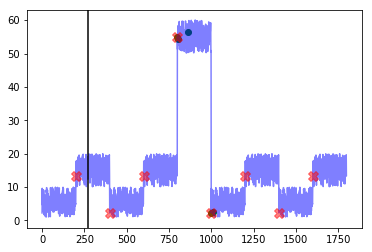




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


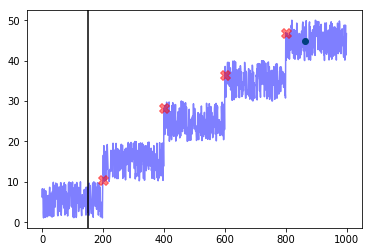

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.200000000000003
Best window threshold:  1.0
Corresponding window overall precision:  0.8
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.5714285714285714



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760]


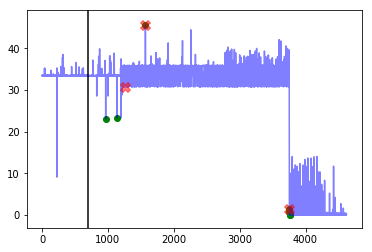




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3086, 3089, 3090]


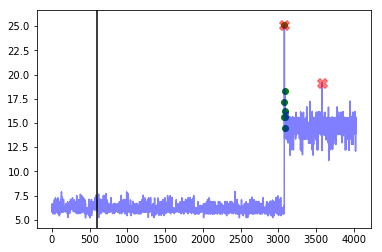




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586, 2587, 2588, 2589, 2591, 2592, 2593, 2594, 2595]


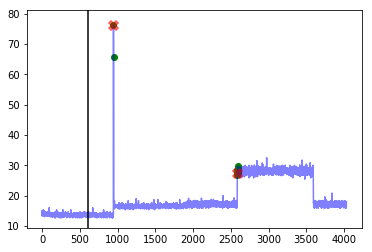




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887]


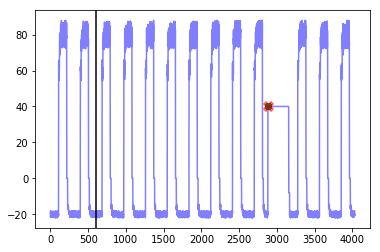




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


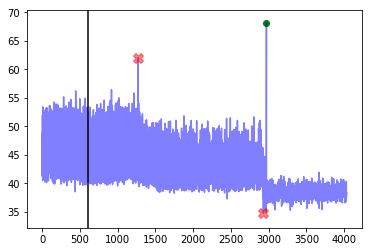




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588]


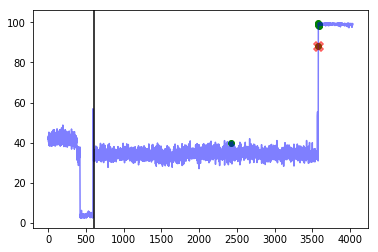




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 3000, 3001, 3002, 3003]


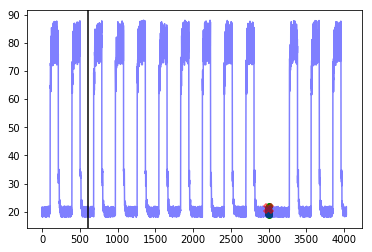




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


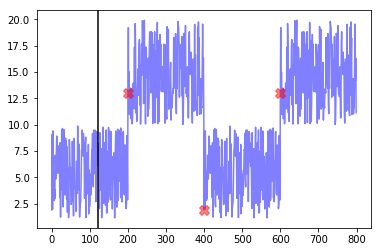




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 804, 864, 1000, 1008]


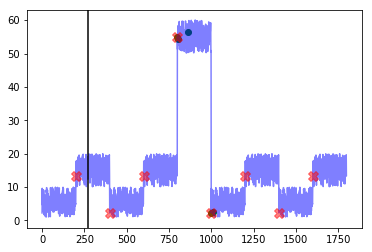




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


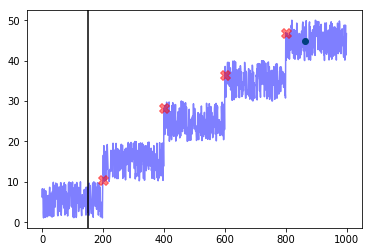

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.799999999999997
Best window threshold:  1.0
Corresponding window overall precision:  0.8
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.5714285714285714



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760]


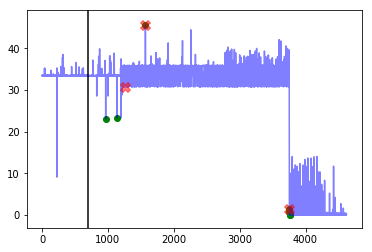




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3086, 3089, 3090]


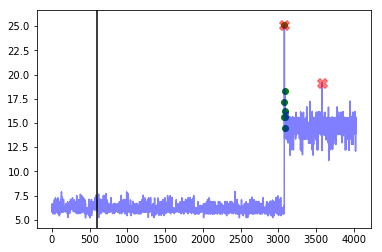




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586, 2587, 2588, 2589, 2591, 2592, 2593, 2594, 2595]


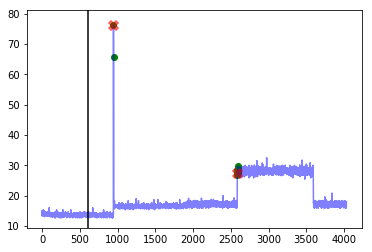




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887]


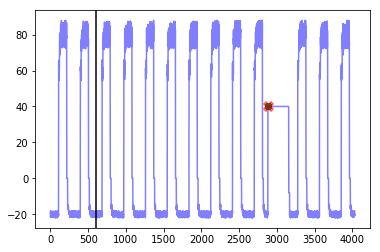




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


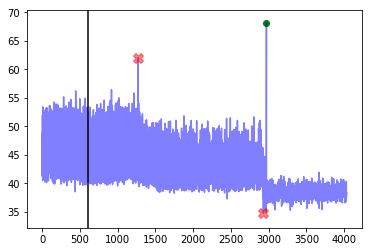




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588]


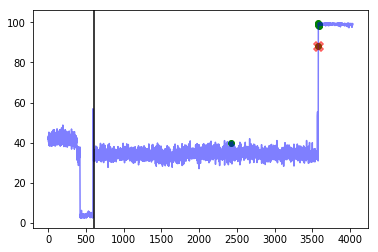




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 3000, 3001, 3002, 3003]


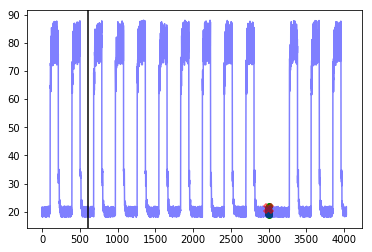




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


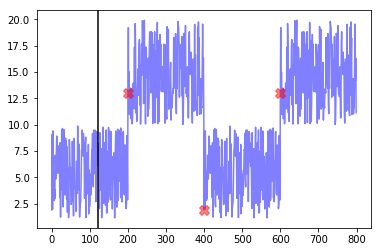




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 804, 864, 1000, 1008]


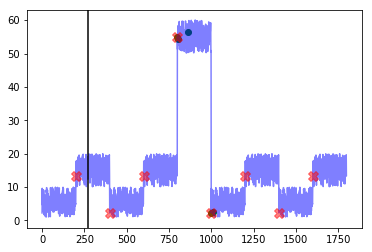




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


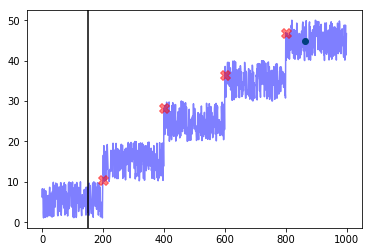

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.4
Best window threshold:  1.0
Corresponding window overall precision:  0.8
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.5714285714285714



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760]


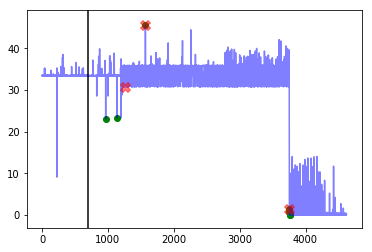




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3086, 3089, 3090]


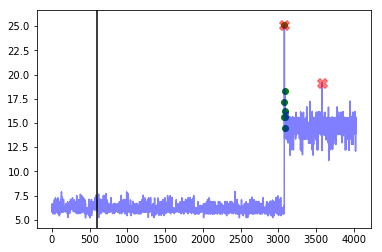




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586, 2587, 2588, 2589, 2591, 2592, 2593, 2594, 2595]


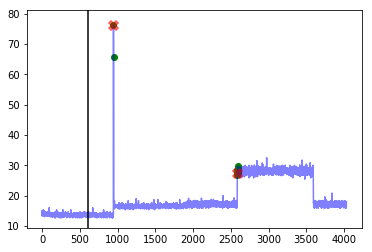




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887]


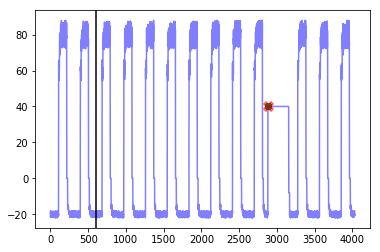




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


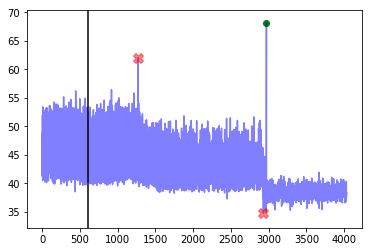




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588]


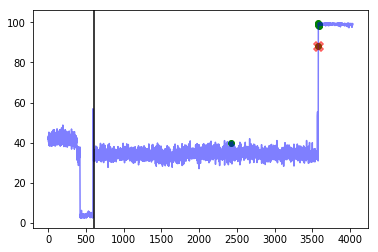




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 3000, 3001, 3002, 3003]


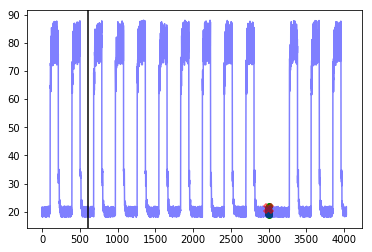




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


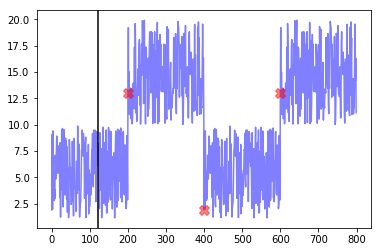




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 804, 864, 1000, 1008]


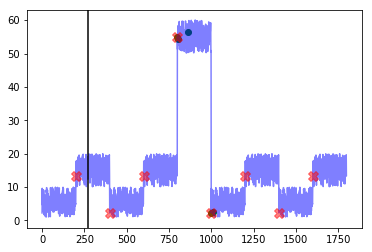




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


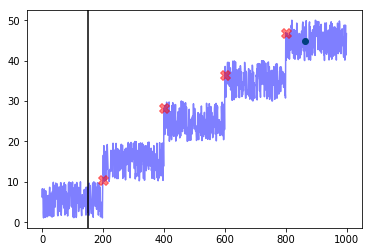

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.0
Best window threshold:  1.0
Corresponding window overall precision:  0.8
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.5714285714285714



--- grok_asg_anomaly ---
Corresponding window precision:  0.5
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [966, 1134, 1569, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760]


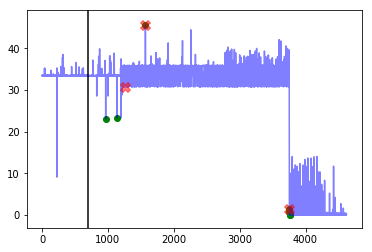




--- rds_cpu_utilization_cc0c53 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3080, 3081, 3082, 3083, 3086, 3089, 3090]


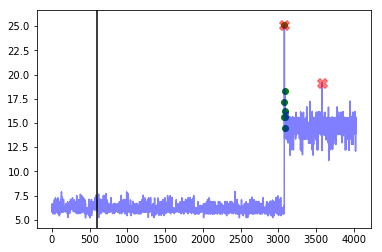




--- rds_cpu_utilization_e47b3b ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [946, 947, 2586, 2587, 2588, 2589, 2591, 2592, 2593, 2594, 2595]


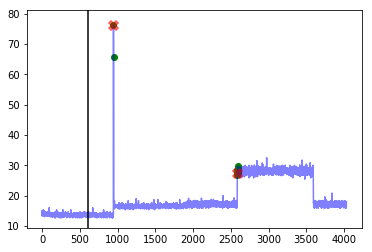




--- art_daily_flatmiddle ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2880, 2881, 2882, 2883, 2884, 2885, 2886, 2887]


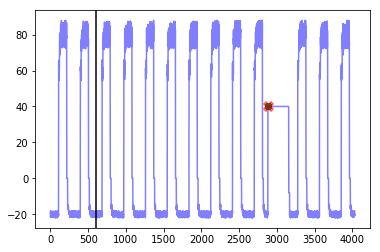




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


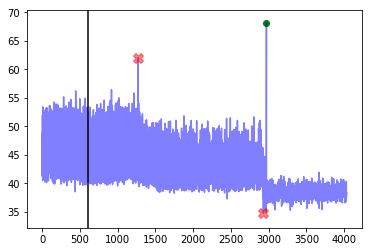




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588]


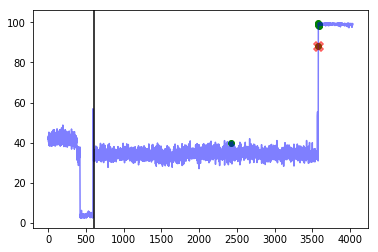




--- art_daily_nojump ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 3000, 3001, 3002, 3003]


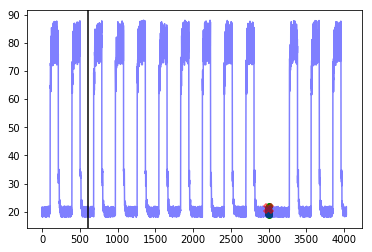




--- artificial_cd_1 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


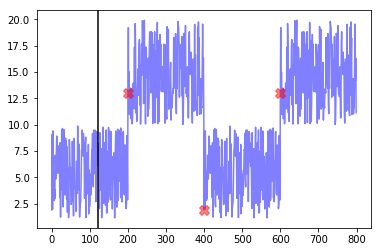




--- artificial_cd_2 ---
Corresponding window precision:  0.5
Corresponding window recall:  0.25
Corresponding window false positives:  2
Corresponding window false negatives:  6


Outlier indices as determined by best window threshold:  [800, 804, 864, 1000, 1008]


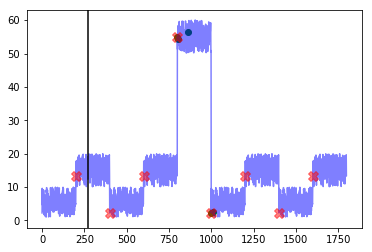




--- artificial_cd_3 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  4


Outlier indices as determined by best window threshold:  [864]


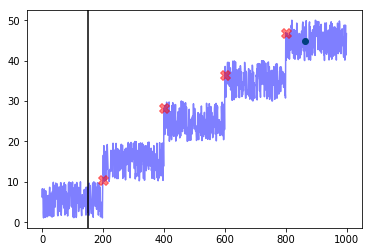

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 12.3
	 Best window threshold : 0.999
	 Corresponding window overall precision : 0.27380952380952384
	 Corresponding window overall recall : 0.8518518518518519
	 Corresponding window overall F score : 0.4144144144144144
False Positive Weight:  0.2
	 Minimum number of mistakes : 17.2
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.8
	 Corresponding window overall recall : 0.4444444444444444
	 Corresponding window overall F score : 0.5714285714285714
False Positive Weight:  0.3
	 Minimum number of mistakes : 17.8
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.8
	 Corresponding window overall recall : 0.4444444444444444
	 Corresponding window overall F score : 0.5714285714285714
False Positive Weight:  0.4
	 Minimum number of mistakes : 18.4
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.8
	 Corresponding window overall recall : 0.444444

In [32]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# NAB Score

    1. make a python 2.7 virtual environment
    2. pip install pandas
    3. git clone NAB
    4. pip install . in NAB

To obtain NAB scores for every method on the concept drift datasets, we must do the following:

# Have a new dataset?

1. add the new dataset csv with timestamp, value in respective folder in data folder. no missing time steps allowed

2. add the point anomaly dates to combined_labels.json in labels folder

3. add the anomaly windows to combined_windows.json  (start and end dates)

4. in results/null, include null_datasetname.csv with timestamp, value, label, and anomaly_score (all .5). You can just use the adclasses.create_result_csv function and delete irrelevant columns and fill anomaly_score with all .5s

WARNING: Some datasets we use are already in NAB, but they have missing time steps. Replace the dataset csv in the data folder with a prefilled version as the anomaly scores we use assume no missing time steps. You can just use the adclasses.create_result_csv function and delete irrelevant columns

In [33]:
dataset_name = "artificial_cd_1"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]


d = timedelta(minutes=5)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  2014-04-01 00:00:00
End date:  2014-04-03 18:35:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  800
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-03 18:35:00
Date Format:  %Y-%m-%d %H:%M:%S
(Timestamp('2014-04-01 15:35:00'), Timestamp('2014-04-01 17:45:00'))
(Timestamp('2014-04-02 08:15:00'), Timestamp('2014-04-02 10:25:00'))
(Timestamp('2014-04-03 00:55:00'), Timestamp('2014-04-03 03:05:00'))


In [34]:
dataset_name = "artificial_cd_2"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

d = timedelta(minutes=5)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  2014-04-01 00:00:00
End date:  2014-04-07 05:55:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  1800
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-07 05:55:00
Date Format:  %Y-%m-%d %H:%M:%S
(Timestamp('2014-04-01 15:45:00'), Timestamp('2014-04-01 17:35:00'))
(Timestamp('2014-04-02 08:25:00'), Timestamp('2014-04-02 10:15:00'))
(Timestamp('2014-04-03 01:05:00'), Timestamp('2014-04-03 02:55:00'))
(Timestamp('2014-04-03 17:45:00'), Timestamp('2014-04-03 19:35:00'))
(Timestamp('2014-04-04 10:25:00'), Timestamp('2014-04-04 12:15:00'))
(Timestamp('2014-04-05 03:05:00'), Timestamp('2014-04-05 04:55:00'))
(Timestamp('2014-04-05 19:45:00'), Timestamp('2014-04-05 21:35:00'))
(Timestamp('2014-04-06 12:25:00'), Timestamp('2014-04-06 14:15:00'))


In [35]:
dataset_name = "artificial_cd_3"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))


ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

d = timedelta(minutes=5)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  2014-04-01 00:00:00
End date:  2014-04-04 11:15:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  1000
Time step size:  5min
Start Date:  2014-04-01 00:00:00
End Date:  2014-04-04 11:15:00
Date Format:  %Y-%m-%d %H:%M:%S
(Timestamp('2014-04-01 15:40:00'), Timestamp('2014-04-01 17:40:00'))
(Timestamp('2014-04-02 08:20:00'), Timestamp('2014-04-02 10:20:00'))
(Timestamp('2014-04-03 01:00:00'), Timestamp('2014-04-03 03:00:00'))
(Timestamp('2014-04-03 17:40:00'), Timestamp('2014-04-03 19:40:00'))


# For every anomaly detection method "method_name" and dataset "dataset_name", do the following:

0. clear up previous NAB/results/

1. $ python scripts/create_new_detector.py --detector method_name

this creates the method_name folder in results folder with a bunch of datasets folders that are empty. delete the irrelevant ones

2. for every characteristic relevant dataset, create csvs with columns like so: timestamp, value, anomaly_score, label. place in appropriate locations in results/method_name/

3. replace datasets with prefill

4. $ python run.py -d method_name --optimize --score --normalize

WARNING: HAVE TO MAKE CHANGE TO NAB function convertAnomalyScoresToDetections in util.py bc it will think values are strings

In [36]:
prepath="/home/cfreeman/Documents/NextIT/test_python_2/NAB/results_conceptdrift" + window_size + "/"

# SARIMA

Final score for 'SARIMA' detector on 'auto_reward_low_FP_rate' profile = 39.48

Final score for 'SARIMA' detector on 'auto_reward_low_FN_rate' profile = 55.75

Final score for 'SARIMA' detector on 'auto_standard' profile = 41.22


In [37]:
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_auto"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_auto"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_auto"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_auto"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "SARIMA_auto"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# Prophet

Final score for 'Prophet' detector on 'reward_low_FP_rate' profile = 34.63

Final score for 'Prophet' detector on 'reward_low_FN_rate' profile = 49.46

Final score for 'Prophet' detector on 'standard' profile = 35.10


In [38]:
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "Prophet"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

#  GLM

Final score for 'GLM' detector on 'reward_low_FP_rate' profile = 35.92

Final score for 'GLM' detector on 'reward_low_FN_rate' profile = 55.10

Final score for 'GLM' detector on 'standard' profile = 39.05


In [39]:
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "GLM"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "GLM"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "GLM"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "GLM"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "GLM"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# HTM

Final score for 'HTM' detector on 'reward_low_FP_rate' profile = 39.67

Final score for 'HTM' detector on 'reward_low_FN_rate' profile = 54.73

Final score for 'HTM' detector on 'standard' profile = 40.31


In [40]:
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "HTM"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# Windowed Gaussian

Final score for 'windowed' detector on 'gaussian_reward_low_FP_rate' profile = 32.47

Final score for 'windowed' detector on 'gaussian_reward_low_FN_rate' profile = 49.10

Final score for 'windowed' detector on 'gaussian_standard' profile = 33.43


In [41]:
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "windowed_gaussian"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

# HOTSAX


Final score for 'hotsax' detector on 'reward_low_FP_rate' profile = 34.97

Final score for 'hotsax' detector on 'reward_low_FN_rate' profile = 50.43

Final score for 'hotsax' detector on 'standard' profile = 36.37


In [42]:
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "grok_asg_anomaly"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-01-20 08:30:00",
                      "2014-01-21 10:45:00",
                      "2014-01-29 00:45:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "rds_cpu_utilization_cc0c53"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-25 07:15:00",
                      "2014-02-27 00:50:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "rds_cpu_utilization_e47b3b"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-13 06:52:00",
                      "2014-04-18 23:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "art_daily_flatmiddle"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]


adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "art_daily_nojump"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-11 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "artificial_cd_1"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "artificial_cd_2"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00",
                      "2014-04-04 11:20:00",
                      "2014-04-05 04:00:00",
                      "2014-04-05 20:40:00",
                      "2014-04-06 13:20:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="artificialWithAnomaly"
method_name = "hotsax"
dataset_name = "artificial_cd_3"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-01 16:40:00",
                      "2014-04-02 09:20:00",
                      "2014-04-03 02:00:00",
                      "2014-04-03 18:40:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###